# Setup

Import basic packages needed for this study.

In [1]:
import pandas as pd
import numpy as np

Data visualization setup.

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20,10

For normalizing data.

In [3]:
from sklearn.preprocessing import MinMaxScaler

# S&P 500 Data Set

In [4]:
dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')
all_stocks = pd.read_csv('all_stocks_5yr.csv', parse_dates=['date'], index_col='date',date_parser=dateparse)

In [5]:
all_stocks.head()

,open,high,low,close,volume,Name
date,,,,,,
2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL


In [6]:
all_stocks.tail()

,open,high,low,close,volume,Name
date,,,,,,
2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS
2018-02-07,72.70,75.00,72.69,73.86,4534912,ZTS


In [7]:
all_stocks.describe()

,open,high,low,close,volume
count,619029.000000,619032.000000,619032.000000,619040.000000,6.190400e+05
mean,83.023334,83.778311,82.256096,83.043763,4.321823e+06
std,97.378769,98.207519,96.507421,97.389748,8.693610e+06
min,1.620000,1.690000,1.500000,1.590000,0.000000e+00
25%,40.220000,40.620000,39.830000,40.245000,1.070320e+06
50%,62.590000,63.150000,62.020000,62.620000,2.082094e+06
75%,94.370000,95.180000,93.540000,94.410000,4.284509e+06
max,2044.000000,2067.990000,2035.110000,2049.000000,6.182376e+08


For this research, we will focus on the leading stocks from 11 industries recommended by [Bank of America](https://money.usnews.com/investing/stock-market-news/slideshows/top-stocks-to-buy-in-different-sectors):
- Communication services: Walt Disney Co. (DIS)
- Consumer discretionary: General Motors Co. (GM)
- Consumer staples: Molson Coors Brewing Co. (TAP)
- Energy: Exxon Mobil Corp. (XOM)
- Financials: Morgan Stanley (MS)
- Health care: CVS Health Corp. (CVS)
- Industrials: Raytheon Co,( RTN)
- Information technology: Microsoft Corps. (MSFT)
- Materials: International Paper Co. (IP)
- Real estate: Simon Property Group (SPG)
- Utilities: Public Service Enterprise Group (PEG)

In [8]:
names=['DIS', 'GM', 'TAP', 'XOM', 'MS', 'CVS', 'RTN', 'MSFT', 'IP', 'SPG', 'PEG']
selected_stocks=all_stocks.loc[all_stocks['Name'].isin(names)]

In [9]:
selected_stocks['Name'].unique()

array(['CVS', 'DIS', 'GM', 'IP', 'MSFT', 'MS', 'PEG', 'RTN', 'SPG', 'TAP',
       'XOM'], dtype=object)

In [10]:
selected_stocks.describe()

,open,high,low,close,volume
count,13849.000000,13849.000000,13849.000000,13849.000000,1.384900e+04
mean,76.816266,77.416210,76.198465,76.822901,8.885536e+06
std,43.969399,44.274368,43.640289,43.960025,1.150253e+07
min,20.370000,20.630000,20.160000,20.310000,1.369200e+05
25%,42.091000,42.495000,41.660000,42.080000,2.008450e+06
50%,67.100000,67.890000,66.660000,67.150000,4.962794e+06
75%,96.920000,97.620000,96.220000,96.940000,1.125997e+07
max,226.860000,229.100000,226.260000,227.600000,2.483542e+08


No missing values in our subset. 

In [11]:
selected_stocks.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13849 entries, 2013-02-08 to 2018-02-07
Data columns (total 6 columns):
open      13849 non-null float64
high      13849 non-null float64
low       13849 non-null float64
close     13849 non-null float64
volume    13849 non-null int64
Name      13849 non-null object
dtypes: float64(4), int64(1), object(1)
memory usage: 757.4+ KB


In [12]:
selected_stocks.index.min()

Timestamp('2013-02-08 00:00:00')

In [13]:
selected_stocks.index.max()

Timestamp('2018-02-07 00:00:00')

Load each selected stock's data into a dictionary with key is its ticker symbol.

In [14]:
CVS=selected_stocks.loc[selected_stocks['Name']=='CVS']
DIS=selected_stocks.loc[selected_stocks['Name']=='DIS']
GM=selected_stocks.loc[selected_stocks['Name']=='GM']
IP=selected_stocks.loc[selected_stocks['Name']=='IP']
MSFT=selected_stocks.loc[selected_stocks['Name']=='MSFT']
MS=selected_stocks.loc[selected_stocks['Name']=='MS']
PEG=selected_stocks.loc[selected_stocks['Name']=='PEG']
RTN=selected_stocks.loc[selected_stocks['Name']=='RTN']
SPG=selected_stocks.loc[selected_stocks['Name']=='SPG']
TAP=selected_stocks.loc[selected_stocks['Name']=='TAP']
XOM=selected_stocks.loc[selected_stocks['Name']=='XOM']

stocks={'CVS': CVS, 'DIS': DIS, 'GM': GM, 'IP': IP, 'MSFT': MSFT, 'MS': MS, 'PEG': PEG, 'RTN': RTN, 'SPG': SPG, 'TAP': TAP, 'XOM': XOM}

The goal of stock market investor's is to buy at low and sell at high. While most time series forecasting of stock price focues on predicting close price, we believe investors may be able to benefit more of knowing the high and low of a particular stock so they can decide their sell/buy strategy. Therefore, our reserach will focus on predicting the high and low of selected stocks.

Plot daily high and daily low of each stock from 2013-02-08 to 2018-02-07. The following codes were adapted from [Kaggle Kernel](https://www.kaggle.com/humamfauzi/multiple-stock-prediction-using-single-nn).

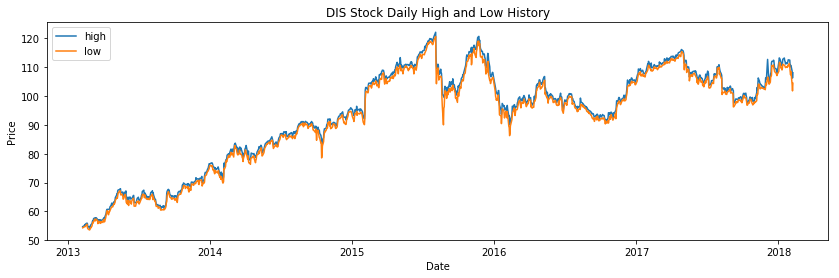

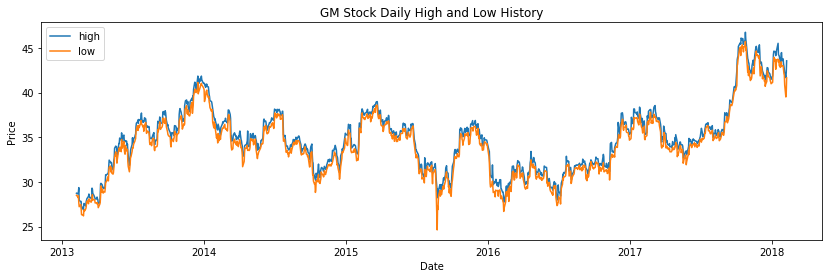

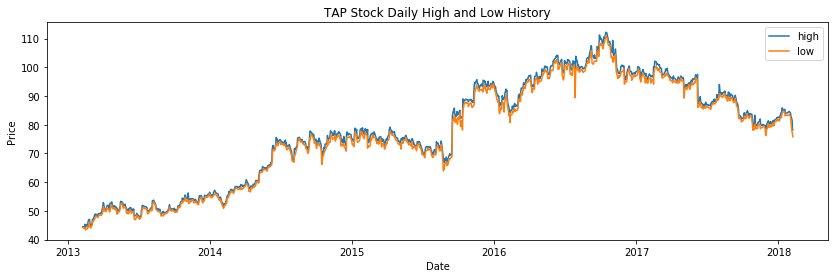

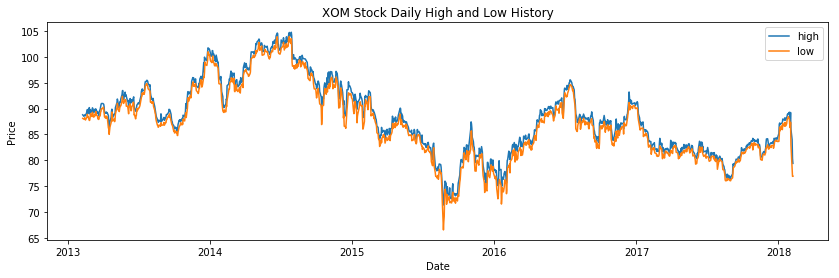

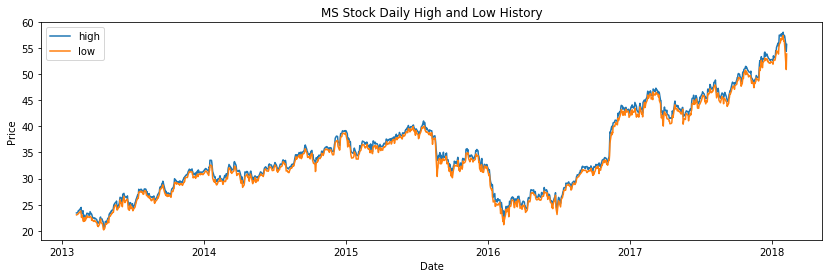

...

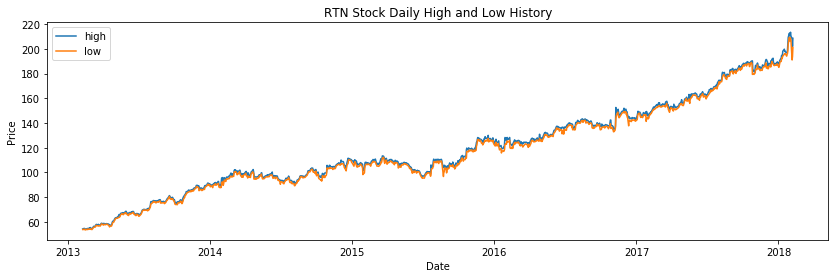

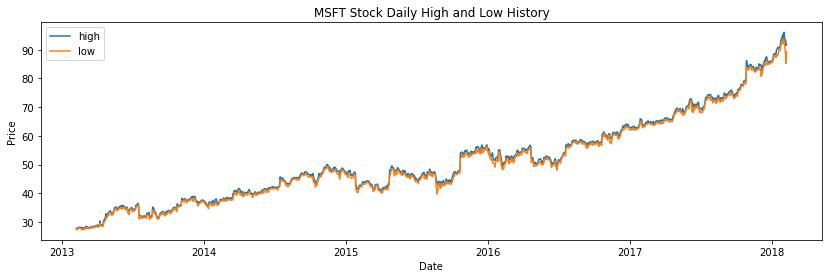

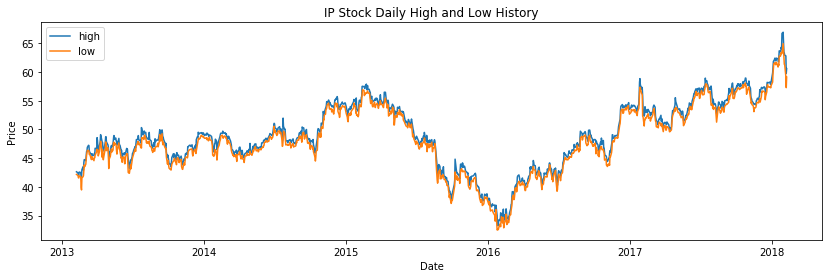

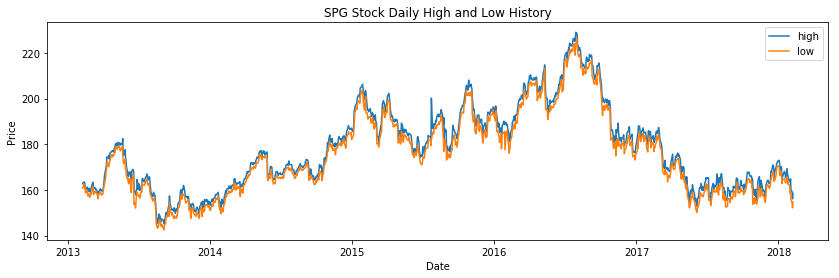

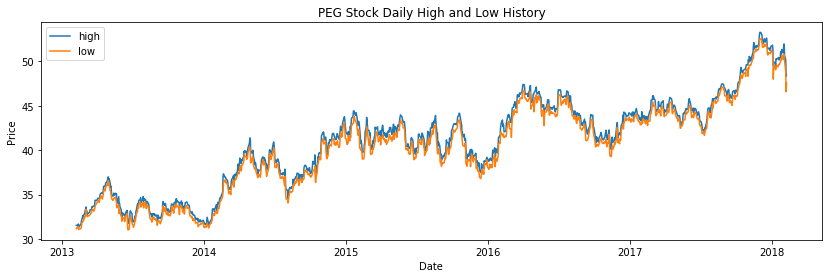

In [15]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

for i in names:
    plt.figure(figsize=(14,4))
    plt.plot(stocks[i]['high'])
    plt.plot(stocks[i]['low'])
    plt.ylabel("Price")
    plt.xlabel("Date")
    plt.legend(["high", "low"])
    plt.title(i+' Stock Daily High and Low History')

*Above plots show that (1) the daily flucuation of RTN and MSFT is consitently small as its history daily high almost perfectly overlaps with its history daily low. Both stocks show steady upward trend. This indicates that RTN and MSFT are suitable for long-term investment with low risk preference ; (2) there were more flucuation on daily basis for stock GM, XOM, SRG, and PEG as their daily high line is more notably seprated from its daily low. The trend in their pricing through the time frame also lacks consistence as their prices fluctuate up and down. This indicates that these stocks may be favored by short-term investors who are willing to take higher risks. (3) for all stocks, the majority of the time its daily low fluctuates along with its daily high. We did notice exemptions on certain days for some of the stocks where the range between its daily high and daily low were notably wider than usual either because of a significant drop in its daily low or sttrong peak in its daily high. It's suggested to identify these dates and futher examine the trade volume as well as related news on the specific days to see if any correlations between the stock's performance and these factors.* 

For this research, we will use records prior to 2017-02-07 as train set and the rest as test.

In [16]:
def split(dataframe, border, col):
    return dataframe.loc[:border,col], dataframe.loc[border:,col]

d_high = {}
for i in names:
    d_high[i] = {}
    d_high[i]["Train"], d_high[i]["Test"] = split(selected_stocks.loc[selected_stocks['Name']==i], "2017-02-07", ('high'))


d_low = {}
for i in names:
    d_low[i] = {}
    d_low[i]["Train"], d_low[i]["Test"] = split(selected_stocks.loc[selected_stocks['Name']==i], "2017-02-07", ('low'))

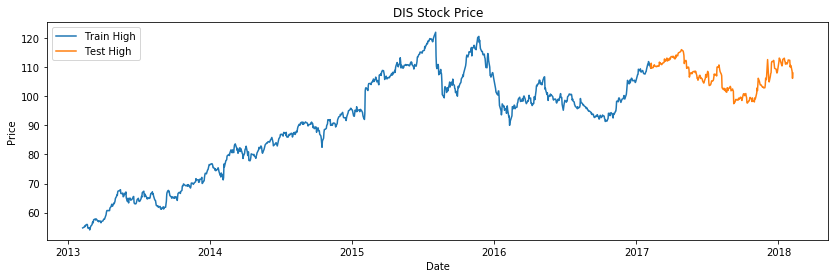

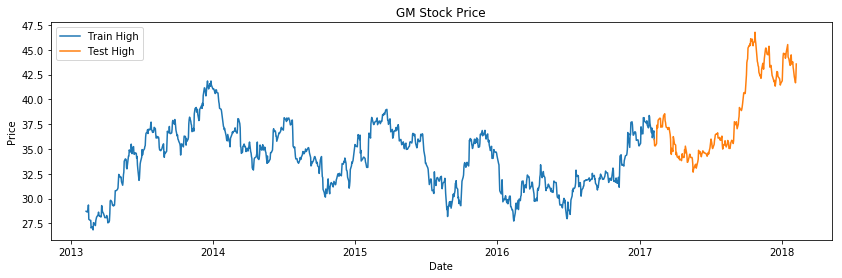

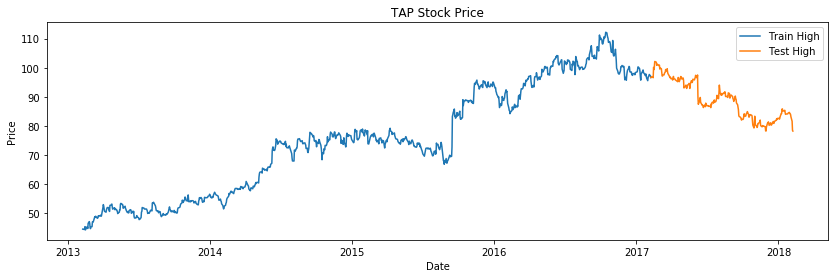

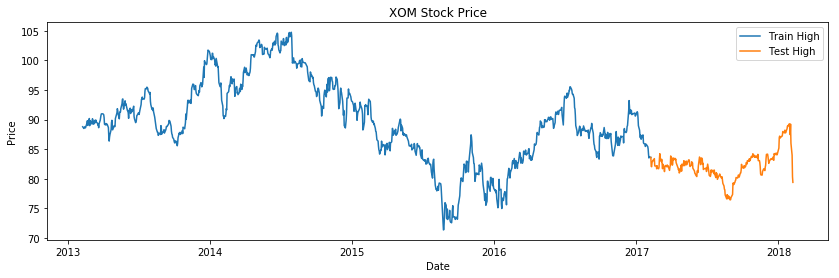

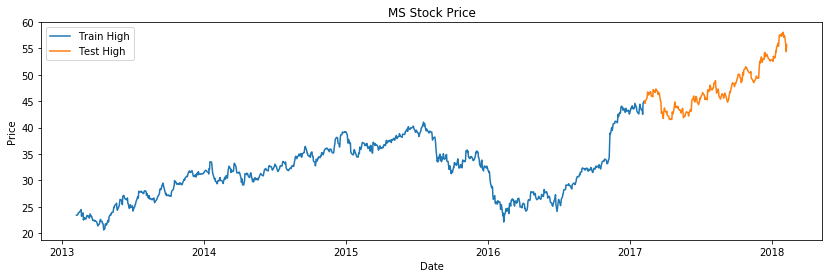

...

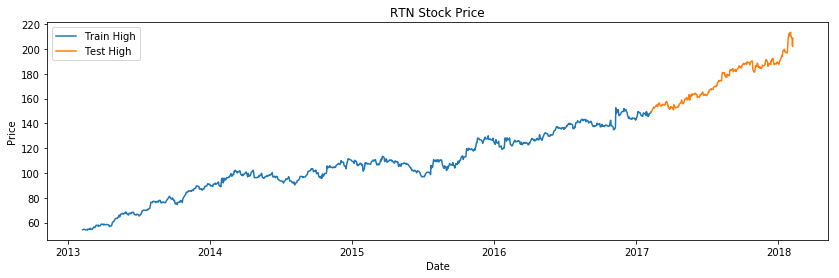

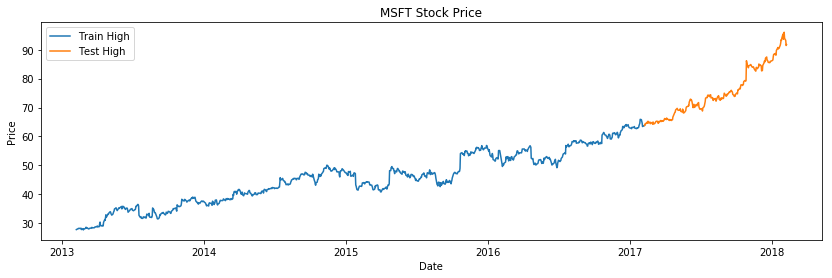

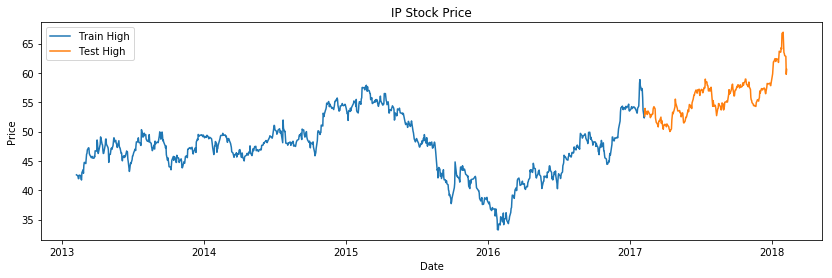

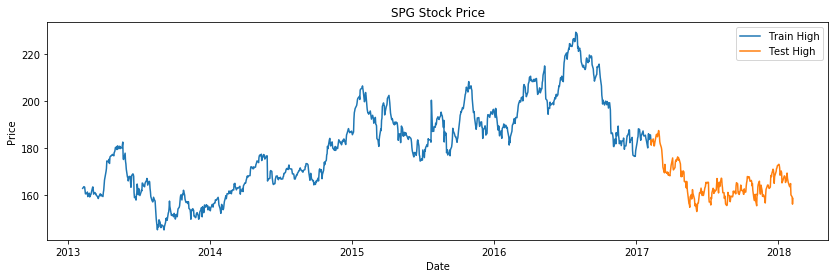

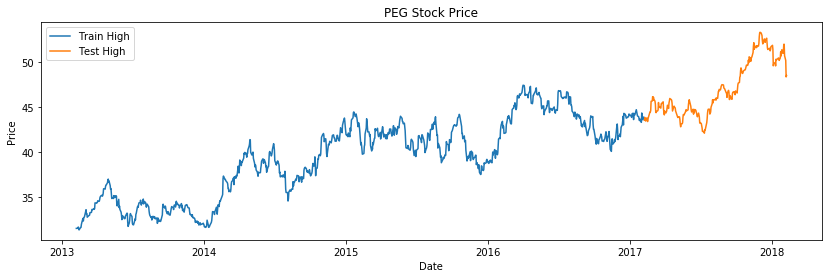

In [17]:
for i in names:
    plt.figure(figsize=(14,4))
    plt.plot(d_high[i]["Train"])
    plt.plot(d_high[i]["Test"])
    plt.ylabel("Price")
    plt.xlabel("Date")
    plt.legend(["Train High",  'Test High'])
    plt.title(i + " Stock Price")

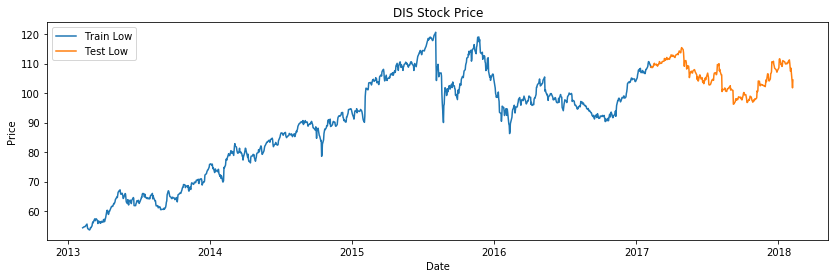

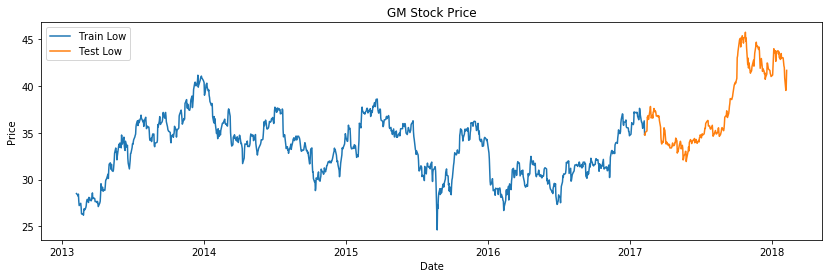

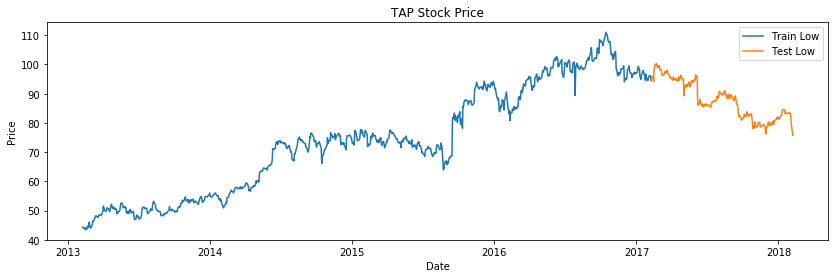

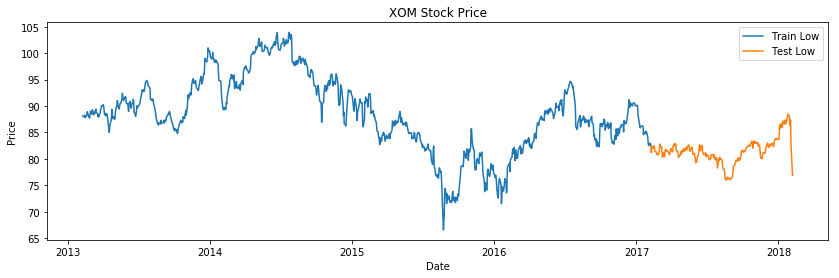

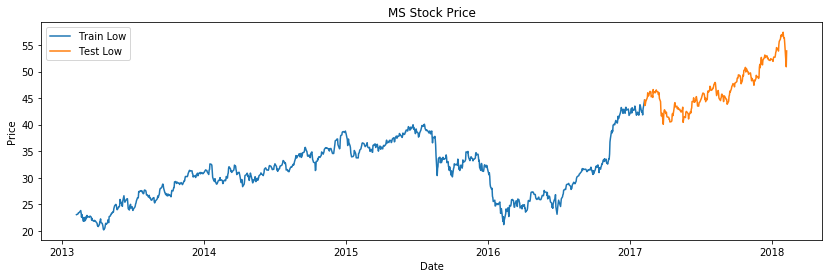

...

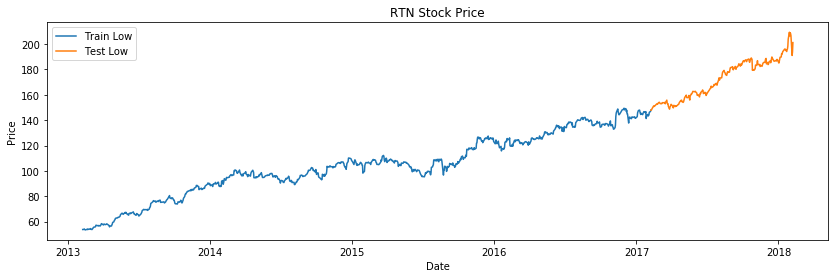

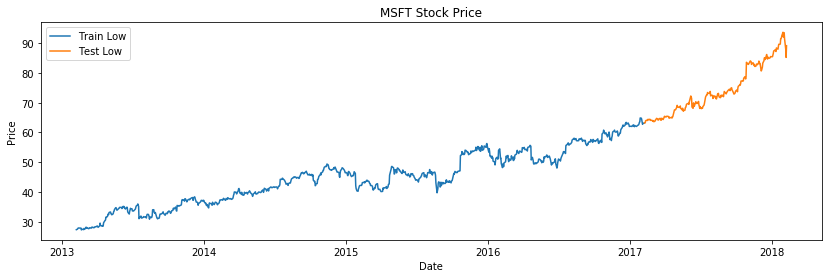

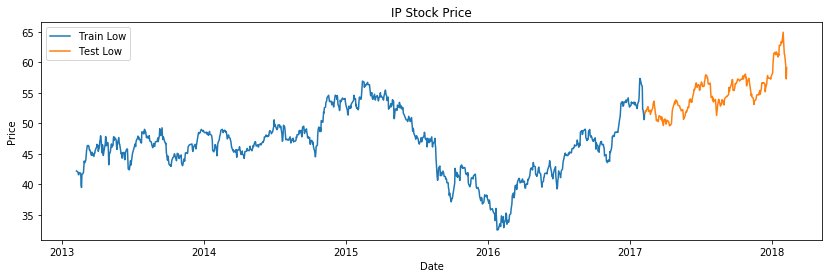

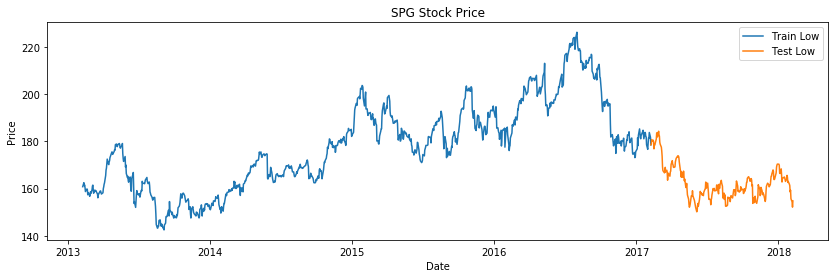

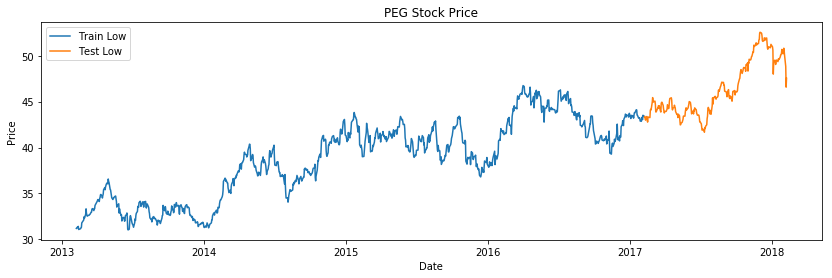

In [18]:
for i in names:
    plt.figure(figsize=(14,4))
    plt.plot(d_low[i]["Train"])
    plt.plot(d_low[i]["Test"])
    plt.ylabel("Price")
    plt.xlabel("Date")
    plt.legend(["Train Low",  'Test Low'])
    plt.title(i + " Stock Price")

# Time Series Analysis with LSTM

Scale the data to be between the range of 0 and 1.

In [19]:
transform_train_high = {}
transform_test_high = {}
scaler_high={}

for num, i in enumerate(names):
    sc = MinMaxScaler(feature_range=(0,1))
    a0 = np.array(d_high[i]["Train"])
    a1 = np.array(d_high[i]["Test"])
    a0 = a0.reshape(a0.shape[0],1)
    a1 = a1.reshape(a1.shape[0],1)
    transform_train_high[i] = sc.fit_transform(a0)
    transform_test_high[i] = sc.fit_transform(a1)
    scaler_high[i]=sc
    
del a0
del a1

In [20]:
transform_train_low = {}
transform_test_low = {}
scaler_low={}

for num, i in enumerate(names):
    sc = MinMaxScaler(feature_range=(0,1))
    a0 = np.array(d_low[i]["Train"])
    a1 = np.array(d_low[i]["Test"])
    a0 = a0.reshape(a0.shape[0],1)
    a1 = a1.reshape(a1.shape[0],1)
    transform_train_low[i] = sc.fit_transform(a0)
    transform_test_low[i] = sc.fit_transform(a1)
    scaler_low[i]=sc
    
del a0
del a1

In [21]:
for i in names:
    print('\n Stock:', i)
    print(transform_train_high[i][:5])


 Stock: DIS
[[0.01006687]
 [0.01388787]
 [0.0149166 ]
 [0.01859064]
 [0.01668014]]

 Stock: GM
[[0.12533333]
 [0.12      ]
 [0.12666667]
 [0.13466667]
 [0.16733333]]

 Stock: TAP
[[0.00397293]
 [0.0032372 ]
 [0.00176574]
 [0.00573867]
 [0.01647881]]

 Stock: XOM
[[0.52186938]
 [0.51318155]
 [0.51647693]
 [0.52097064]
 [0.52216896]]

 Stock: MS
[[0.11393443]
 [0.11639344]
 [0.12377049]
 [0.13278689]
 [0.13319672]]

 Stock: CVS
[[0.00646294]
 [0.00662252]
 [0.00518631]
 [0.00319157]
 [0.01715471]]

 Stock: RTN
[[0.00101666]
 [0.00518079]
 [0.00599331]
 [0.00375889]
 [0.0006104 ]]

 Stock: MSFT
[[0.00287131]
 [0.00835291]
 [0.01044114]
 [0.01331245]
 [0.01200731]]

 Stock: IP
[[0.36651054]
 [0.36104606]
 [0.35558158]
 [0.34074941]
 [0.34192037]]

 Stock: SPG
[[0.21045736]
 [0.21879466]
 [0.21760362]
 [0.21665079]
 [0.19938066]]

 Stock: PEG
[[0.0105985 ]
 [0.01122195]
 [0.01433915]
 [0.01995012]
 [0.01246883]]


In [22]:
for i in names:
    print('\n Stock:', i)
    print(transform_train_low[i][:5])


 Stock: DIS
[[0.01074306]
 [0.01492092]
 [0.01641301]
 [0.01603999]
 [0.01671143]]

 Stock: GM
[[0.23493794]
 [0.22585528]
 [0.21919467]
 [0.23130487]
 [0.18468059]]

 Stock: TAP
[[0.01256653]
 [0.00916617]
 [0.00768776]
 [0.01286221]
 [0.0078356 ]]

 Stock: XOM
[[0.57647059]
 [0.57272727]
 [0.57139037]
 [0.57994652]
 [0.57513369]]

 Stock: MS
[[0.11774325]
 [0.12142273]
 [0.12428455]
 [0.13205233]
 [0.13246116]]

 Stock: CVS
[[0.01314468]
 [0.01539411]
 [0.01475141]
 [0.00960987]
 [0.01137728]]

 Stock: RTN
[[0.00333611]
 [0.00396163]
 [0.00813178]
 [0.00364887]
 [0.00093932]]

 Stock: MSFT
[[0.00212427]
 [0.00716941]
 [0.01380775]
 [0.01725969]
 [0.01699416]]

 Stock: IP
[[0.38882031]
 [0.38319106]
 [0.3815827 ]
 [0.36509704]
 [0.36389078]]

 Stock: SPG
[[0.21864184]
 [0.23893066]
 [0.22370211]
 [0.22747345]
 [0.21339062]]

 Stock: PEG
[[0.01049285]
 [0.0200318 ]
 [0.01494436]
 [0.02448331]
 [0.00286169]]


In [23]:
import tensorflow
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM

Using TensorFlow backend.


**Step 1: Predicting high/low using past 30 observations. We will predict the test set using past 30 from the train data. We will run our experiment in a 2x2 factorial design. Factor 1: number of LSTM layers: 2 vs. 4, Factor 2: with vs. without dropout regulation.**

Shape the tran and test set in prepration for the LSTM neural network.

In [24]:
trainset_high = {}
testset_high = {}
for j in names:
    trainset_high[j] = {}
    X_train = []
    y_train = []
    for i in range(30,1007):
        X_train.append(transform_train_high[j][i-30:i])
        y_train.append(transform_train_high[j][i])
    X_train, y_train = np.array(X_train), np.array(y_train)
    trainset_high[j]["X"] = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))
    trainset_high[j]["y"] = y_train
    
    testset_high[j] = {}
    X_test = []
    y_test = []    
    for i in range(30, 253):
        X_test.append(transform_test_high[j][i-30:i])
        y_test.append(transform_test_high[j][i])
    X_test, y_test = np.array(X_test), np.array(y_test)
    testset_high[j]["X"] = np.reshape(X_test, (X_test.shape[0], X_train.shape[1], 1))
    testset_high[j]["y"] = y_test

In [25]:
trainset_low = {}
testset_low = {}
for j in names:
    trainset_low[j] = {}
    X_train = []
    y_train = []
    for i in range(30,1007):
        X_train.append(transform_train_high[j][i-30:i])
        y_train.append(transform_train_high[j][i])
    X_train, y_train = np.array(X_train), np.array(y_train)
    trainset_low[j]["X"] = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))
    trainset_low[j]["y"] = y_train
    
    testset_low[j] = {}
    X_test = []
    y_test = []    
    for i in range(30, 253):
        X_test.append(transform_test_high[j][i-30:i])
        y_test.append(transform_test_high[j][i])
    X_test, y_test = np.array(X_test), np.array(y_test)
    testset_low[j]["X"] = np.reshape(X_test, (X_test.shape[0], X_train.shape[1], 1))
    testset_low[j]["y"] = y_test

Model 1: 2 LSTM layer with 50 units of each layer.

In [26]:
model1 = Sequential()
model1.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
model1.add(LSTM(units=50))
model1.add(Dense(units=1))
model1.compile(optimizer='rmsprop', loss='mean_squared_error')

Instructions for updating:
Colocations handled automatically by placer.


Fitting Model 1 to train set with validation_split set to 0.2.

In [27]:
history_1high={}
for i in names:
    print("Fitting to", i)
    history_1high[i]=model1.fit(trainset_high[i]["X"], trainset_high[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Instructions for updating:
Use tf.cast instead.
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 1s 2ms/step - loss: 0.0608 - val_loss: 0.0036
Epoch 2/10
781/781 [==============================] - 0s 484us/step - loss: 0.0062 - val_loss: 0.0051
Epoch 3/10
781/781 [==============================] - 0s 489us/step - loss: 0.0070 - val_loss: 0.0018
Epoch 4/10
781/781 [==============================] - 0s 459us/step - loss: 0.0055 - val_loss: 0.0012
Epoch 5/10
781/781 [==============================] - 0s 498us/step - loss: 0.0057 - val_loss: 0.0044
Epoch 6/10
781/781 [==============================] - 0s 439us/step - loss: 0.0054 - val_loss: 0.0064
Epoch 7/10
781/781 [==============================] - 0s 471us/step - loss: 0.0021 - val_loss: 0.0094
Epoch 8/10
781/781 [==============================] - 0s 479us/step - loss: 0.0051 - val_loss: 0.0109
Epoch 9/10
781/781 [==============================] - 0s 456us/step - loss: 0

781/781 [==============================] - 0s 538us/step - loss: 7.9547e-04 - val_loss: 3.9690e-04
Epoch 3/10
781/781 [==============================] - 0s 601us/step - loss: 6.6519e-04 - val_loss: 0.0052
Epoch 4/10
781/781 [==============================] - 0s 557us/step - loss: 7.3885e-04 - val_loss: 3.9641e-04
Epoch 5/10
781/781 [==============================] - 0s 557us/step - loss: 4.1260e-04 - val_loss: 8.0575e-04
Epoch 6/10
781/781 [==============================] - 0s 585us/step - loss: 9.0441e-04 - val_loss: 3.5851e-04
Epoch 7/10
781/781 [==============================] - 0s 559us/step - loss: 7.8356e-04 - val_loss: 3.2927e-04
Epoch 8/10
781/781 [==============================] - 0s 562us/step - loss: 6.4661e-04 - val_loss: 3.1537e-04
Epoch 9/10
781/781 [==============================] - 0s 566us/step - loss: 7.3700e-04 - val_loss: 8.9390e-04
Epoch 10/10
781/781 [==============================] - 0s 567us/step - loss: 4.8468e-04 - val_loss: 4.6633e-04
Fitting to IP
Train on 7

Plot the train and validation loss throughout training.

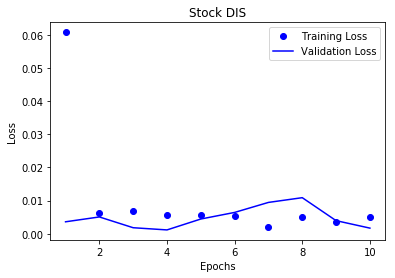

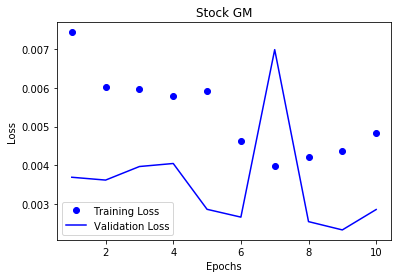

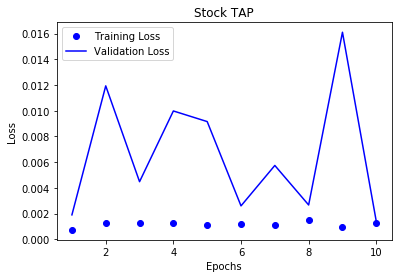

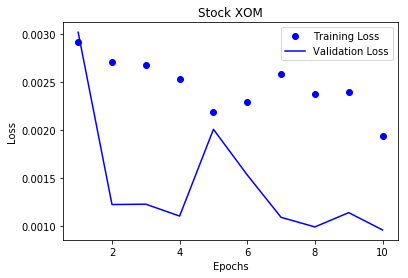

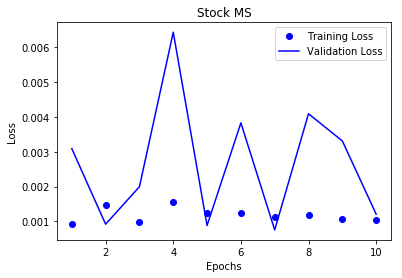

...

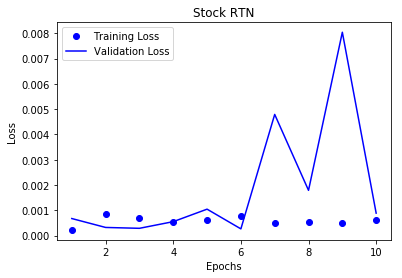

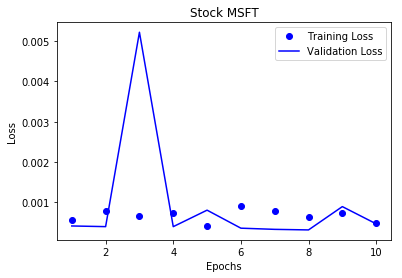

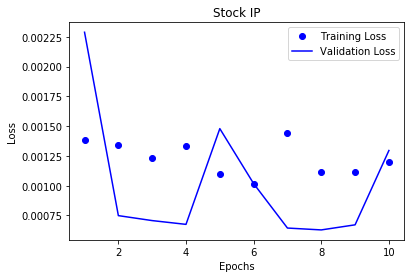

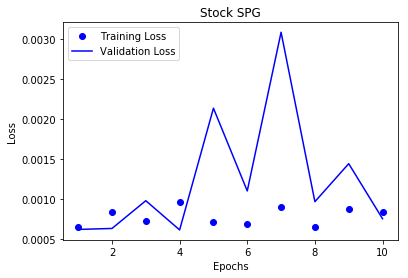

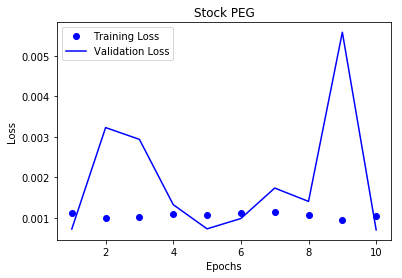

In [28]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_1high[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_1high[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

*While some stock like GM, XOM, and IP showed notable improvement on train loss throughout the training, most stocks' train loss jump around a certain line. This indicate that our model suffered performance bottle neck on those stocks data.* 

Plot predicted value against the scaled actual daily high of test set. Store the truncated MSE result for later comparison analysis.

In [29]:
def truncate(n, decimals=0):
    multiplier = 10 ** decimals
    return int(n * multiplier) / multiplier

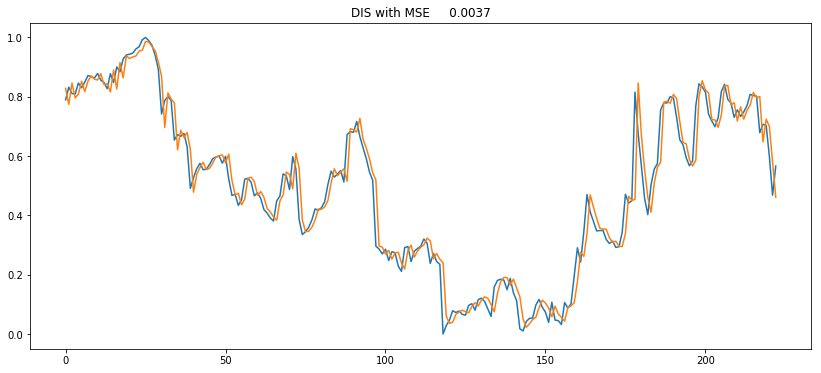

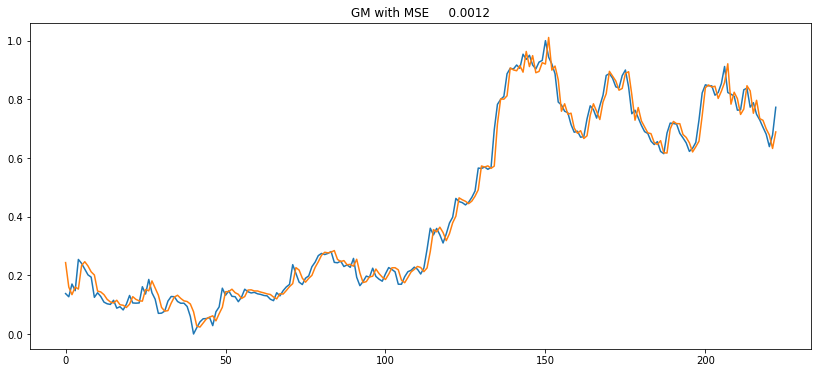

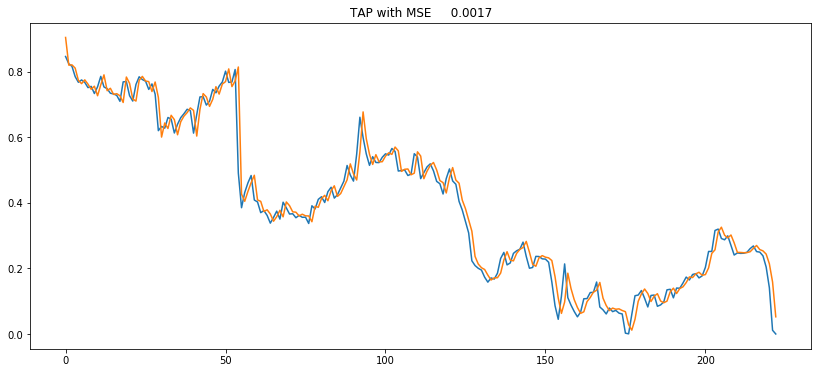

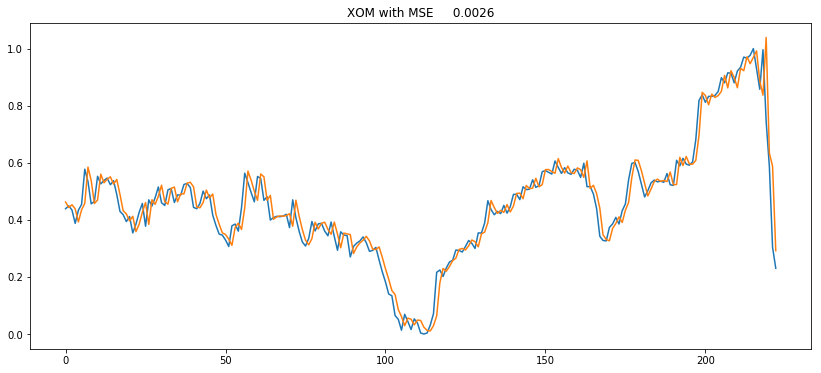

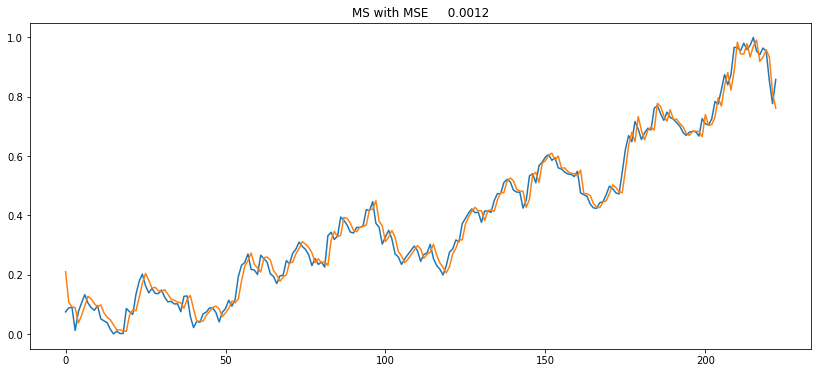

...

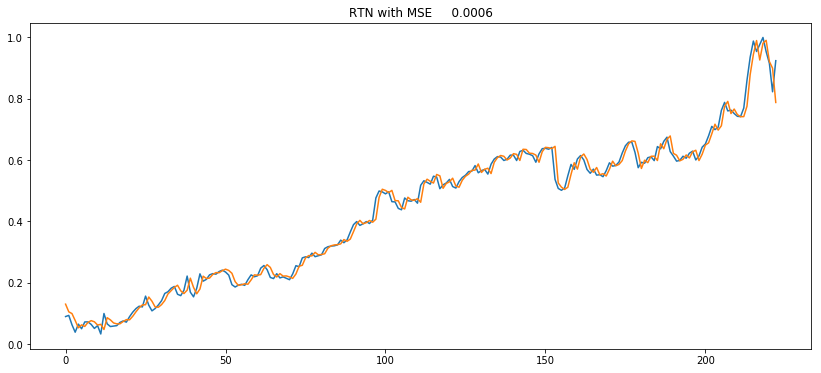

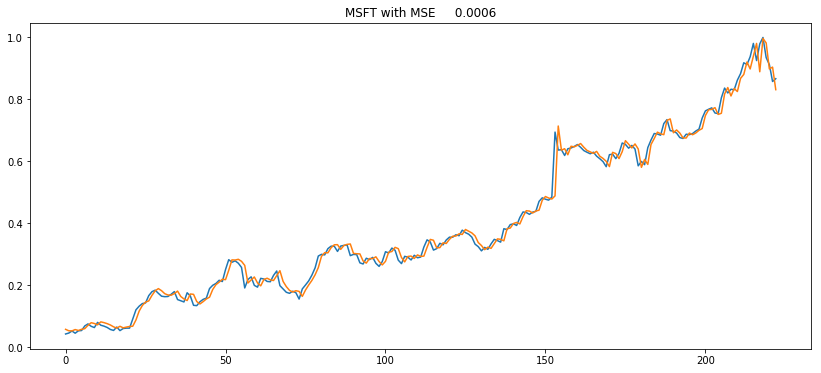

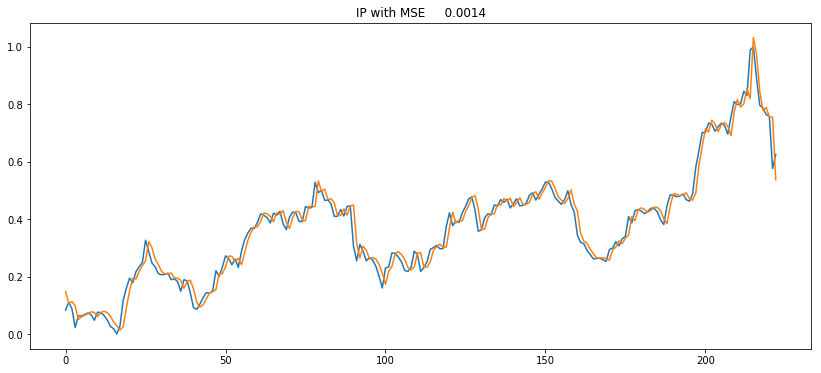

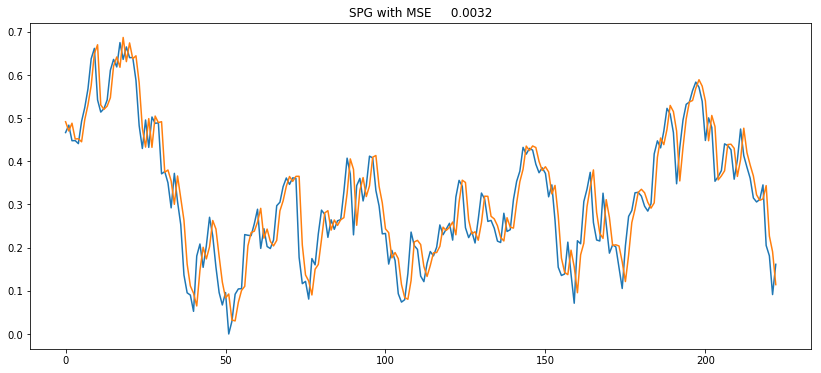

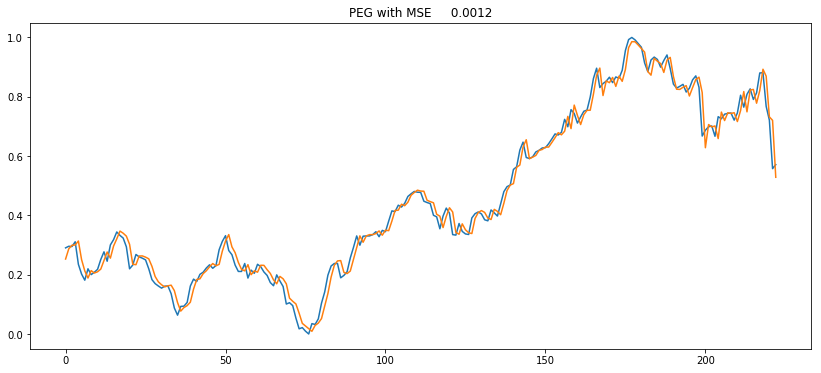

In [30]:
from sklearn.metrics import mean_squared_error

pred_result_1high = {}
MSE1_high={}
for i in names:
    y_true = testset_high[i]["y"].reshape(-1,1)
    y_pred = model1.predict(testset_high[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_1high[i] = {}
    pred_result_1high[i]["True High"] = y_true
    pred_result_1high[i]["Pred High"] = y_pred
    MSE1_high[i]=[]
    MSE1_high[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Train model 1 on train low and use it to predict daily low of test set.

In [31]:
history_1low={}
for i in names:
    print("Fitting to", i)
    history_1low[i]=model1.fit(trainset_low[i]["X"], trainset_low[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 387us/step - loss: 8.9475e-04 - val_loss: 2.5103e-04
Epoch 2/10
781/781 [==============================] - 0s 397us/step - loss: 6.0859e-04 - val_loss: 5.7901e-04
Epoch 3/10
781/781 [==============================] - 0s 447us/step - loss: 5.5865e-04 - val_loss: 5.7896e-04
Epoch 4/10
781/781 [==============================] - 0s 437us/step - loss: 3.8590e-04 - val_loss: 4.2407e-04
Epoch 5/10
781/781 [==============================] - 0s 435us/step - loss: 6.9549e-04 - val_loss: 7.9919e-04
Epoch 6/10
781/781 [==============================] - 0s 433us/step - loss: 7.9681e-04 - val_loss: 1.9776e-04
Epoch 7/10
781/781 [==============================] - 0s 438us/step - loss: 4.6692e-04 - val_loss: 5.8758e-04
Epoch 8/10
781/781 [==============================] - 0s 487us/step - loss: 6.8784e-04 - val_loss: 1.4825e-04
Epoch 9/10
781/781 [==============================] - 0s 46

781/781 [==============================] - 0s 534us/step - loss: 5.1132e-04 - val_loss: 2.3841e-04
Epoch 3/10
781/781 [==============================] - 0s 617us/step - loss: 5.4230e-04 - val_loss: 2.6288e-04
Epoch 4/10
781/781 [==============================] - 0s 619us/step - loss: 4.2845e-04 - val_loss: 3.8729e-04
Epoch 5/10
781/781 [==============================] - 0s 584us/step - loss: 3.5304e-04 - val_loss: 0.0019
Epoch 6/10
781/781 [==============================] - 0s 614us/step - loss: 4.3455e-04 - val_loss: 2.7453e-04
Epoch 7/10
781/781 [==============================] - 1s 645us/step - loss: 5.1503e-04 - val_loss: 4.5528e-04
Epoch 8/10
781/781 [==============================] - 0s 574us/step - loss: 3.8513e-04 - val_loss: 4.9365e-04
Epoch 9/10
781/781 [==============================] - 0s 592us/step - loss: 5.1666e-04 - val_loss: 4.4024e-04
Epoch 10/10
781/781 [==============================] - 1s 663us/step - loss: 4.1986e-04 - val_loss: 8.9761e-04
Fitting to IP
Train on 7

Plot the train and validation loss through training epochs.

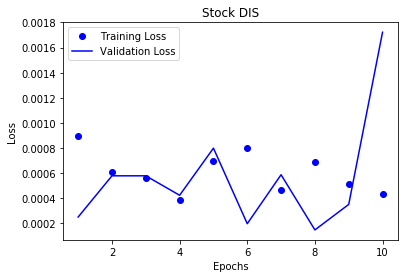

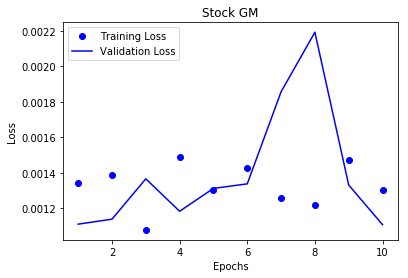

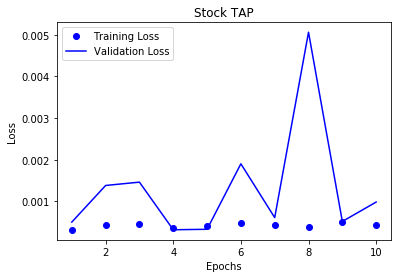

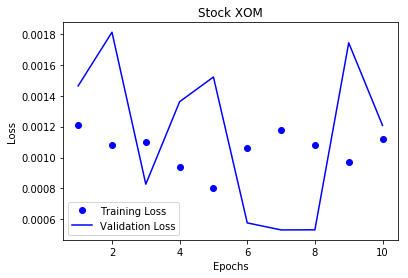

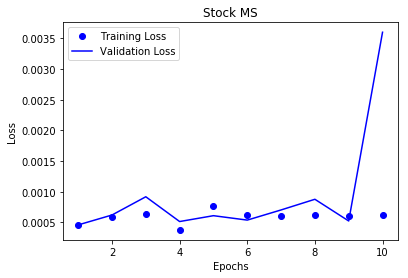

...

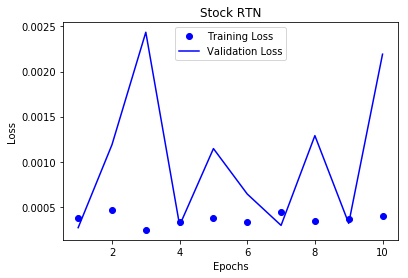

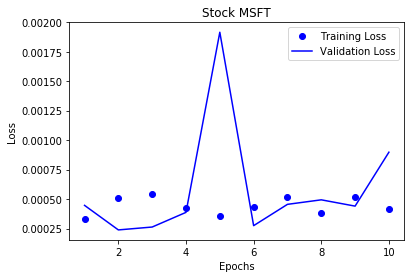

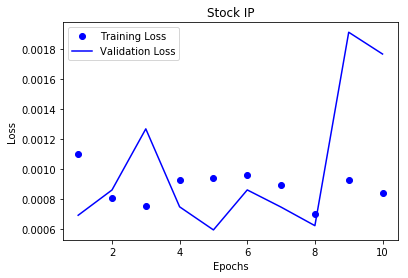

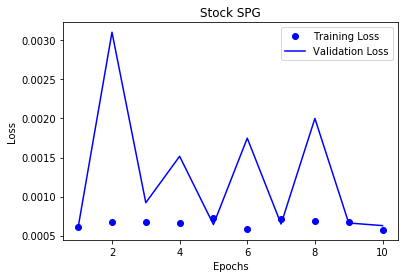

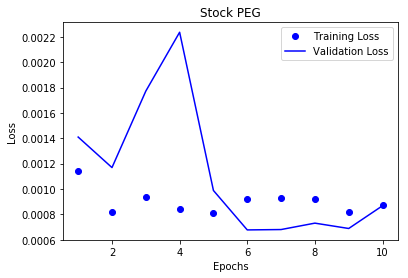

In [32]:
for i in names:
    plt.plot(epochs, history_1low[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_1low[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

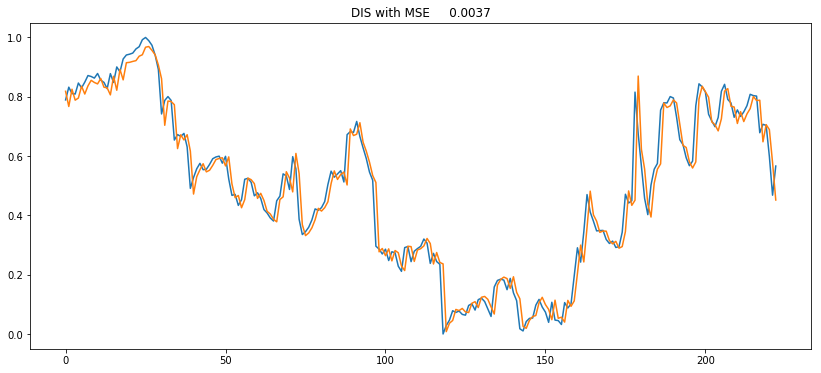

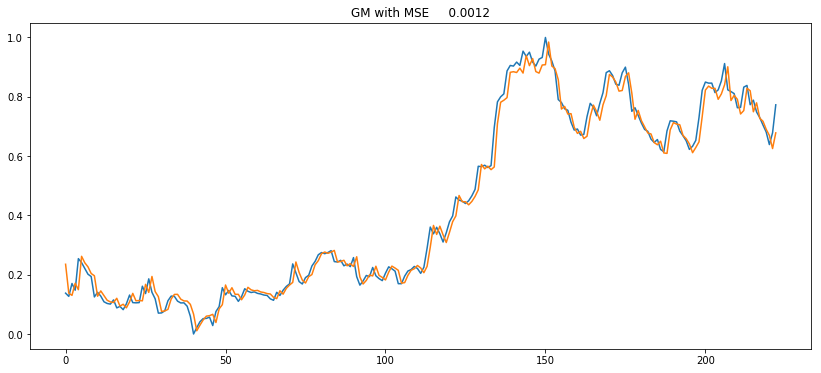

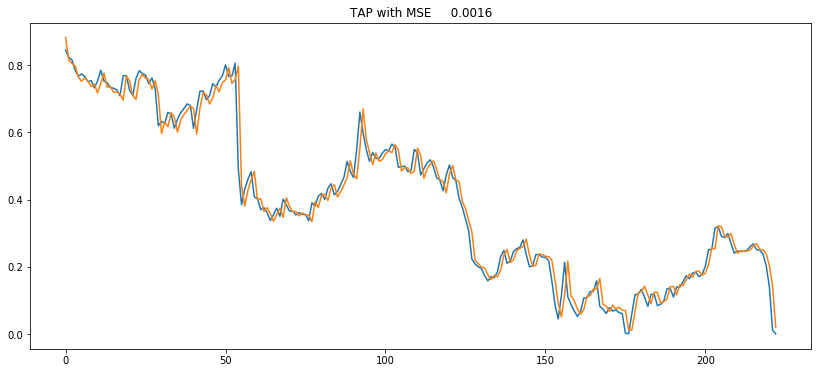

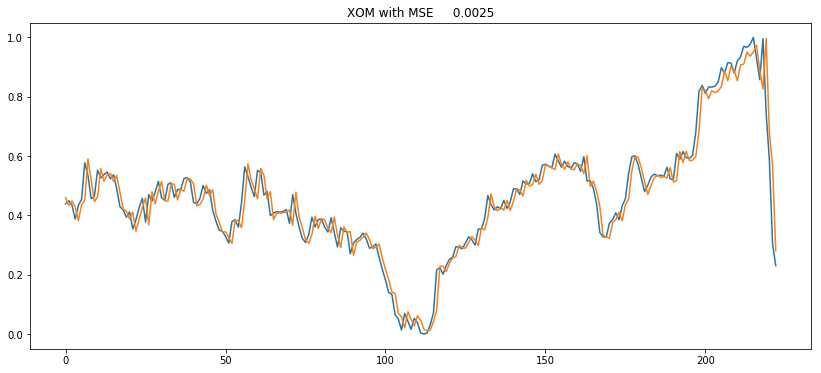

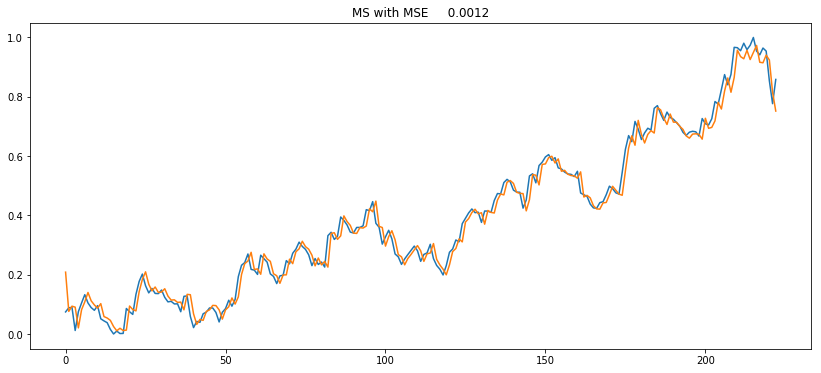

...

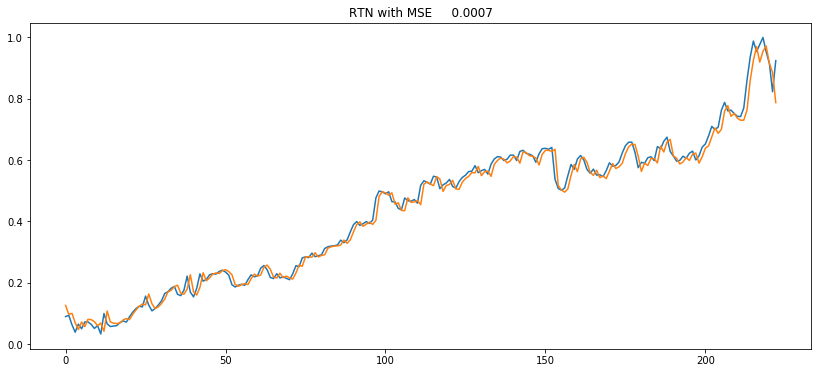

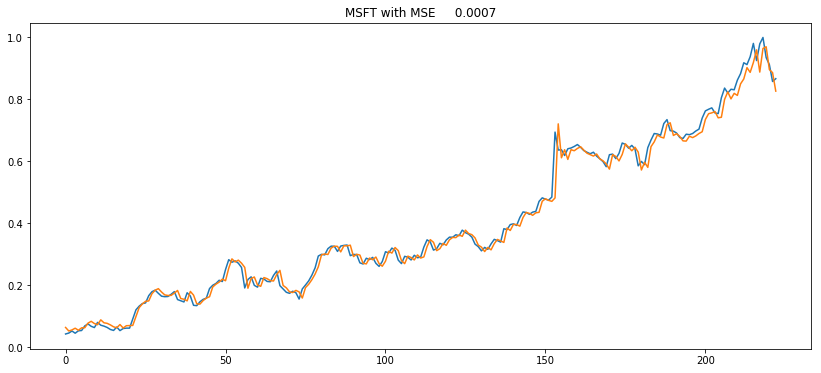

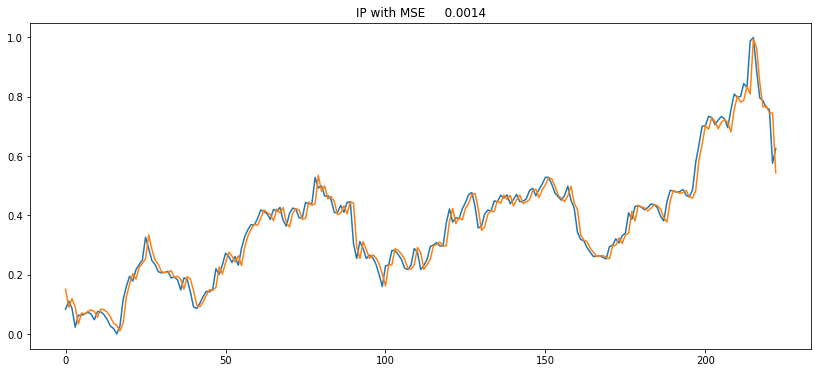

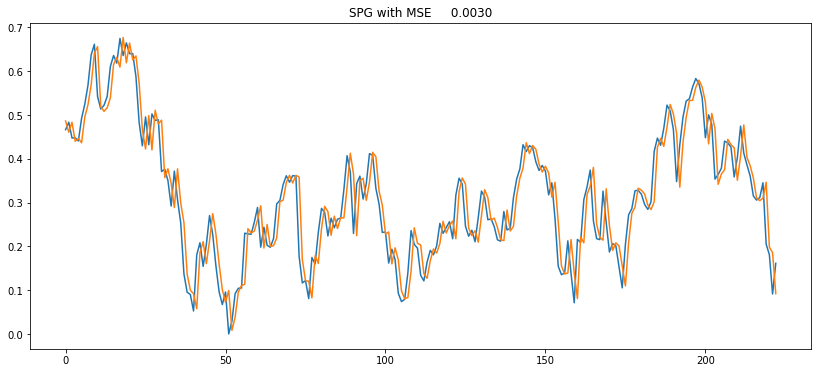

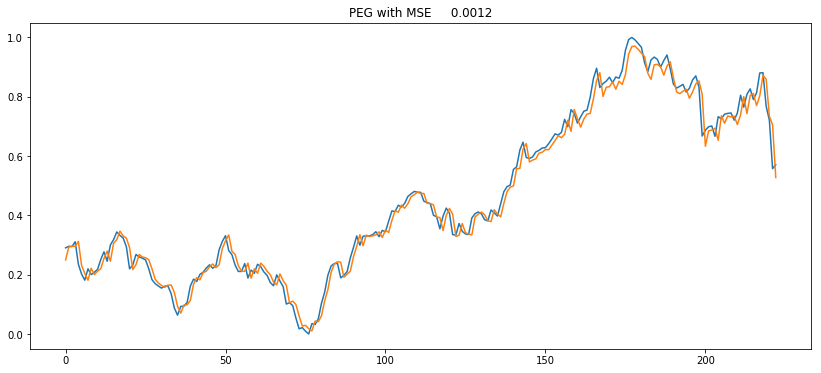

In [33]:
pred_result_1low = {}
MSE1_low={}
for i in names:
    y_true = testset_low[i]["y"].reshape(-1,1)
    y_pred = model1.predict(testset_low[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_1low[i] = {}
    pred_result_1low[i]["True Low"] = y_true
    pred_result_1low[i]["Pred Low"] = y_pred
    MSE1_low[i]=[]
    MSE1_low[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Model 2: a RNN network of 4 LSTM layers.

In [34]:
model2 = Sequential()
model2.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
model2.add(LSTM(units=50, return_sequences=True))
model2.add(LSTM(units=50, return_sequences=True))
model2.add(LSTM(units=50))
model2.add(Dense(units=1))
model2.compile(optimizer='rmsprop', loss='mean_squared_error')

Train model 2 on train high and predict daily high of test set. 

In [35]:
history_2high={}
for i in names:
    print("Fitting to", i)
    history_2high[i]=model2.fit(trainset_high[i]["X"], trainset_high[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 3s 3ms/step - loss: 0.0763 - val_loss: 0.0024
Epoch 2/10
781/781 [==============================] - 1s 841us/step - loss: 0.0170 - val_loss: 0.0029
Epoch 3/10
781/781 [==============================] - 1s 855us/step - loss: 0.0135 - val_loss: 0.0060
Epoch 4/10
781/781 [==============================] - 1s 867us/step - loss: 0.0105 - val_loss: 0.0079
Epoch 5/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0091 - val_loss: 0.0454
Epoch 6/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0094 - val_loss: 0.0249
Epoch 7/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0093 - val_loss: 0.0031
Epoch 8/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0088 - val_loss: 0.0027
Epoch 9/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0060 - val_loss: 0.0054
Epoch 10/10
781/781 [============

781/781 [==============================] - 1s 992us/step - loss: 0.0012 - val_loss: 5.4266e-04
Epoch 8/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0011 - val_loss: 0.0013
Epoch 9/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0011 - val_loss: 7.4757e-04
Epoch 10/10
781/781 [==============================] - 1s 1ms/step - loss: 8.4762e-04 - val_loss: 0.0034
Fitting to IP
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 1s 940us/step - loss: 0.0024 - val_loss: 0.0013
Epoch 2/10
781/781 [==============================] - 1s 993us/step - loss: 0.0018 - val_loss: 0.0015
Epoch 3/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0018 - val_loss: 0.0038
Epoch 4/10
781/781 [==============================] - 1s 983us/step - loss: 0.0016 - val_loss: 0.0020
Epoch 5/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 6/10
781/781 [==========

Plot the train and validation loss through the training process.

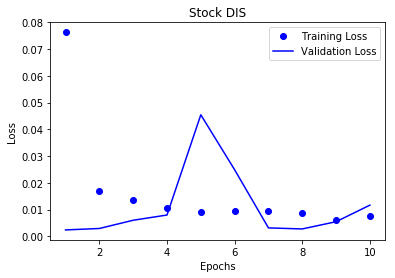

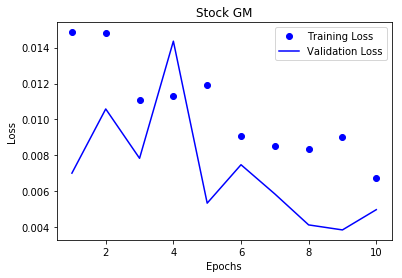

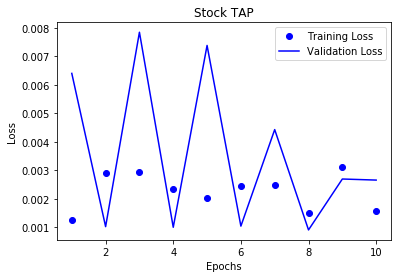

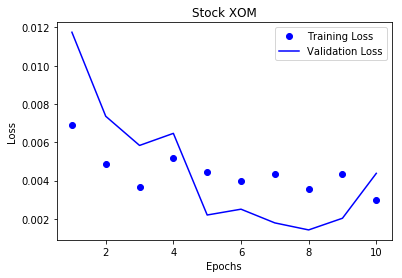

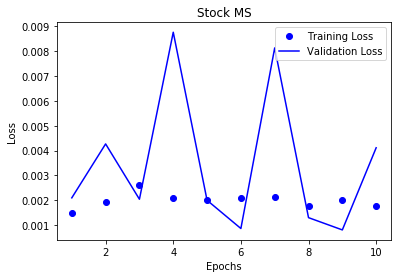

...

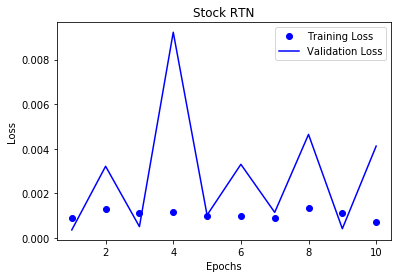

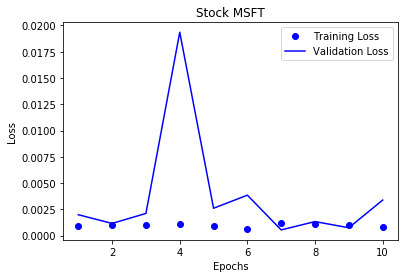

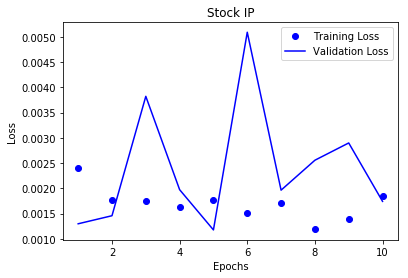

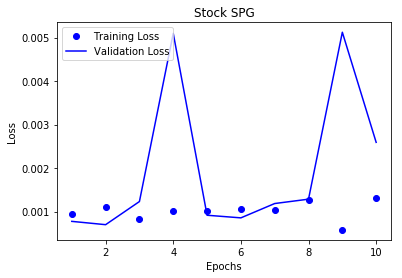

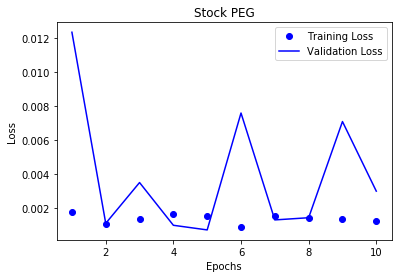

In [36]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_2high[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_2high[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

Plot the predicted daily high using model 2 against true daily high of test set. 

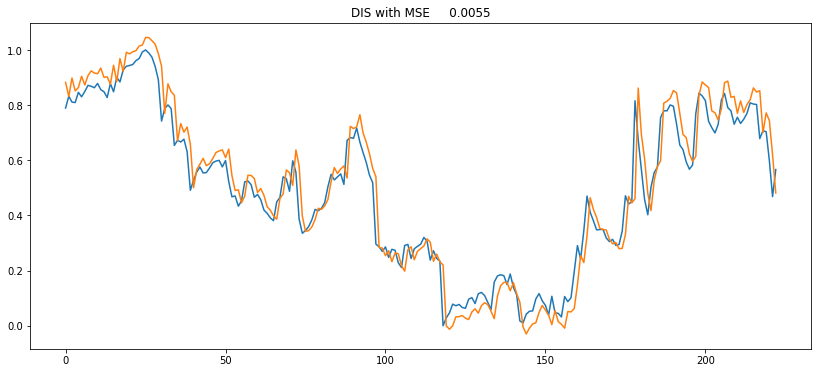

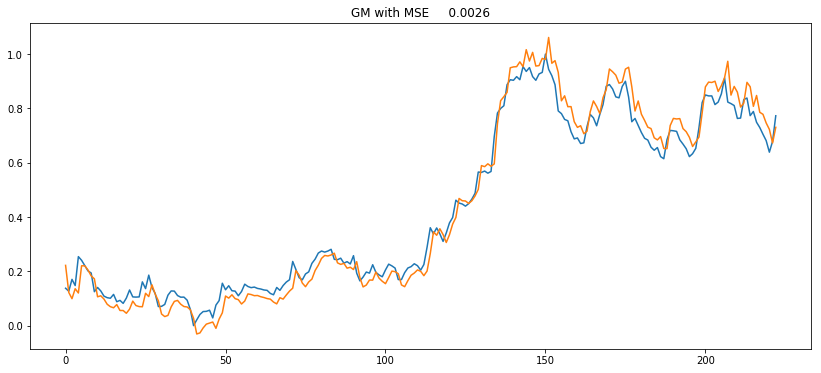

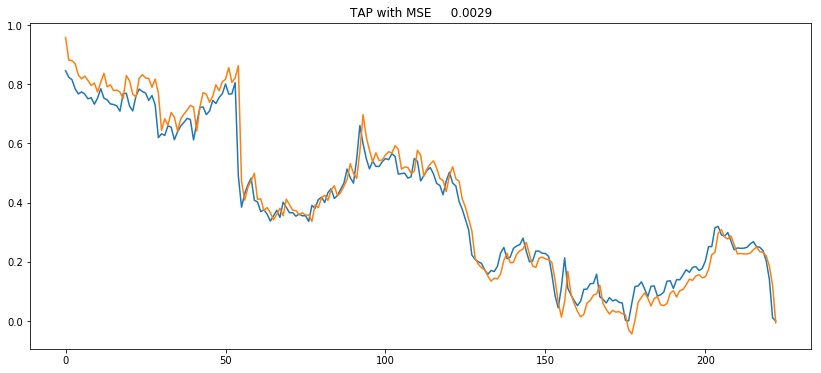

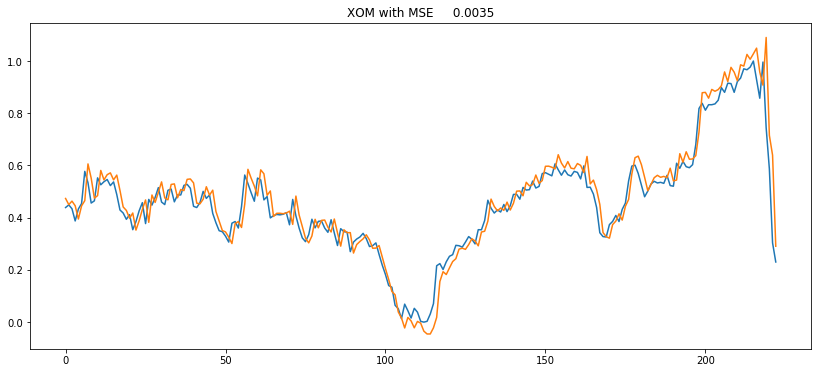

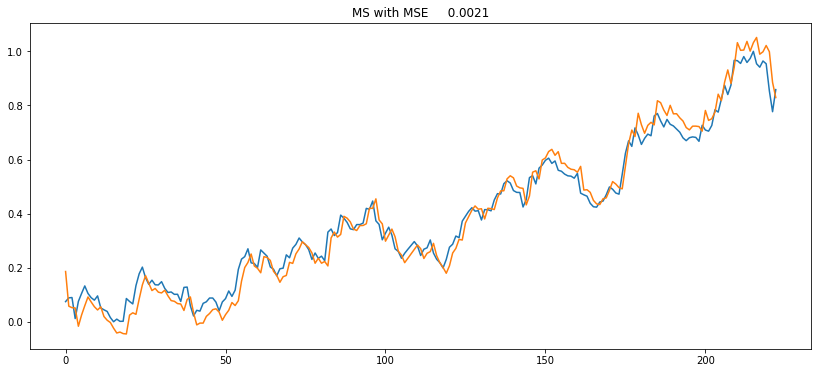

...

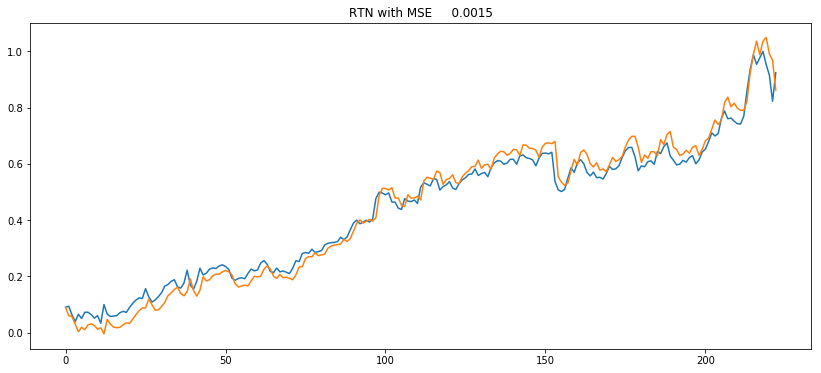

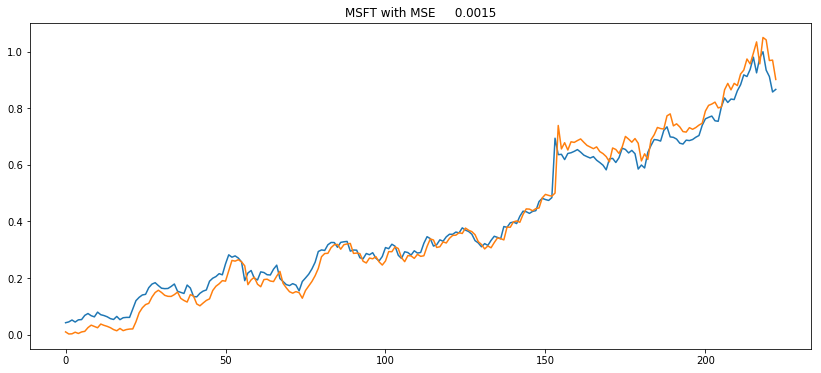

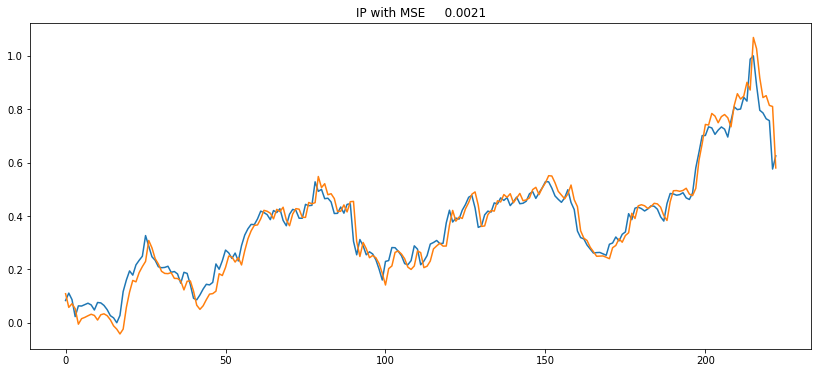

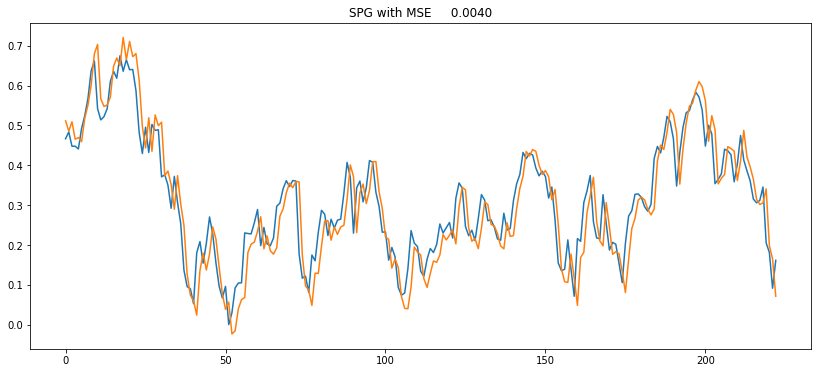

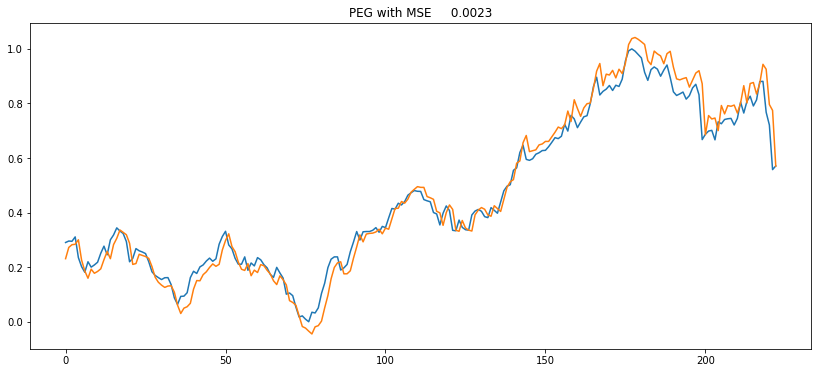

In [37]:
pred_result_2high = {}
MSE2_high={}
for i in names:
    y_true = testset_high[i]["y"].reshape(-1,1)
    y_pred = model2.predict(testset_high[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_2high[i] = {}
    pred_result_2high[i]["True High"] = y_true
    pred_result_2high[i]["Pred High"] = y_pred
    MSE2_high[i]=[]
    MSE2_high[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Train model 2 on train low set. 

In [38]:
history_2low={}
for i in names:
    print("Fitting to", i)
    history_2low[i]=model1.fit(trainset_low[i]["X"], trainset_low[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 372us/step - loss: 5.4430e-04 - val_loss: 2.1820e-04
Epoch 2/10
781/781 [==============================] - 0s 469us/step - loss: 4.9439e-04 - val_loss: 2.8734e-04
Epoch 3/10
781/781 [==============================] - 0s 406us/step - loss: 4.8878e-04 - val_loss: 1.4527e-04
Epoch 4/10
781/781 [==============================] - 0s 448us/step - loss: 3.3457e-04 - val_loss: 1.4498e-04
Epoch 5/10
781/781 [==============================] - 0s 419us/step - loss: 4.9365e-04 - val_loss: 4.7835e-04
Epoch 6/10
781/781 [==============================] - 0s 434us/step - loss: 4.5304e-04 - val_loss: 5.8928e-04
Epoch 7/10
781/781 [==============================] - 0s 435us/step - loss: 4.6003e-04 - val_loss: 0.0014
Epoch 8/10
781/781 [==============================] - 0s 448us/step - loss: 4.5514e-04 - val_loss: 8.6804e-04
Epoch 9/10
781/781 [==============================] - 0s 513us/

781/781 [==============================] - 0s 585us/step - loss: 4.4378e-04 - val_loss: 2.6442e-04
Epoch 3/10
781/781 [==============================] - 0s 543us/step - loss: 3.7437e-04 - val_loss: 0.0010
Epoch 4/10
781/781 [==============================] - 0s 599us/step - loss: 2.7714e-04 - val_loss: 2.3671e-04
Epoch 5/10
781/781 [==============================] - 0s 591us/step - loss: 4.6479e-04 - val_loss: 4.3062e-04
Epoch 6/10
781/781 [==============================] - 0s 543us/step - loss: 4.3558e-04 - val_loss: 2.4994e-04
Epoch 7/10
781/781 [==============================] - 0s 525us/step - loss: 3.9894e-04 - val_loss: 5.2341e-04
Epoch 8/10
781/781 [==============================] - 0s 510us/step - loss: 3.7459e-04 - val_loss: 3.2562e-04
Epoch 9/10
781/781 [==============================] - 0s 553us/step - loss: 4.3081e-04 - val_loss: 3.0740e-04
Epoch 10/10
781/781 [==============================] - 0s 555us/step - loss: 2.9521e-04 - val_loss: 6.2760e-04
Fitting to IP
Train on 7

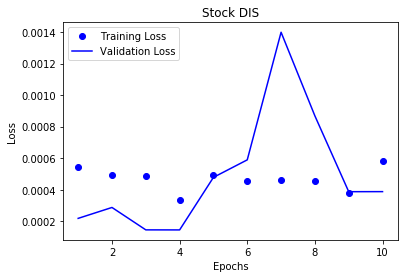

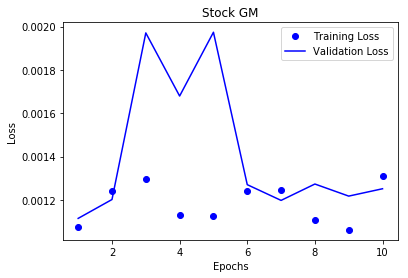

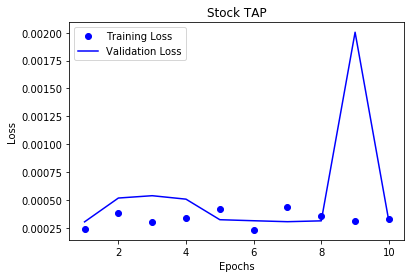

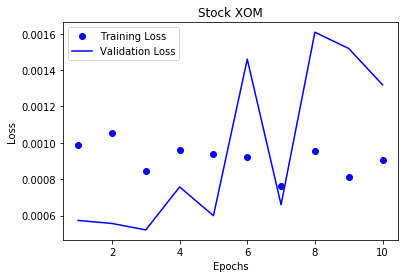

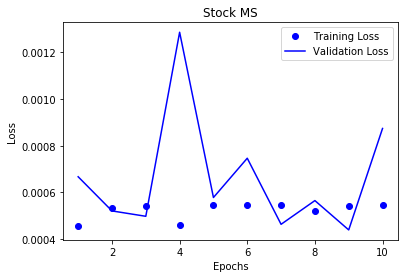

...

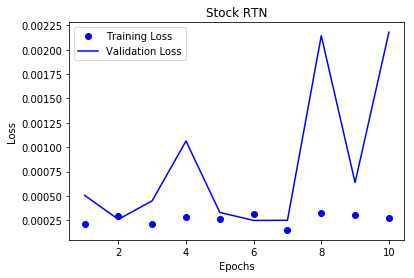

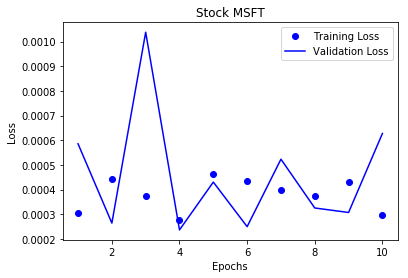

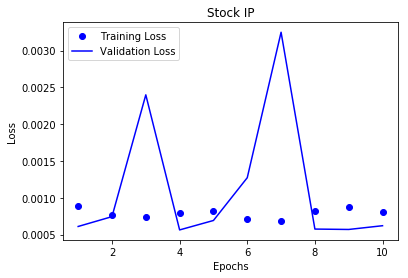

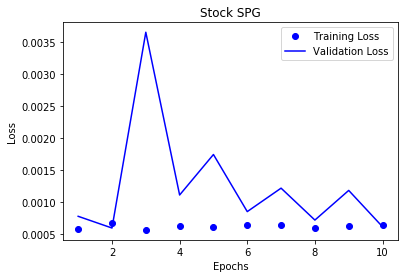

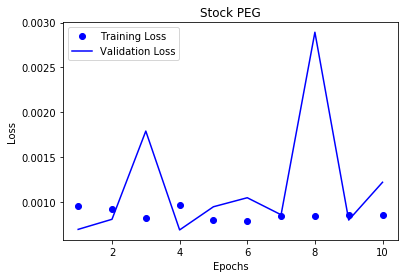

In [39]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_2low[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_2low[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

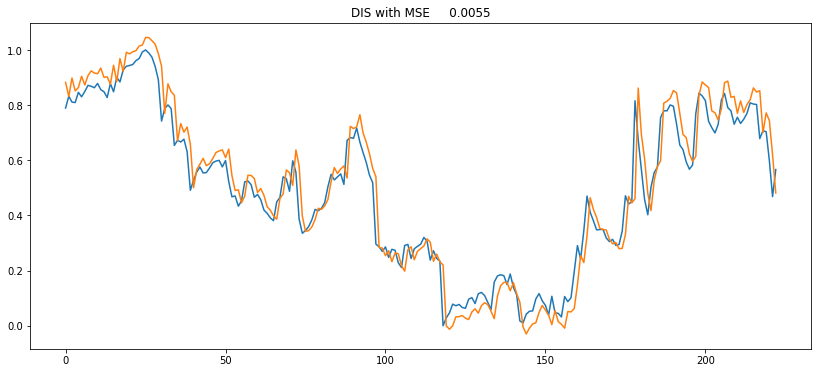

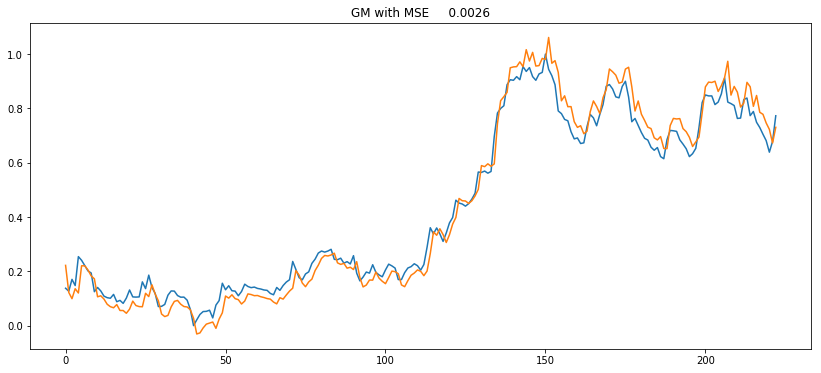

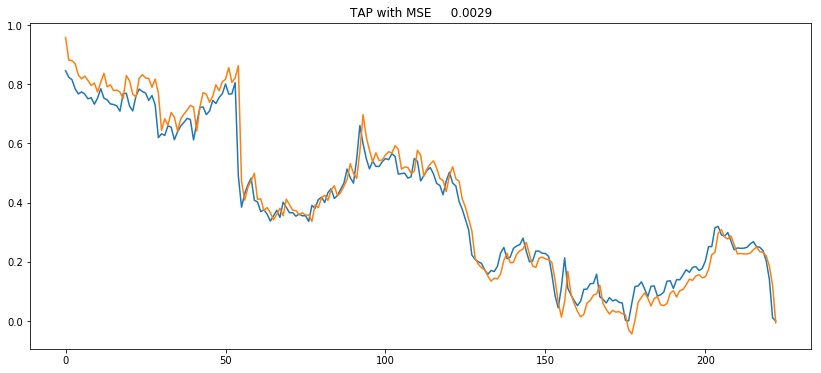

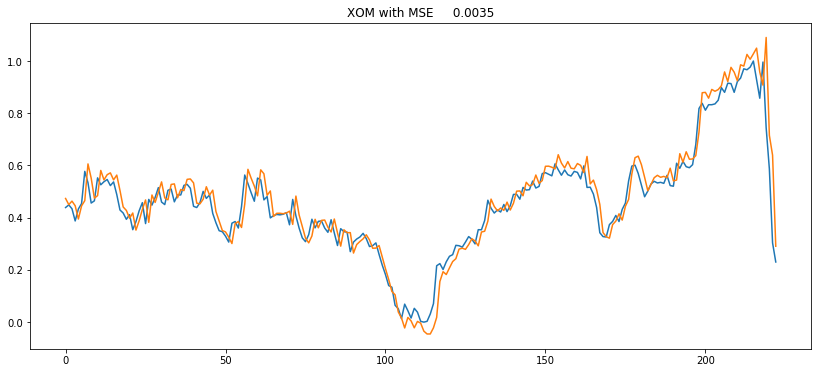

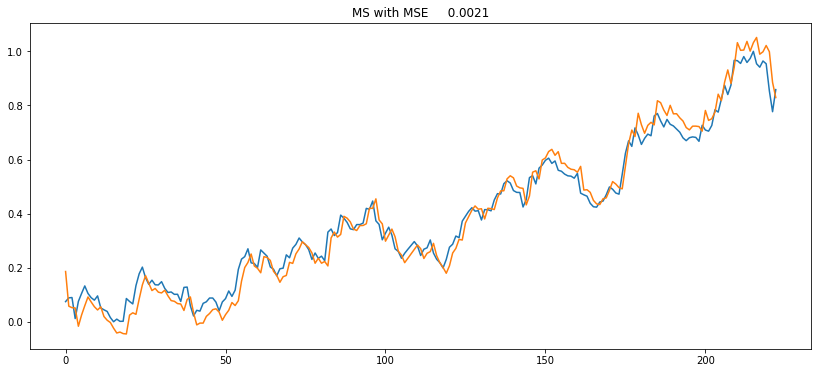

...

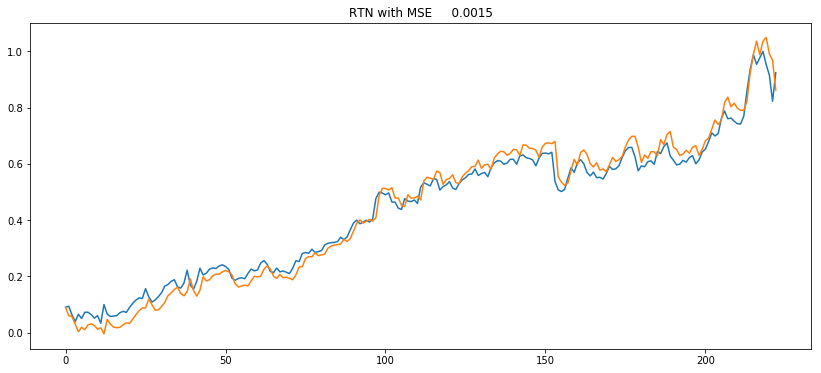

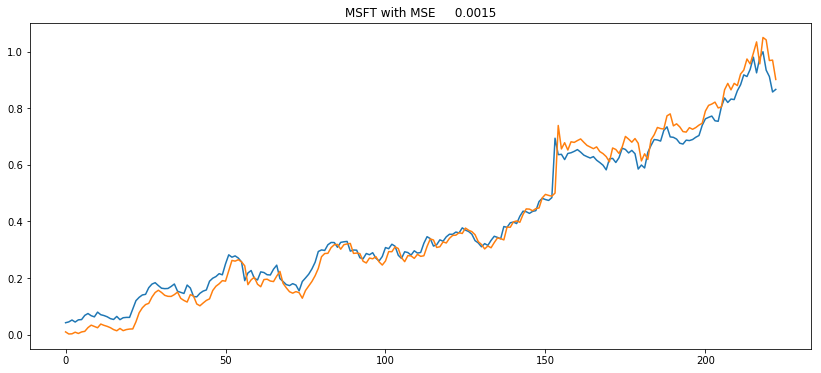

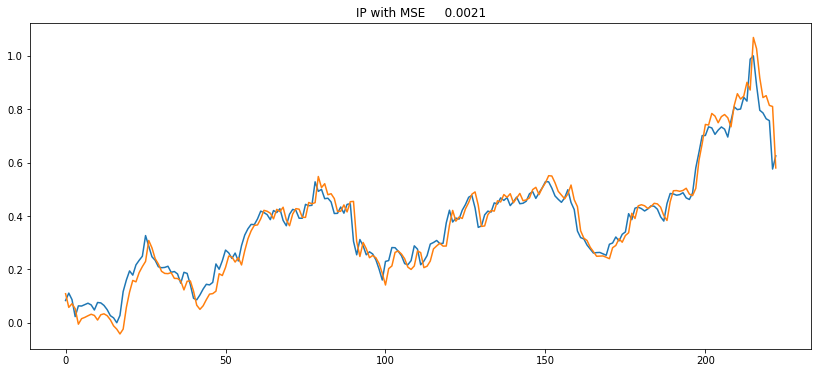

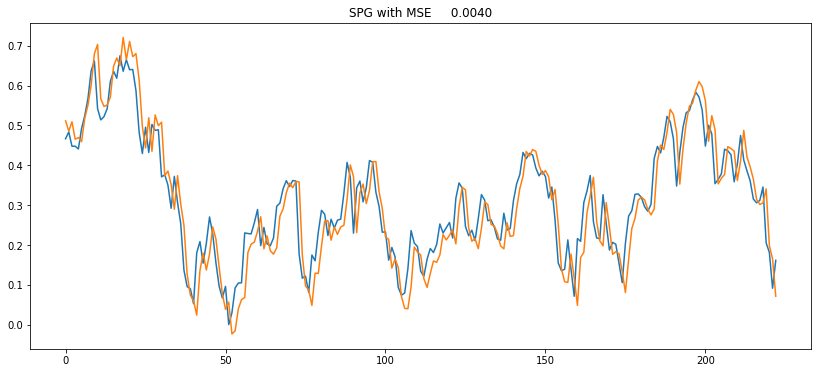

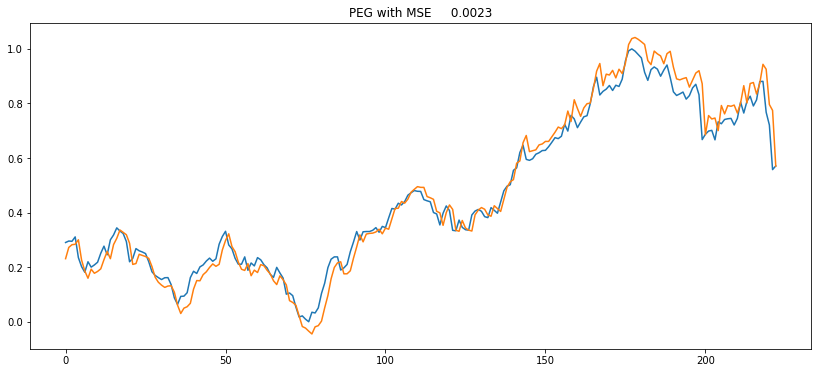

In [40]:
pred_result_2low = {}
MSE2_low={}
for i in names:
    y_true = testset_low[i]["y"].reshape(-1,1)
    y_pred = model2.predict(testset_low[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_2low[i] = {}
    pred_result_2low[i]["True High"] = y_true
    pred_result_2low[i]["Pred High"] = y_pred
    MSE2_low[i]=[]
    MSE2_low[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Model 3: 2 LSTM layers with dropout.

In [41]:
model3 = Sequential()
model3.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
model3.add(Dropout(0.2))
model3.add(LSTM(units=50))
model3.add(Dropout(0.2))
model3.add(Dense(units=1))
model3.compile(optimizer='rmsprop', loss='mean_squared_error')

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Train model 3 on train daily high. 

In [42]:
history_3high={}
for i in names:
    print("Fitting to", i)
    history_3high[i]=model3.fit(trainset_high[i]["X"], trainset_high[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 2s 3ms/step - loss: 0.0621 - val_loss: 0.0013
Epoch 2/10
781/781 [==============================] - 0s 512us/step - loss: 0.0067 - val_loss: 0.0274
Epoch 3/10
781/781 [==============================] - 0s 478us/step - loss: 0.0093 - val_loss: 0.0114
Epoch 4/10
781/781 [==============================] - 0s 529us/step - loss: 0.0082 - val_loss: 0.0012
Epoch 5/10
781/781 [==============================] - 0s 481us/step - loss: 0.0079 - val_loss: 0.0030
Epoch 6/10
781/781 [==============================] - 0s 548us/step - loss: 0.0073 - val_loss: 0.0117
Epoch 7/10
781/781 [==============================] - 0s 540us/step - loss: 0.0078 - val_loss: 0.0010
Epoch 8/10
781/781 [==============================] - 0s 545us/step - loss: 0.0068 - val_loss: 0.0016
Epoch 9/10
781/781 [==============================] - 0s 540us/step - loss: 0.0054 - val_loss: 0.0052
Epoch 10/10
781/781 [==

781/781 [==============================] - 0s 626us/step - loss: 0.0020 - val_loss: 0.0063
Epoch 7/10
781/781 [==============================] - 0s 601us/step - loss: 0.0016 - val_loss: 0.0018
Epoch 8/10
781/781 [==============================] - 0s 595us/step - loss: 0.0017 - val_loss: 0.0012
Epoch 9/10
781/781 [==============================] - 0s 577us/step - loss: 0.0016 - val_loss: 0.0093
Epoch 10/10
781/781 [==============================] - 0s 552us/step - loss: 0.0016 - val_loss: 0.0015
Fitting to IP
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 539us/step - loss: 0.0033 - val_loss: 0.0036
Epoch 2/10
781/781 [==============================] - 0s 536us/step - loss: 0.0032 - val_loss: 0.0019
Epoch 3/10
781/781 [==============================] - 0s 541us/step - loss: 0.0027 - val_loss: 0.0027
Epoch 4/10
781/781 [==============================] - 0s 529us/step - loss: 0.0029 - val_loss: 0.0020
Epoch 5/10
781/781 [============

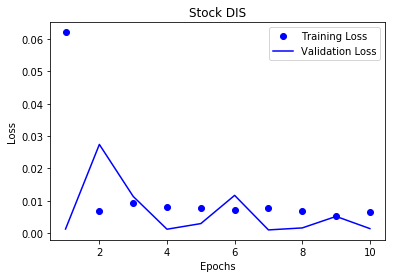

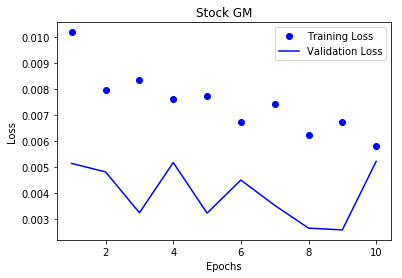

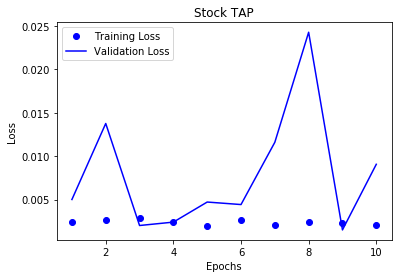

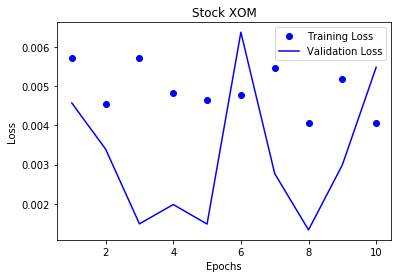

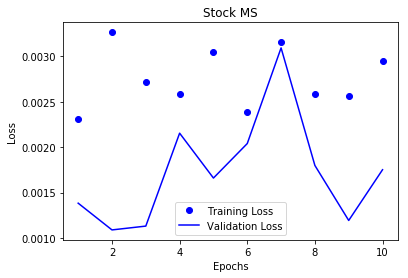

...

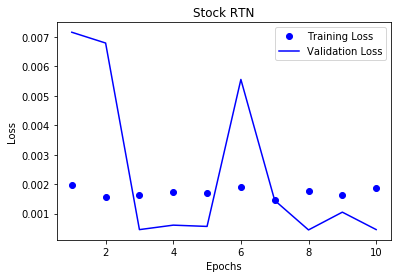

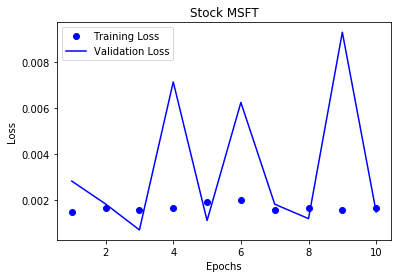

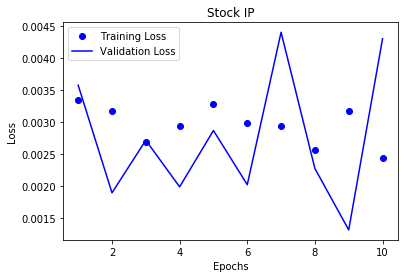

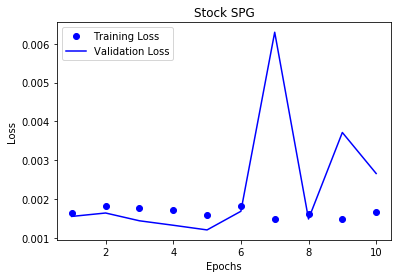

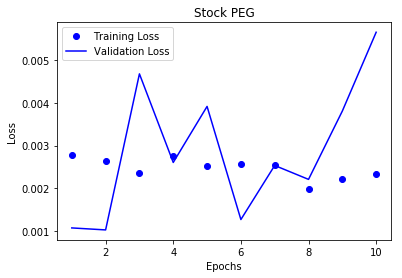

In [43]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_3high[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_3high[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

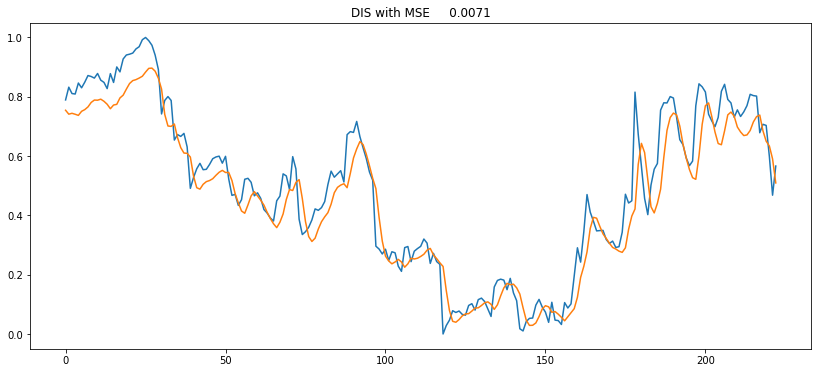

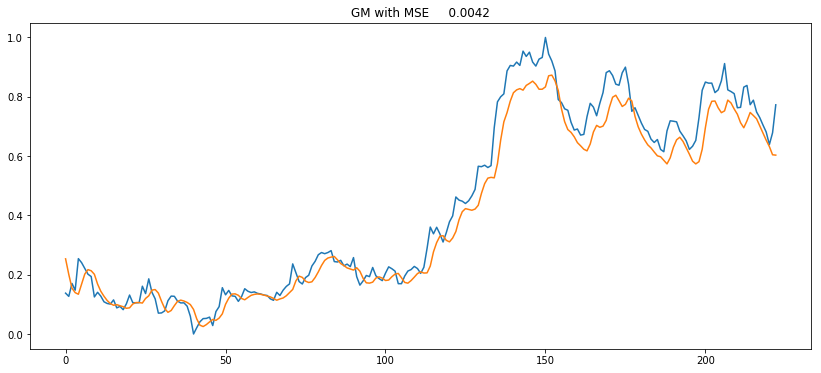

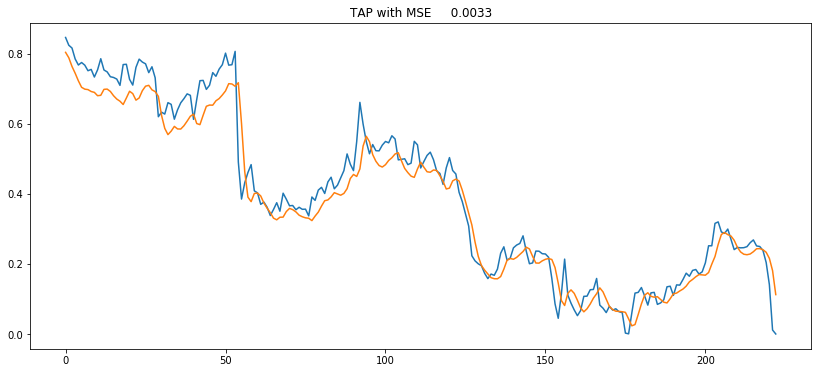

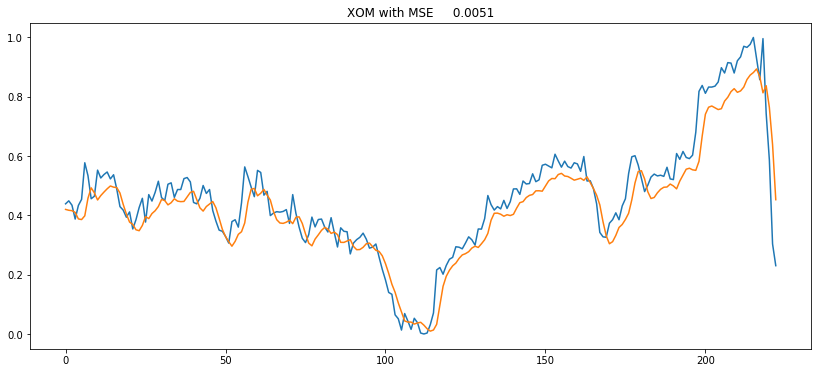

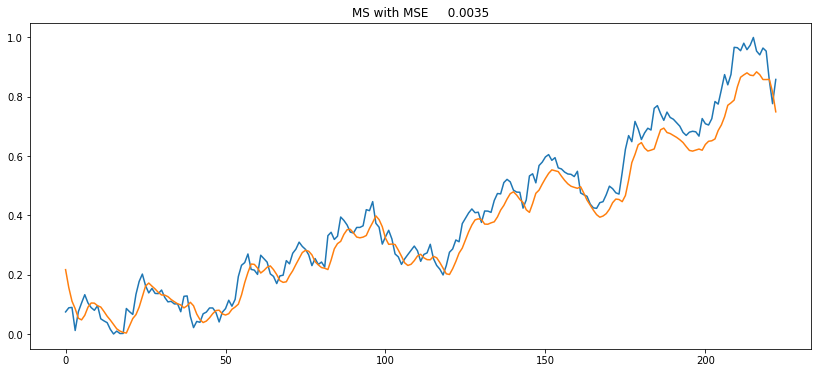

...

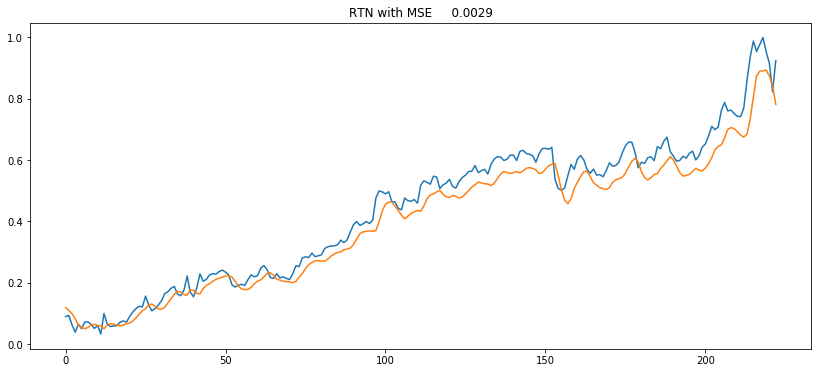

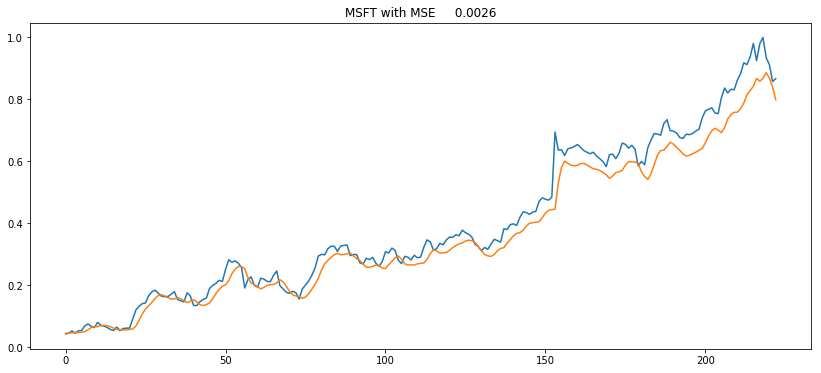

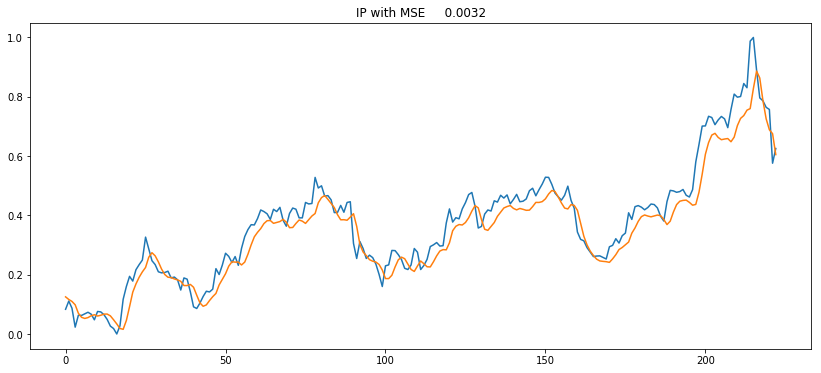

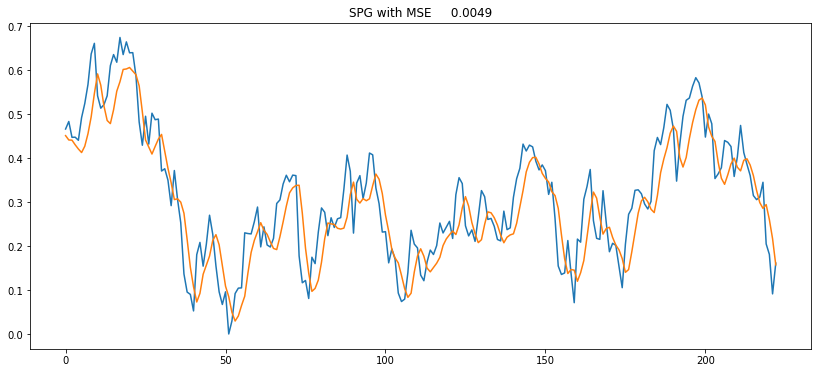

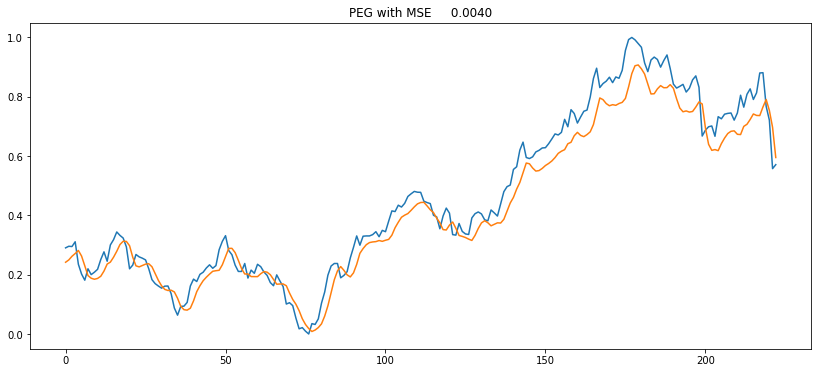

In [44]:
pred_result_3high = {}
MSE3_high={}
for i in names:
    y_true = testset_high[i]["y"].reshape(-1,1)
    y_pred = model3.predict(testset_high[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_3high[i] = {}
    pred_result_3high[i]["True High"] = y_true
    pred_result_3high[i]["Pred High"] = y_pred
    MSE3_high[i]=[]
    MSE3_high[i].append((truncate(MSE,5)))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Train model 3 on train daily low.

In [45]:
history_3low={}
for i in names:
    print("Fitting to", i)
    history_3low[i]=model3.fit(trainset_low[i]["X"], trainset_low[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 421us/step - loss: 0.0021 - val_loss: 6.9832e-04
Epoch 2/10
781/781 [==============================] - 0s 486us/step - loss: 0.0021 - val_loss: 0.0020
Epoch 3/10
781/781 [==============================] - 0s 452us/step - loss: 0.0020 - val_loss: 5.8645e-04
Epoch 4/10
781/781 [==============================] - 0s 451us/step - loss: 0.0018 - val_loss: 0.0020
Epoch 5/10
781/781 [==============================] - 0s 472us/step - loss: 0.0021 - val_loss: 0.0030
Epoch 6/10
781/781 [==============================] - 0s 470us/step - loss: 0.0019 - val_loss: 3.2996e-04
Epoch 7/10
781/781 [==============================] - 0s 552us/step - loss: 0.0016 - val_loss: 8.4415e-04
Epoch 8/10
781/781 [==============================] - 0s 539us/step - loss: 0.0019 - val_loss: 2.3718e-04
Epoch 9/10
781/781 [==============================] - 0s 524us/step - loss: 0.0019 - val_loss: 3.5406e-

781/781 [==============================] - 0s 568us/step - loss: 8.2788e-04 - val_loss: 2.8616e-04
Epoch 5/10
781/781 [==============================] - 0s 540us/step - loss: 7.5501e-04 - val_loss: 5.8449e-04
Epoch 6/10
781/781 [==============================] - 0s 531us/step - loss: 6.5862e-04 - val_loss: 0.0013
Epoch 7/10
781/781 [==============================] - 0s 544us/step - loss: 8.5253e-04 - val_loss: 0.0022
Epoch 8/10
781/781 [==============================] - 0s 539us/step - loss: 8.2884e-04 - val_loss: 5.6922e-04
Epoch 9/10
781/781 [==============================] - 0s 529us/step - loss: 7.8383e-04 - val_loss: 7.4974e-04
Epoch 10/10
781/781 [==============================] - 0s 549us/step - loss: 7.2046e-04 - val_loss: 4.9090e-04
Fitting to IP
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 555us/step - loss: 0.0016 - val_loss: 0.0011
Epoch 2/10
781/781 [==============================] - 0s 553us/step - loss: 0.0017 - v

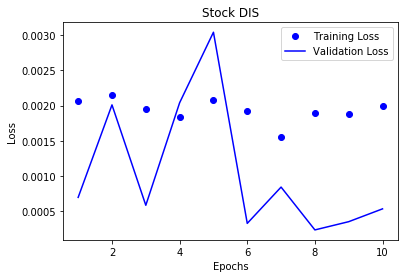

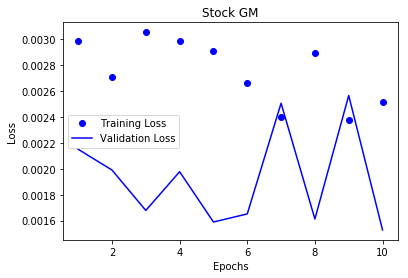

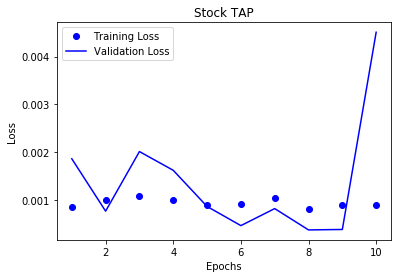

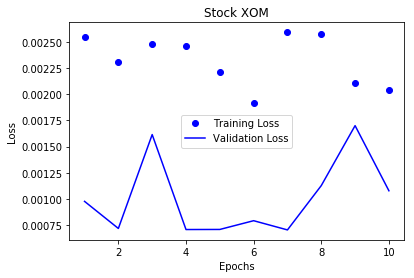

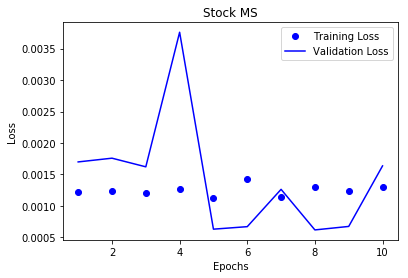

...

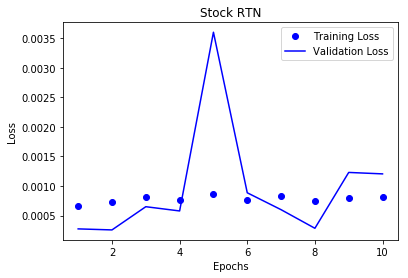

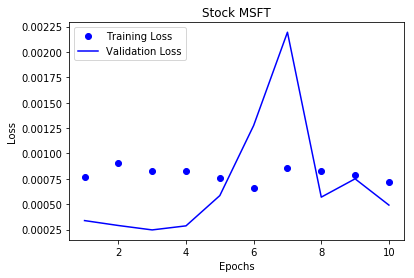

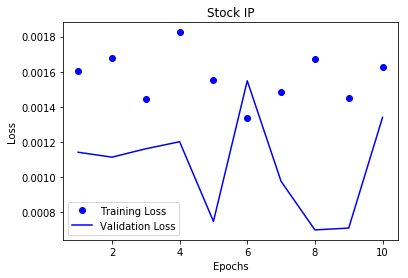

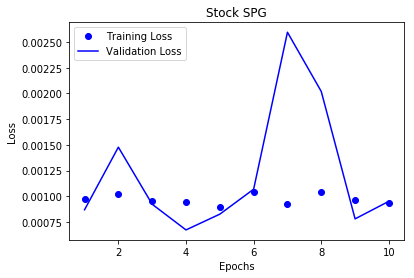

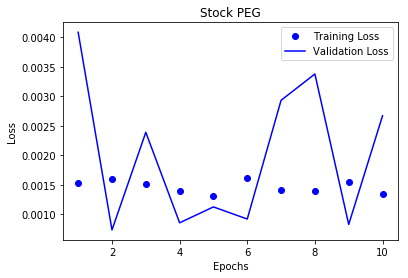

In [46]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_3low[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_3low[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

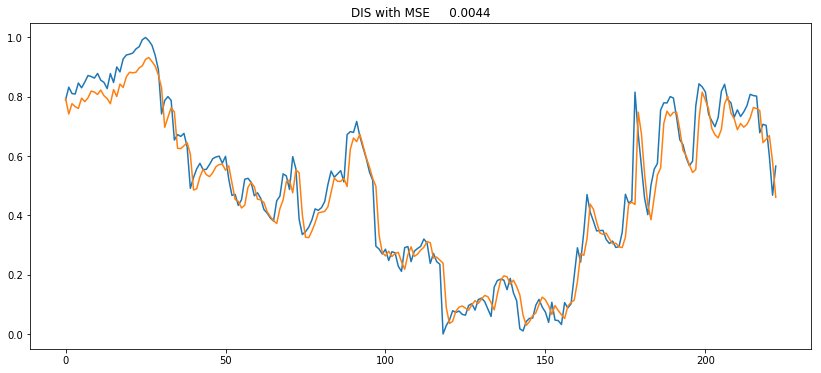

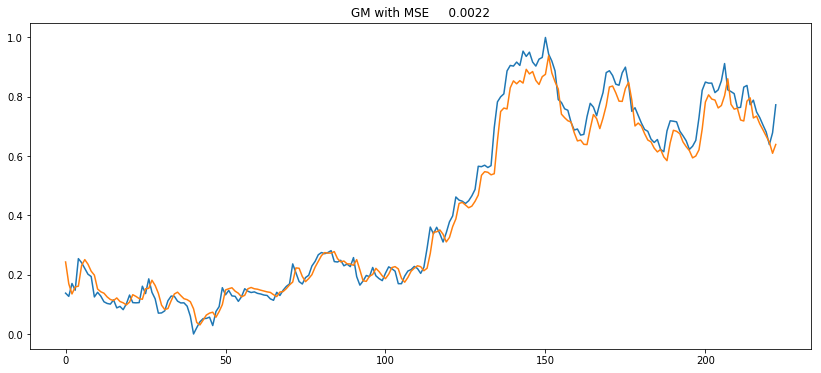

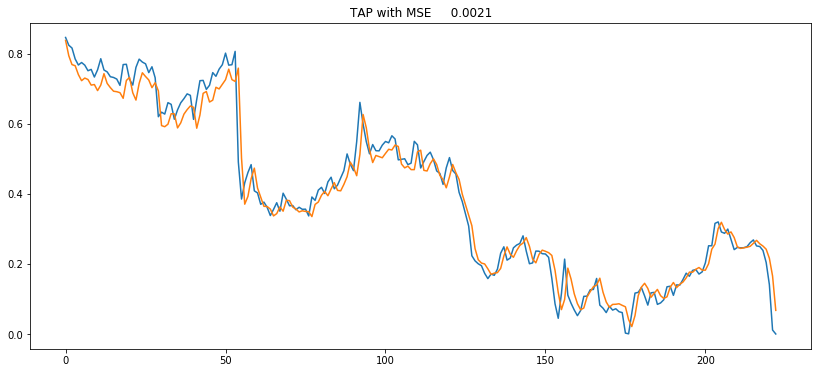

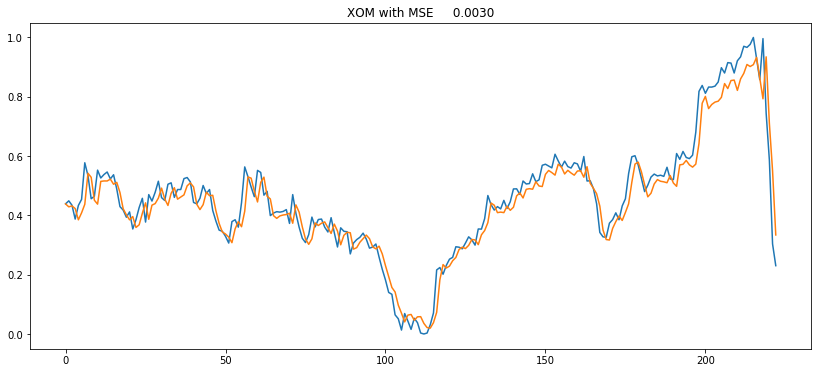

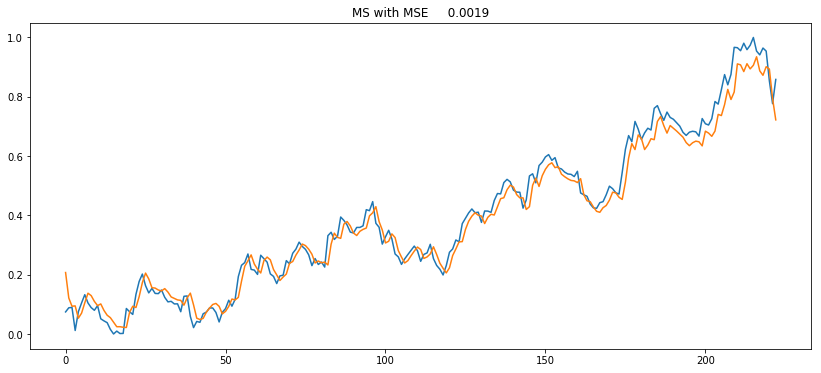

...

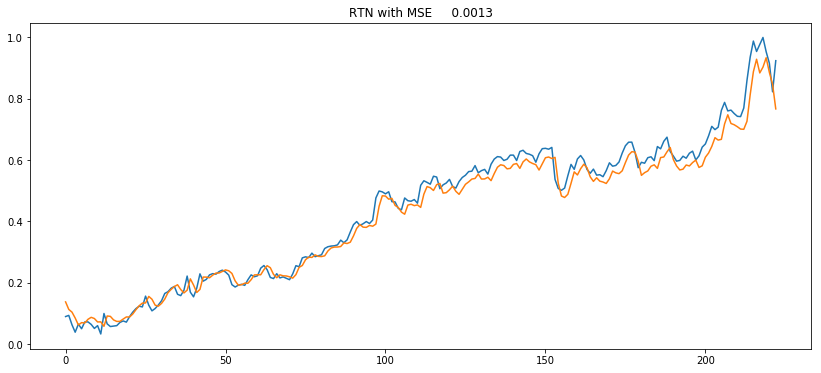

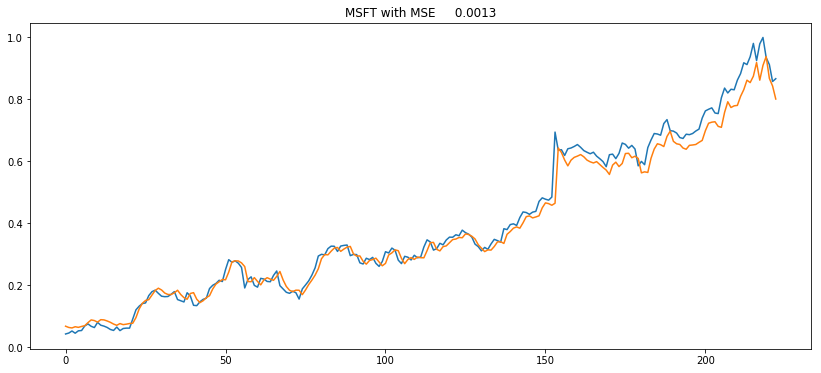

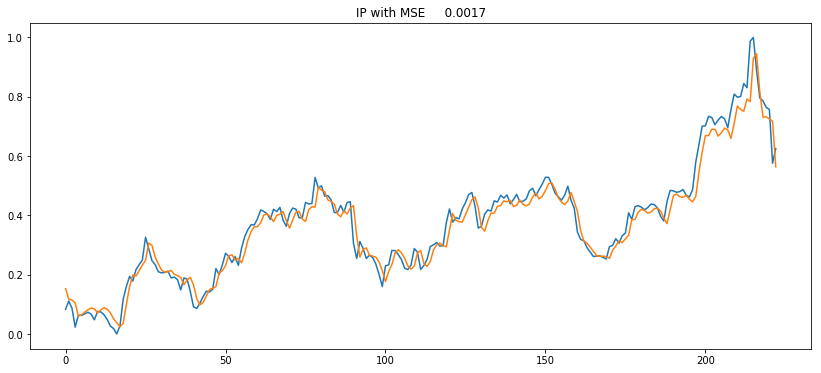

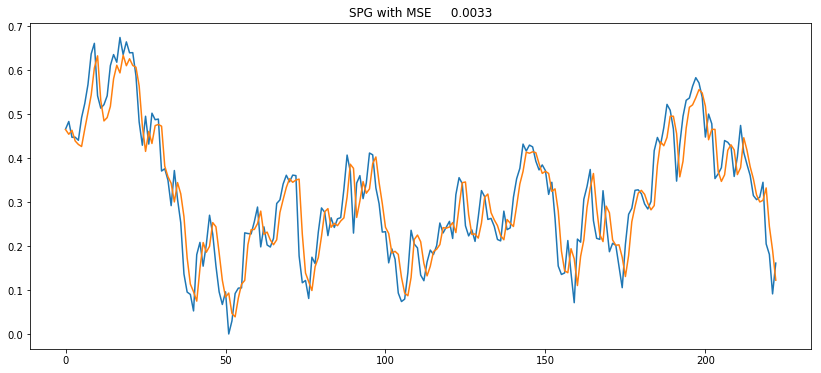

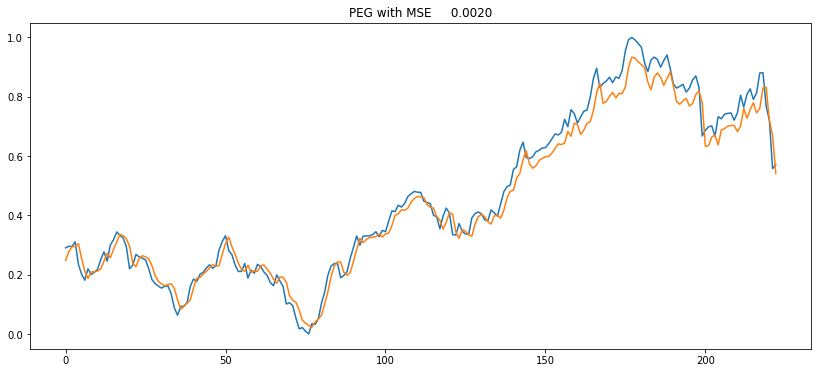

In [47]:
pred_result_3low = {}
MSE3_low={}
for i in names:
    y_true = testset_low[i]["y"].reshape(-1,1)
    y_pred = model3.predict(testset_low[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_3low[i] = {}
    pred_result_3low[i]["True High"] = y_true
    pred_result_3low[i]["Pred High"] = y_pred
    MSE3_low[i]=[]
    MSE3_low[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Model 4: 4 LSTM layers with dropout option.

In [48]:
model4 = Sequential()
model4.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
model4.add(Dropout(0.2))
model4.add(LSTM(units=50, return_sequences=True))
model4.add(Dropout(0.2))
model4.add(LSTM(units=50, return_sequences=True))
model4.add(Dropout(0.2))
model4.add(LSTM(units=50))
model4.add(Dropout(0.2))
model4.add(Dense(units=1))
model4.compile(optimizer='rmsprop', loss='mean_squared_error')

Train model 4 on train high set.

In [49]:
history_4high={}
for i in names:
    print("Fitting to", i)
    history_4high[i]=model4.fit(trainset_high[i]["X"], trainset_high[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 3s 4ms/step - loss: 0.0741 - val_loss: 0.0035
Epoch 2/10
781/781 [==============================] - 1s 872us/step - loss: 0.0167 - val_loss: 0.0213
Epoch 3/10
781/781 [==============================] - 1s 842us/step - loss: 0.0163 - val_loss: 0.0020
Epoch 4/10
781/781 [==============================] - 1s 921us/step - loss: 0.0170 - val_loss: 0.0220
Epoch 5/10
781/781 [==============================] - 1s 963us/step - loss: 0.0119 - val_loss: 0.0627
Epoch 6/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0150 - val_loss: 0.0065
Epoch 7/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0136 - val_loss: 0.0073
Epoch 8/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0107 - val_loss: 0.0157
Epoch 9/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0098 - val_loss: 0.0143
Epoch 10/10
781/781 [==========

Epoch 8/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0024 - val_loss: 0.0125
Epoch 9/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0023 - val_loss: 0.0014
Epoch 10/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0020 - val_loss: 0.0015
Fitting to IP
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0052 - val_loss: 0.0021
Epoch 2/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0039 - val_loss: 0.0021
Epoch 3/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0044 - val_loss: 0.0020
Epoch 4/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 5/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0041 - val_loss: 0.0034
Epoch 6/10
781/781 [==============================] - 1s 1ms/step - loss: 0.0039 - val_loss: 0.0023
Epoch 7/10
781/781 [===================

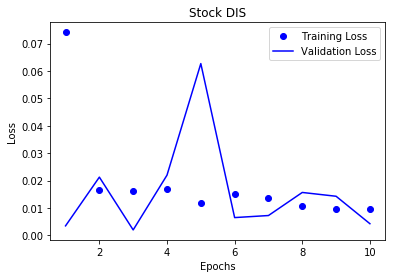

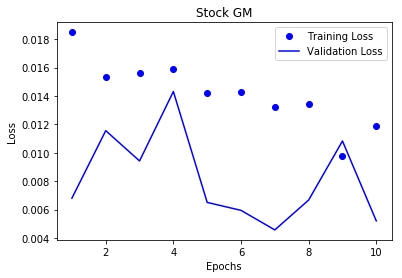

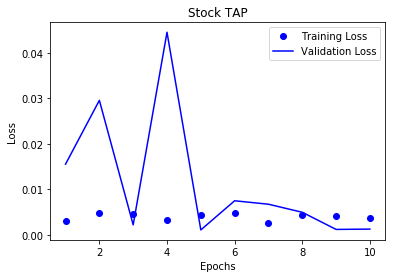

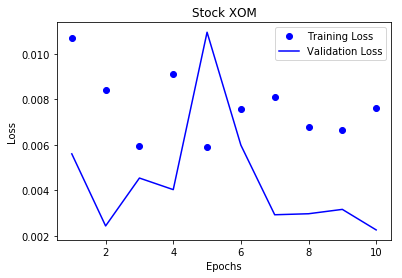

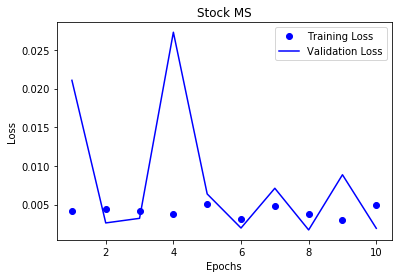

...

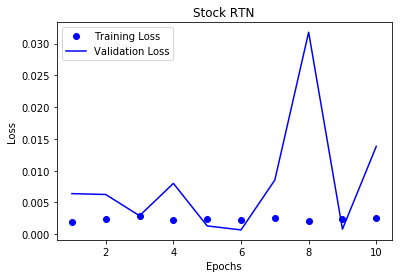

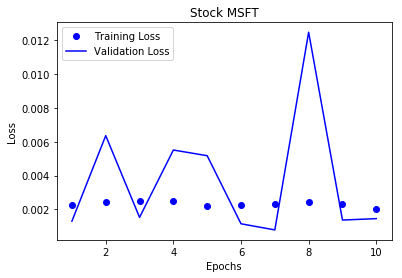

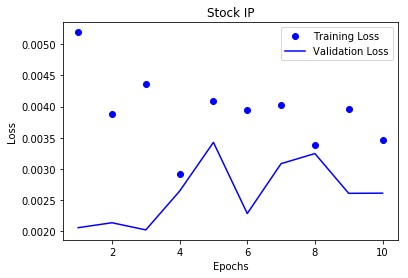

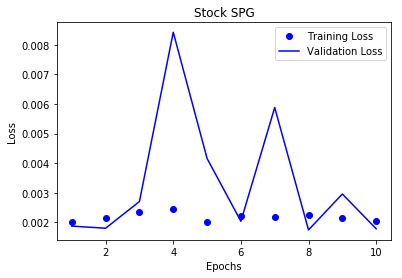

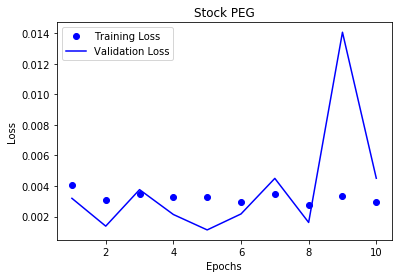

In [50]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_4high[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_4high[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

The impact of regulation is very notable as we start to witness sign of underfitting in stocks such as GM and CVS.

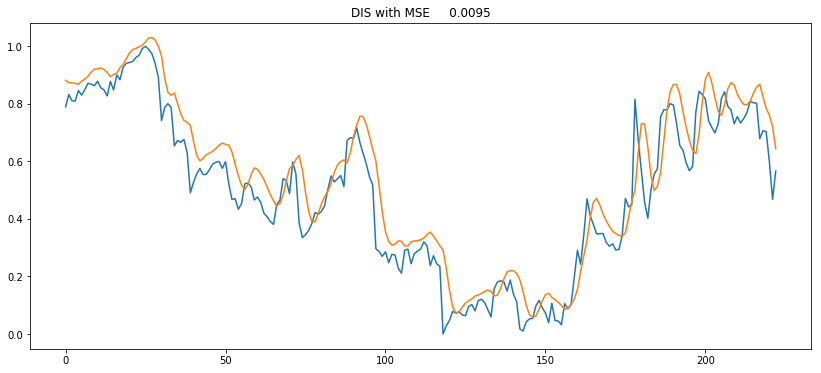

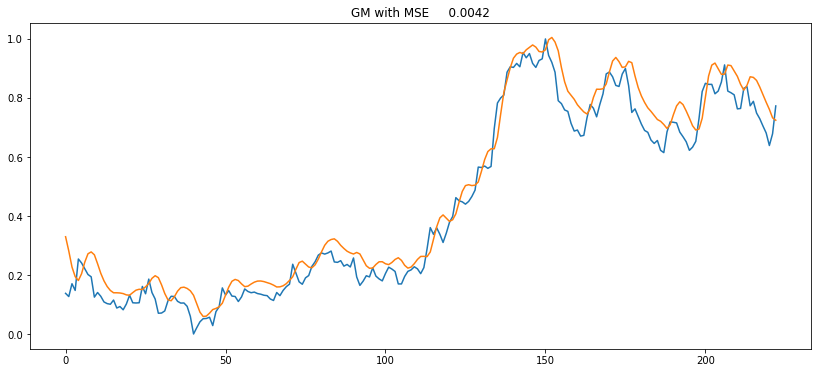

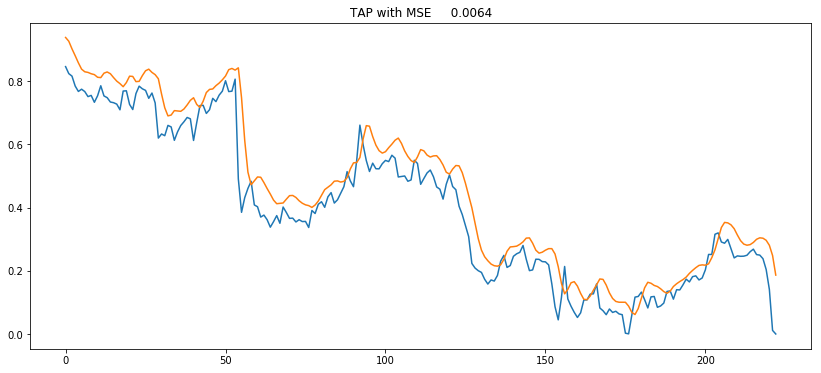

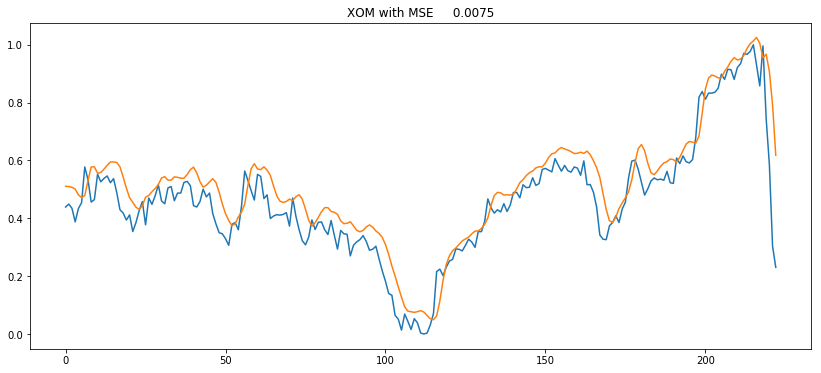

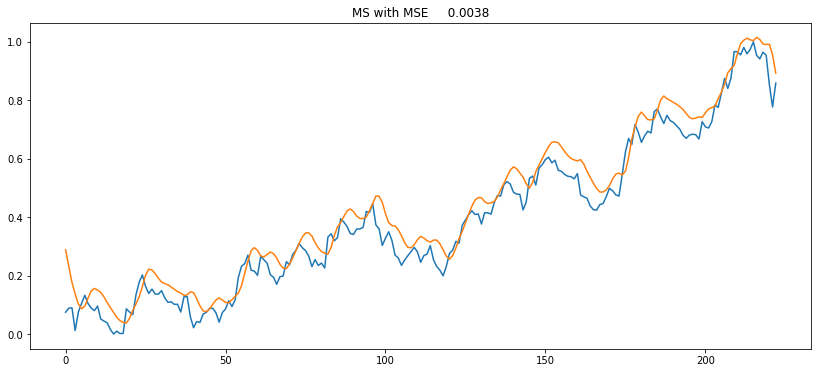

...

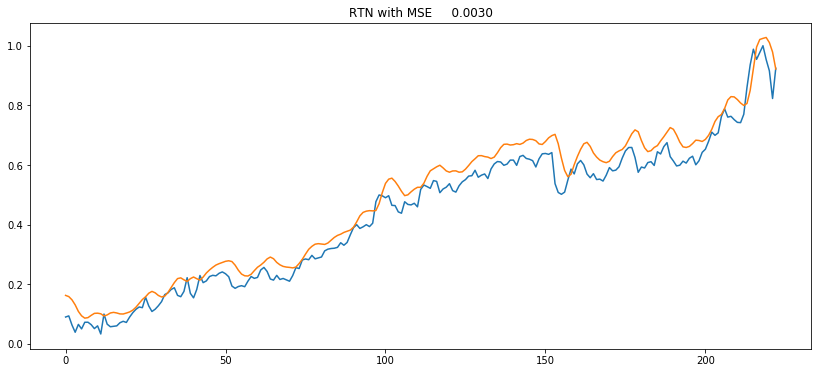

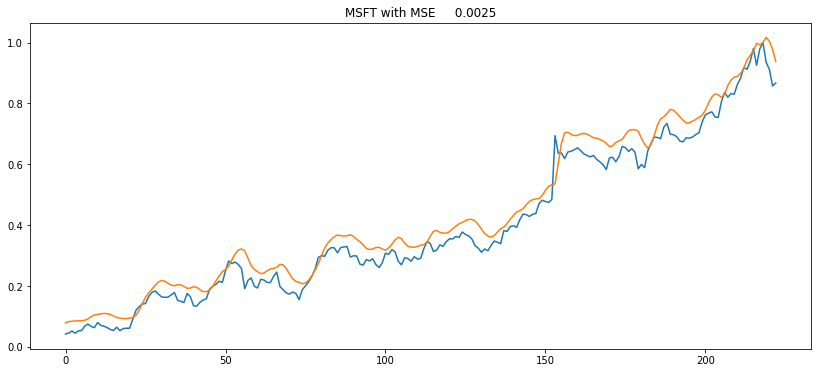

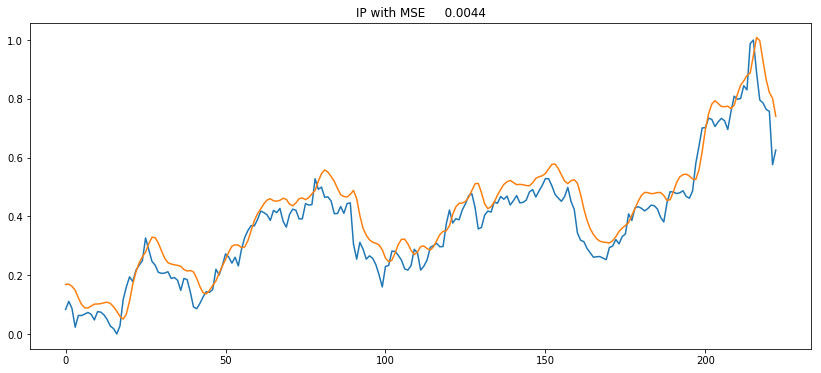

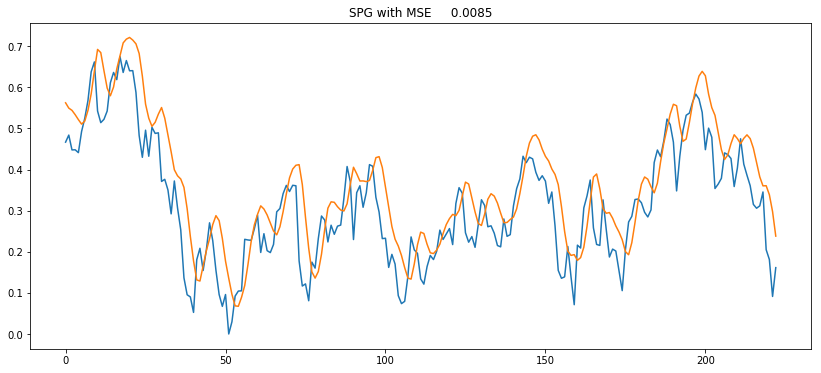

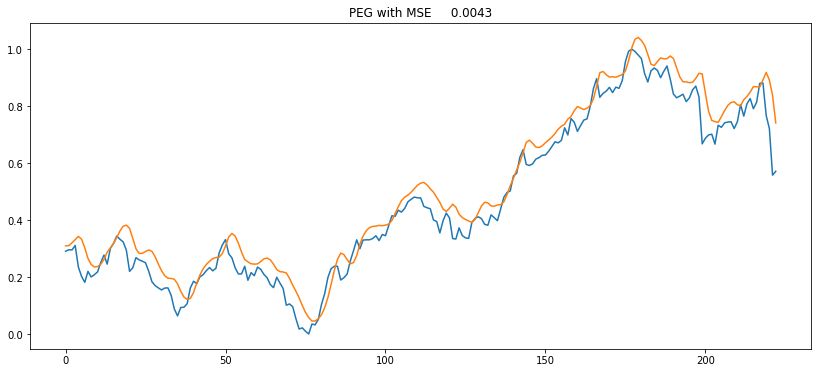

In [51]:
pred_result_4high = {}
MSE4_high={}
for i in names:
    y_true = testset_high[i]["y"].reshape(-1,1)
    y_pred = model4.predict(testset_high[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_4high[i] = {}
    pred_result_4high[i]["True High"] = y_true
    pred_result_4high[i]["Pred High"] = y_pred
    MSE4_high[i]=[]
    MSE4_high[i].append(truncate(MSE,5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Train model 4 on train low.

In [52]:
history_4low={}
for i in names:
    print("Fitting to", i)
    history_4low[i]=model3.fit(trainset_low[i]["X"], trainset_low[i]["y"], epochs=10, batch_size=64, validation_split=0.2)

Fitting to DIS
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 398us/step - loss: 0.0014 - val_loss: 1.5405e-04
Epoch 2/10
781/781 [==============================] - 0s 544us/step - loss: 0.0010 - val_loss: 0.0017
Epoch 3/10
781/781 [==============================] - 0s 462us/step - loss: 0.0012 - val_loss: 1.9890e-04
Epoch 4/10
781/781 [==============================] - 0s 466us/step - loss: 0.0012 - val_loss: 4.6515e-04
Epoch 5/10
781/781 [==============================] - 0s 506us/step - loss: 0.0013 - val_loss: 2.7230e-04
Epoch 6/10
781/781 [==============================] - 0s 447us/step - loss: 0.0011 - val_loss: 7.6101e-04
Epoch 7/10
781/781 [==============================] - 0s 610us/step - loss: 0.0011 - val_loss: 0.0017
Epoch 8/10
781/781 [==============================] - 0s 506us/step - loss: 0.0011 - val_loss: 2.5992e-04
Epoch 9/10
781/781 [==============================] - 0s 527us/step - loss: 0.0011 - val_loss: 1.77

781/781 [==============================] - 0s 561us/step - loss: 6.2660e-04 - val_loss: 3.5154e-04
Epoch 4/10
781/781 [==============================] - 0s 547us/step - loss: 6.2379e-04 - val_loss: 8.4196e-04
Epoch 5/10
781/781 [==============================] - 0s 526us/step - loss: 6.2692e-04 - val_loss: 2.9763e-04
Epoch 6/10
781/781 [==============================] - 0s 558us/step - loss: 5.8846e-04 - val_loss: 5.9707e-04
Epoch 7/10
781/781 [==============================] - 0s 535us/step - loss: 6.2179e-04 - val_loss: 8.4794e-04
Epoch 8/10
781/781 [==============================] - 0s 567us/step - loss: 6.1560e-04 - val_loss: 0.0013
Epoch 9/10
781/781 [==============================] - 0s 545us/step - loss: 5.8172e-04 - val_loss: 0.0015
Epoch 10/10
781/781 [==============================] - 0s 535us/step - loss: 6.5709e-04 - val_loss: 9.5823e-04
Fitting to IP
Train on 781 samples, validate on 196 samples
Epoch 1/10
781/781 [==============================] - 0s 563us/step - loss: 0.

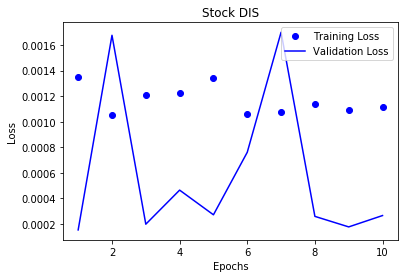

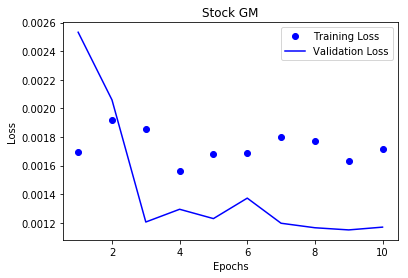

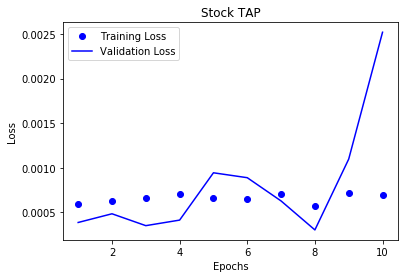

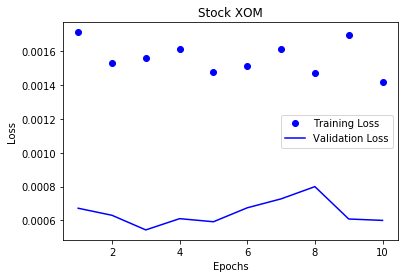

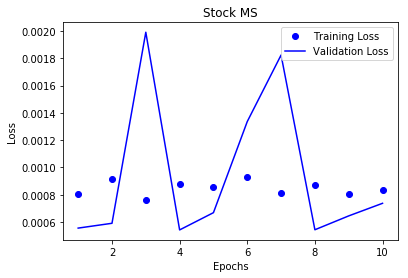

...

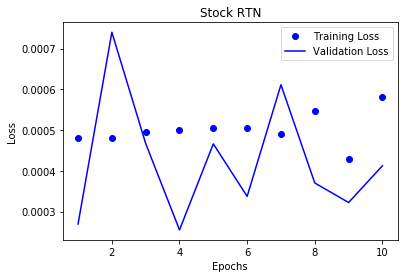

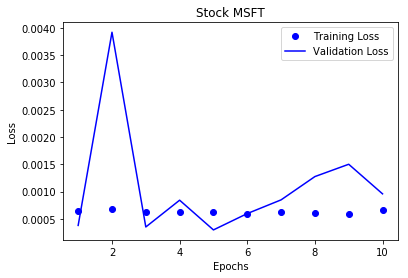

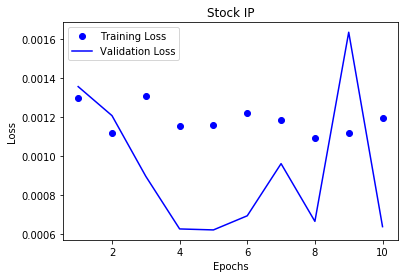

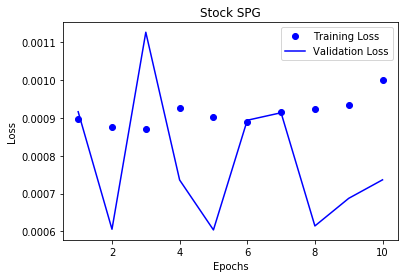

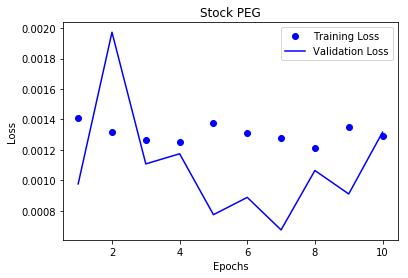

In [53]:
epochs=range(1,11)
for i in names:
    plt.plot(epochs, history_4low[i].history['loss'], 'bo', label='Training Loss')
    plt.plot(epochs, history_4low[i].history['val_loss'], 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Stock '+i)
    plt.legend()
    plt.show()

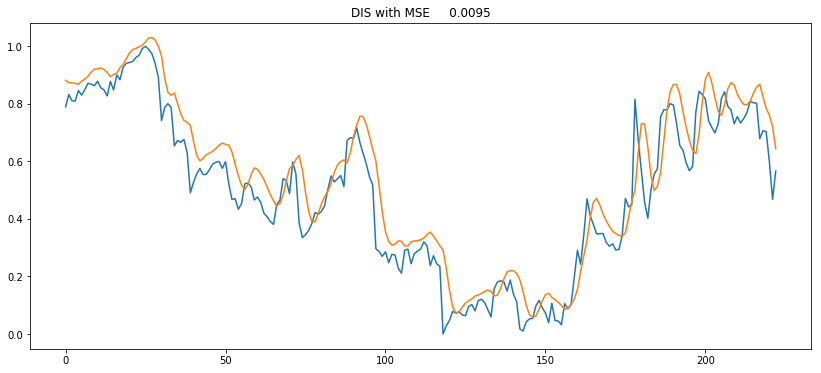

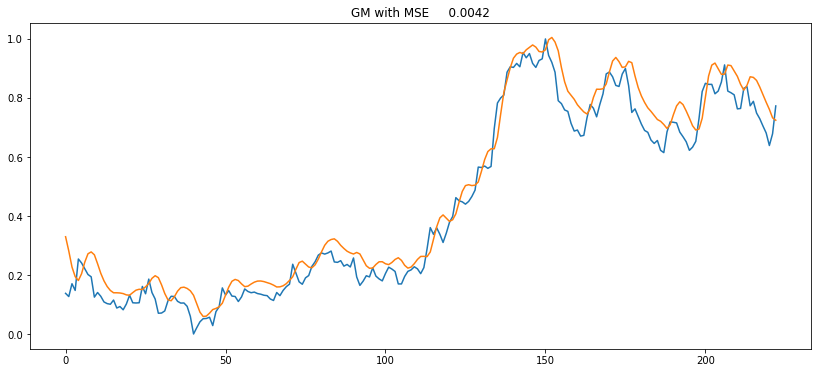

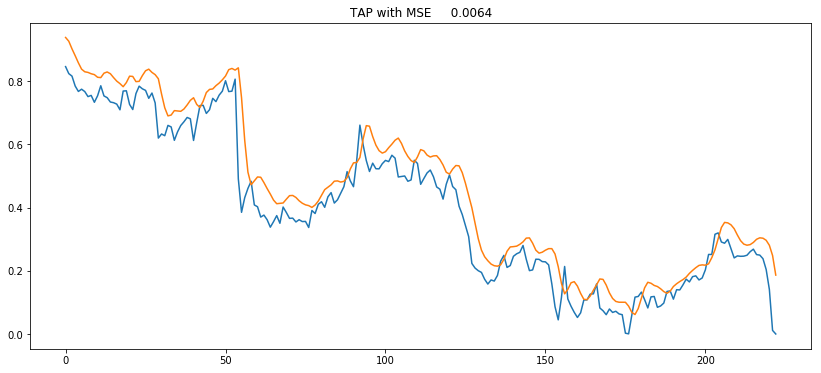

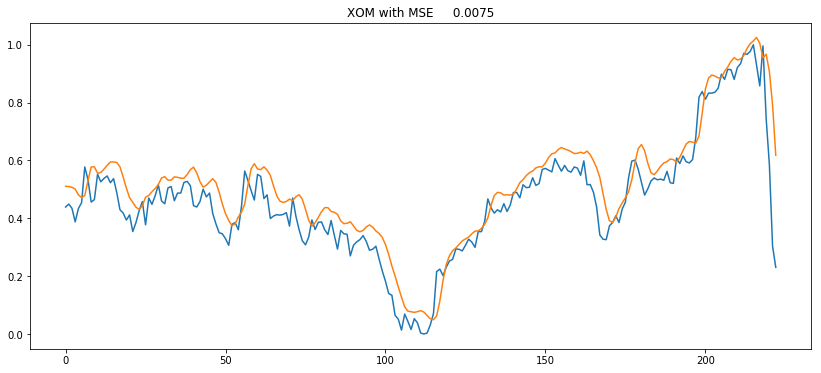

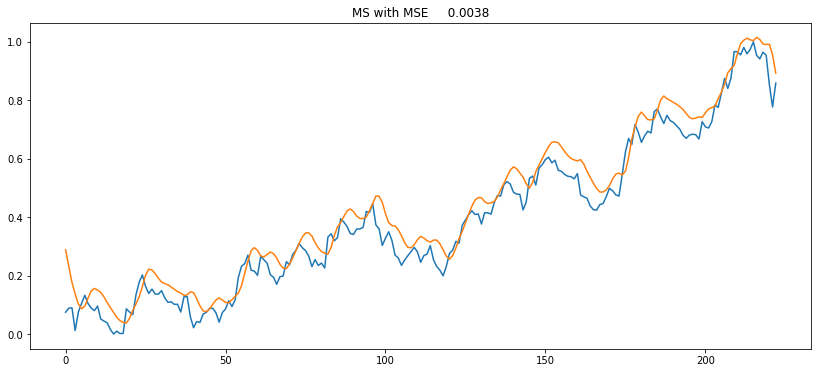

...

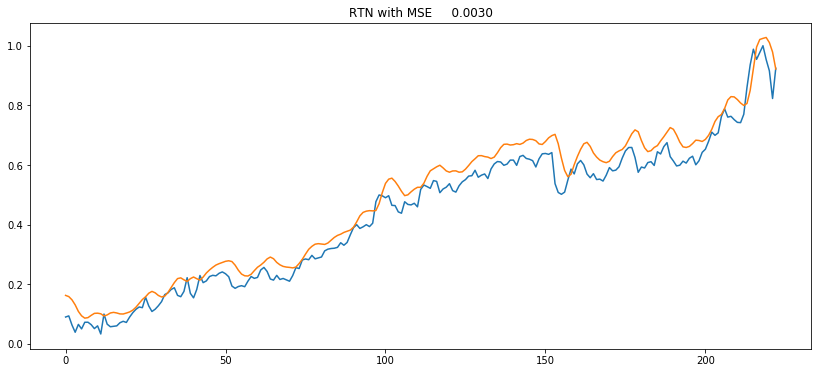

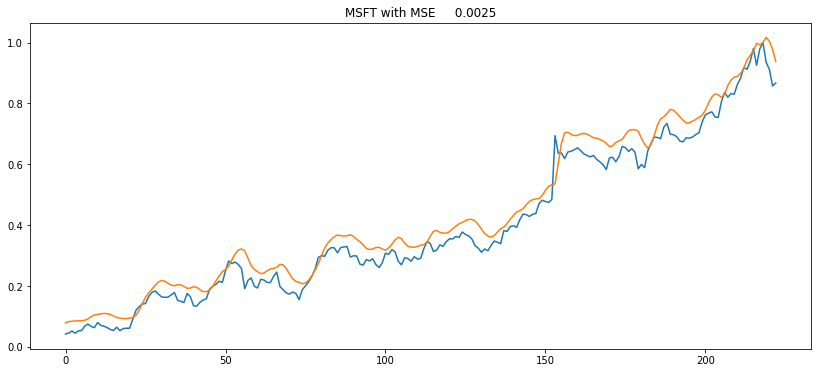

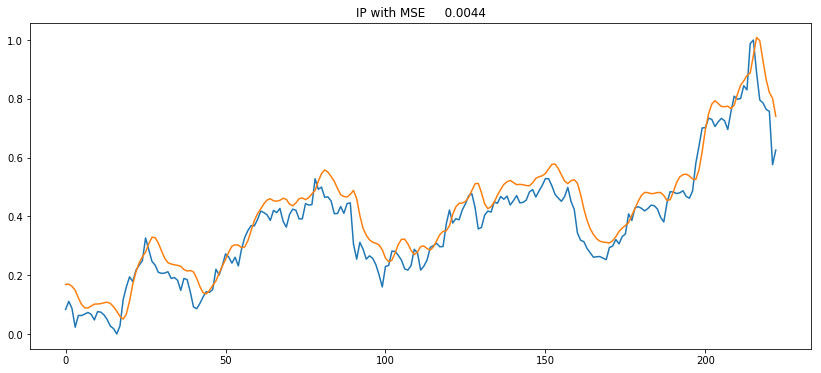

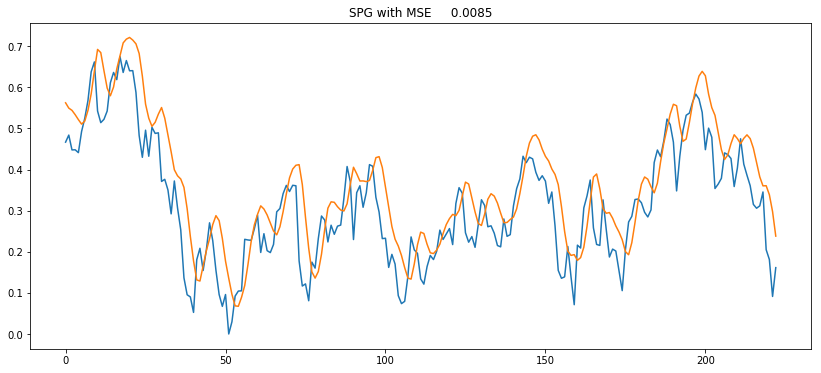

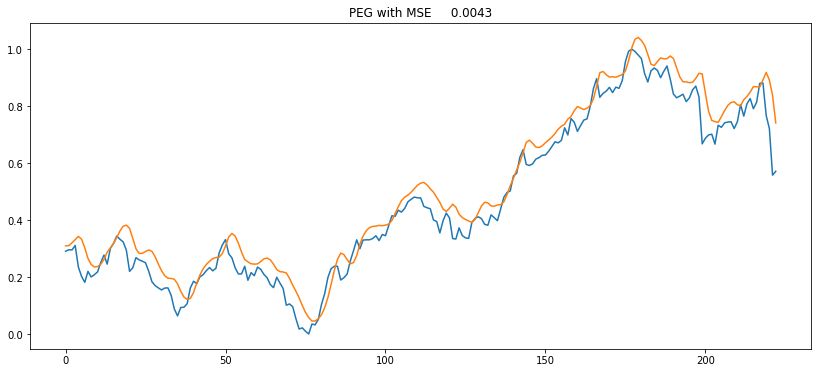

In [54]:
pred_result_4low = {}
MSE4_low={}
for i in names:
    y_true = testset_low[i]["y"].reshape(-1,1)
    y_pred = model4.predict(testset_low[i]["X"])
    MSE = mean_squared_error(y_true, y_pred)
    pred_result_4low[i] = {}
    pred_result_4low[i]["True High"] = y_true
    pred_result_4low[i]["Pred High"] = y_pred
    MSE4_low[i]=[]
    MSE4_low[i].append(truncate(MSE, 5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

*With added regulations, the model started to miss more details and show sign of underfitting.*

**Step 2: Compare the results from all 4 models.**

In [55]:
from collections import OrderedDict

Daily high prediction.

Compare Model 1 (2 LSTM layers) MSE vs. Model 2 (4 LSTM layers) MSE on daily high set.

In [56]:
model1_high=[]
for i in names:
    model1_high.append(MSE1_high[i])

model2_high=[]
for i in names:
    model2_high.append(MSE2_high[i])

comparison_high_1=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers', model1_high),
                        ('4 LSTM Layers', model2_high)]))
print(comparison_high_1)

   Stock Name 2 LSTM Layers 4 LSTM Layers
0         DIS     [0.00374]     [0.00549]
1          GM     [0.00116]      [0.0026]
2         TAP     [0.00169]     [0.00285]
3         XOM     [0.00259]     [0.00351]
4          MS     [0.00118]     [0.00212]
5         CVS     [0.00573]     [0.00769]
6         RTN     [0.00061]      [0.0015]
7        MSFT     [0.00061]     [0.00153]
8          IP     [0.00139]     [0.00212]
9         SPG     [0.00323]     [0.00397]
10        PEG     [0.00116]     [0.00234]


Compare Model 3 (2 LSTM layers with dropout) MSE and Model 4 (4 LSTM layers with dropout) MSE on daily high set.

In [57]:
model3_high=[]
for i in names:
    model3_high.append(MSE3_high[i])

model4_high=[]
for i in names:
    model4_high.append(MSE4_high[i])

comparison_high_2=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers Dropout', model3_high),
                        ('4 LSTM Layers Dropout', model4_high)]))
print(comparison_high_2)

   Stock Name 2 LSTM Layers Dropout 4 LSTM Layers Dropout
0         DIS             [0.00713]             [0.00951]
1          GM             [0.00424]             [0.00422]
2         TAP             [0.00329]             [0.00644]
3         XOM             [0.00509]             [0.00751]
4          MS             [0.00346]             [0.00381]
5         CVS             [0.01057]             [0.01353]
6         RTN             [0.00287]             [0.00299]
7        MSFT             [0.00261]             [0.00245]
8          IP             [0.00317]              [0.0044]
9         SPG             [0.00492]             [0.00852]
10        PEG             [0.00399]             [0.00432]


*As the number of LSTM layers increase, the model's performance actually decreases.*

Compare Model 1 (2 LSTM layers) MSE and Model 3 (2 LSTM layers with dropout) MSE on daily high set.

In [58]:
comparison_high_3=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers', model1_high),
                        ('2 LSTM Layers Dropout', model3_high)]))
print(comparison_high_3)

   Stock Name 2 LSTM Layers 2 LSTM Layers Dropout
0         DIS     [0.00374]             [0.00713]
1          GM     [0.00116]             [0.00424]
2         TAP     [0.00169]             [0.00329]
3         XOM     [0.00259]             [0.00509]
4          MS     [0.00118]             [0.00346]
5         CVS     [0.00573]             [0.01057]
6         RTN     [0.00061]             [0.00287]
7        MSFT     [0.00061]             [0.00261]
8          IP     [0.00139]             [0.00317]
9         SPG     [0.00323]             [0.00492]
10        PEG     [0.00116]             [0.00399]


*While the numberic results are very close, the plots also confirms the dropout help increase the model's performance.*

Compare Model 2 (4 LSTM layers) MSE and Model 4 (4 LSTM layers with dropout) MSE on daily high set.

In [59]:
comparison_high_4=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('4 LSTM Layers', model2_high),
                        ('4 LSTM Layers Dropout', model4_high)]))
print(comparison_high_4)

   Stock Name 4 LSTM Layers 4 LSTM Layers Dropout
0         DIS     [0.00549]             [0.00951]
1          GM      [0.0026]             [0.00422]
2         TAP     [0.00285]             [0.00644]
3         XOM     [0.00351]             [0.00751]
4          MS     [0.00212]             [0.00381]
5         CVS     [0.00769]             [0.01353]
6         RTN      [0.0015]             [0.00299]
7        MSFT     [0.00153]             [0.00245]
8          IP     [0.00212]              [0.0044]
9         SPG     [0.00397]             [0.00852]
10        PEG     [0.00234]             [0.00432]


*Added regulation actually decreased the model's performance.* 

Daily Low Prediction.

In [60]:
model1_low=[]
for i in names:
    model1_low.append(MSE1_low[i])

model2_low=[]
for i in names:
    model2_low.append(MSE2_low[i])

comparison_low_1=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers', model1_low),
                        ('4 LSTM Layers', model2_low)]))
print(comparison_low_1)

   Stock Name 2 LSTM Layers 4 LSTM Layers
0         DIS     [0.00366]     [0.00549]
1          GM     [0.00122]      [0.0026]
2         TAP     [0.00157]     [0.00285]
3         XOM     [0.00249]     [0.00351]
4          MS     [0.00121]     [0.00212]
5         CVS     [0.00522]     [0.00769]
6         RTN     [0.00067]      [0.0015]
7        MSFT     [0.00067]     [0.00153]
8          IP     [0.00135]     [0.00212]
9         SPG     [0.00302]     [0.00397]
10        PEG     [0.00116]     [0.00234]


In [61]:
model3_low=[]
for i in names:
    model3_low.append(MSE3_low[i])

model4_low=[]
for i in names:
    model4_low.append(MSE4_low[i])

comparison_low_2=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers Dropout', model3_low),
                        ('4 LSTM Layers Dropout', model4_low)]))
print(comparison_low_2)

   Stock Name 2 LSTM Layers Dropout 4 LSTM Layers Dropout
0         DIS             [0.00439]             [0.00951]
1          GM             [0.00218]             [0.00422]
2         TAP              [0.0021]             [0.00644]
3         XOM             [0.00299]             [0.00751]
4          MS             [0.00188]             [0.00381]
5         CVS             [0.00654]             [0.01353]
6         RTN             [0.00131]             [0.00299]
7        MSFT             [0.00125]             [0.00245]
8          IP             [0.00174]              [0.0044]
9         SPG             [0.00325]             [0.00852]
10        PEG               [0.002]             [0.00432]


*By increasing the number of LSTM layers, we weren't able to increase the RNN model's performance based on MSE. For daily low prediction, it seems that less LSTM layers actually help to achieve higher prediction accuracy.*

In [62]:
comparison_low_3=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('2 LSTM Layers', model1_low),
                        ('2 LSTM Layers Dropout', model3_low)]))
print(comparison_low_3)

   Stock Name 2 LSTM Layers 2 LSTM Layers Dropout
0         DIS     [0.00366]             [0.00439]
1          GM     [0.00122]             [0.00218]
2         TAP     [0.00157]              [0.0021]
3         XOM     [0.00249]             [0.00299]
4          MS     [0.00121]             [0.00188]
5         CVS     [0.00522]             [0.00654]
6         RTN     [0.00067]             [0.00131]
7        MSFT     [0.00067]             [0.00125]
8          IP     [0.00135]             [0.00174]
9         SPG     [0.00302]             [0.00325]
10        PEG     [0.00116]               [0.002]


In [63]:
comparison_low_4=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('4 LSTM Layers', model2_low),
                        ('4 LSTM Layers Dropout', model4_low)]))
print(comparison_low_4)

   Stock Name 4 LSTM Layers 4 LSTM Layers Dropout
0         DIS     [0.00549]             [0.00951]
1          GM      [0.0026]             [0.00422]
2         TAP     [0.00285]             [0.00644]
3         XOM     [0.00351]             [0.00751]
4          MS     [0.00212]             [0.00381]
5         CVS     [0.00769]             [0.01353]
6         RTN      [0.0015]             [0.00299]
7        MSFT     [0.00153]             [0.00245]
8          IP     [0.00212]              [0.0044]
9         SPG     [0.00397]             [0.00852]
10        PEG     [0.00234]             [0.00432]


*It's interesting to see that the dropout had more significant impact on the model with 4 LSTM layers than the model of 2 LSTM layers. This is most likely because we added dropout after each LSTM layer, meaning the model with 4 LSTM layers had more regulations than the one with less LSTM layers.*

*The results of our experiment indicates that (1) LSTM neural network is able to provide satisfying prediction solely based on stock's past performance; (2) There's no strong evidence showing more LSTM layers lead to  better performance, especially  when predicting daily low pricing point. Considering the fact that it's harder and more expensive to train a more complex neural network, we suggest using the model of 2 LSTM layers instead of 4 LSTM layers; (3) In the case of 2 LSTM layers, dropout didn't the model's performance. Therefore, it's decided to use model 1 structure as the recommend LSTM neural network.*

Scale back model 1 result and plot the prediction against actual daily low.

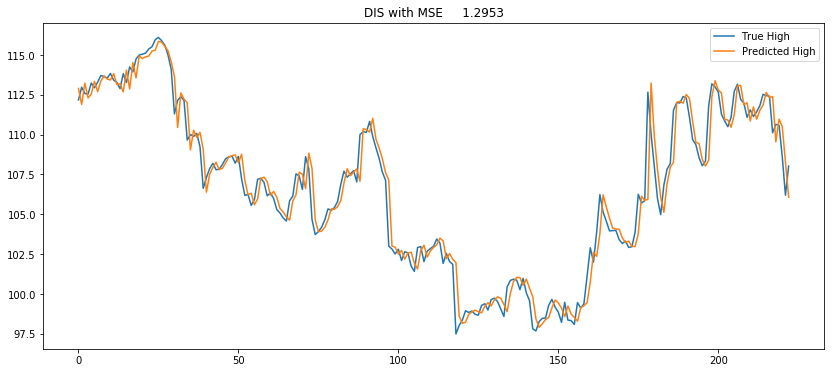

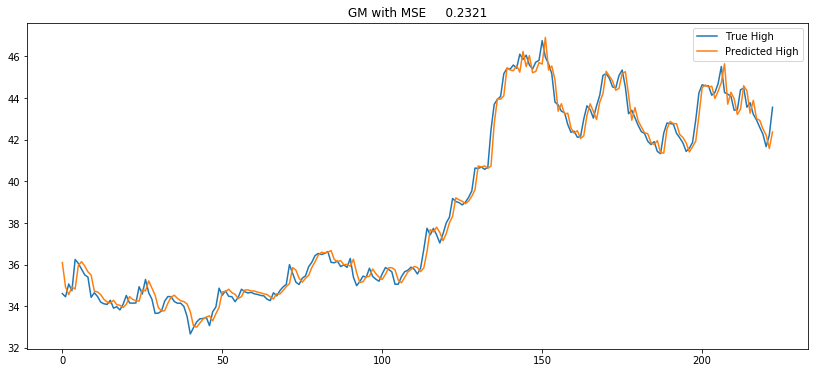

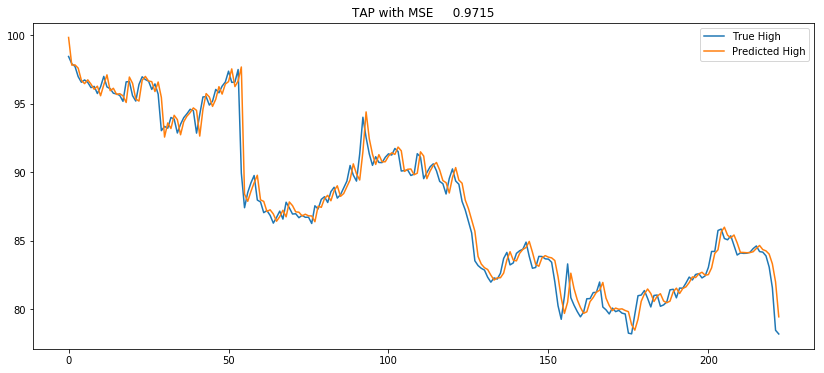

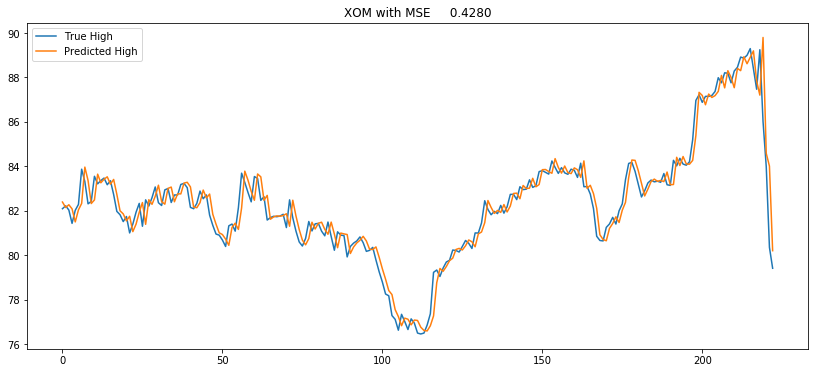

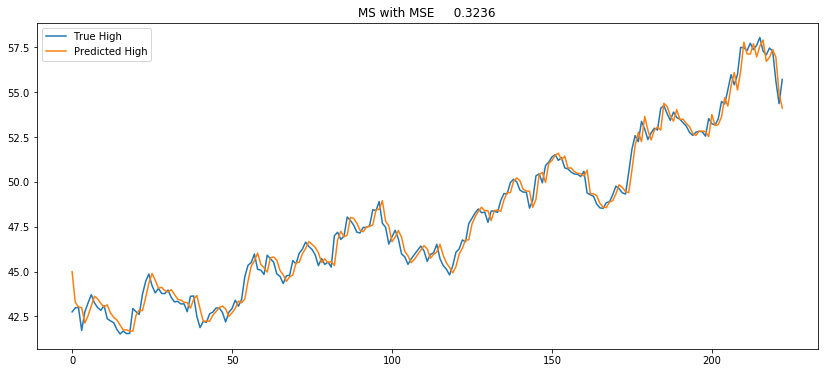

...

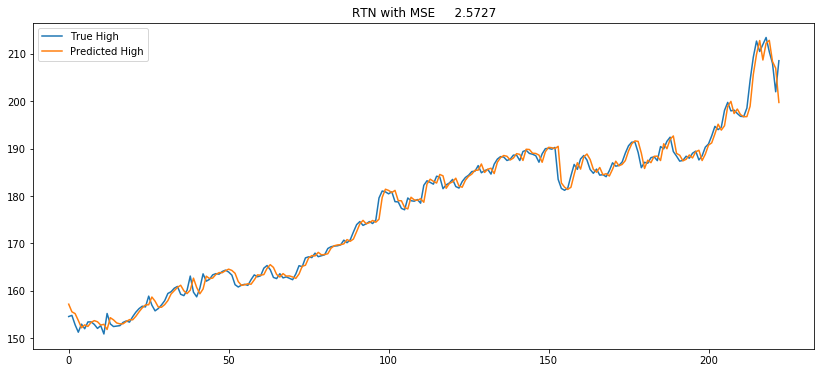

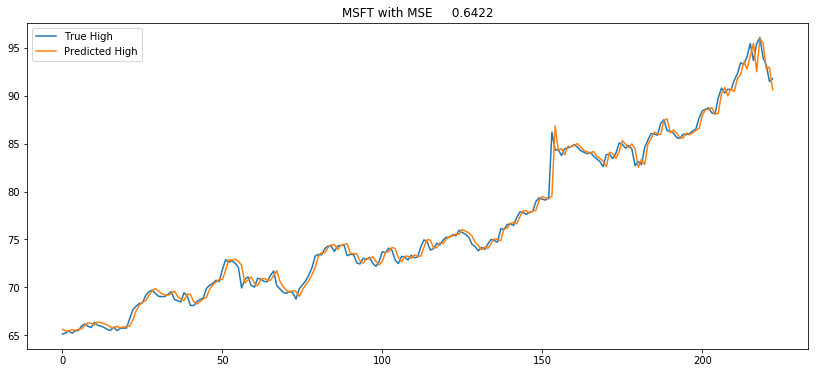

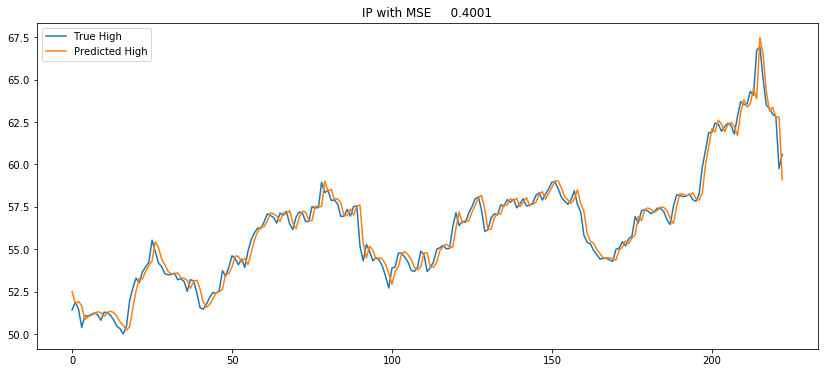

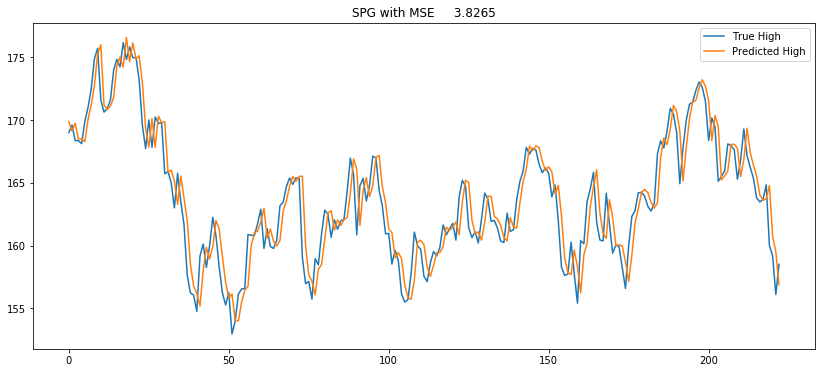

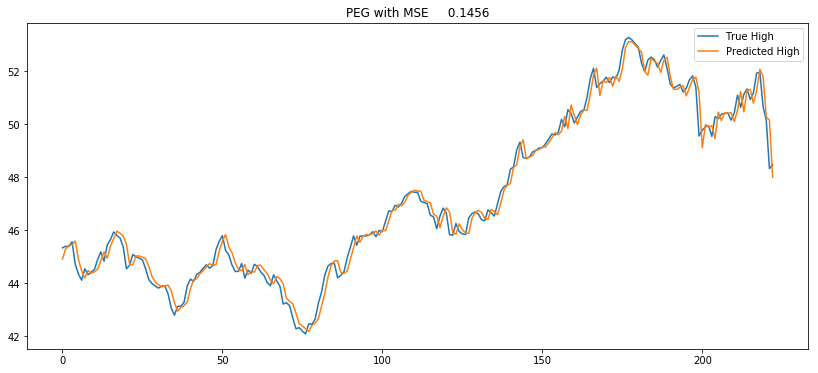

In [64]:
LSTM_MSE_high={}

for i in names:
    y_true = scaler_high[i].inverse_transform(pred_result_1high[i]["True High"])
    y_pred = scaler_high[i].inverse_transform(pred_result_1high[i]['Pred High'])
    MSE = mean_squared_error(y_true, y_pred)
    LSTM_MSE_high[i]=[]
    LSTM_MSE_high[i].append(truncate(MSE, 5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)
    plt.legend(["True High",  'Predicted High'])

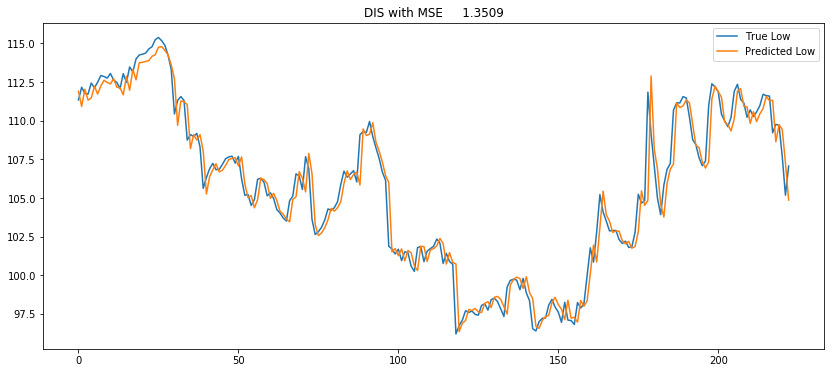

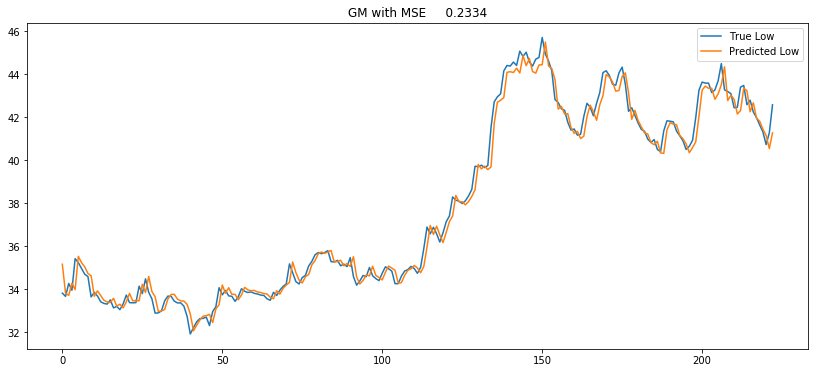

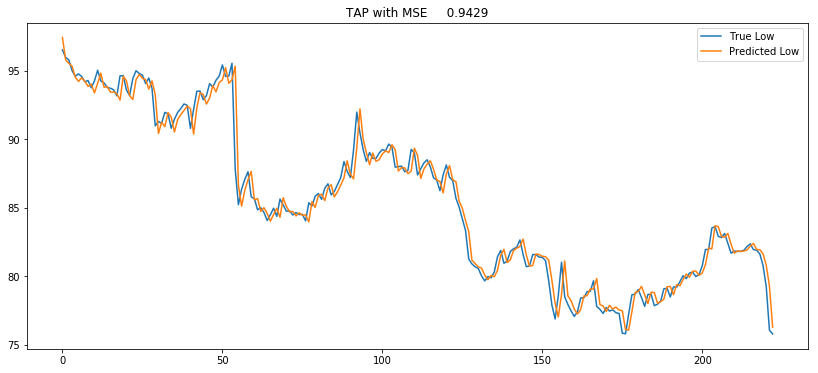

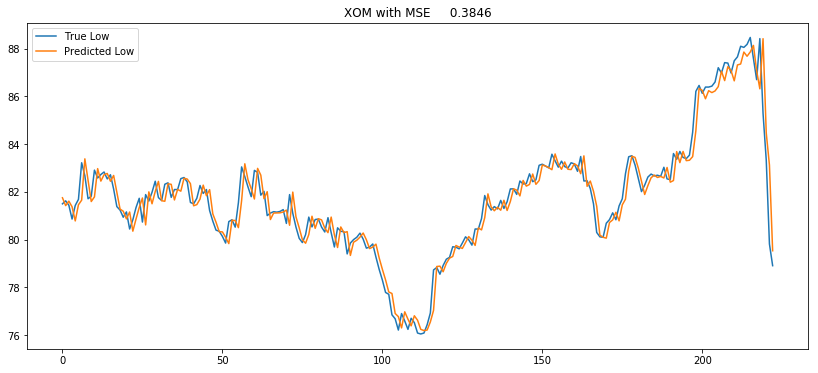

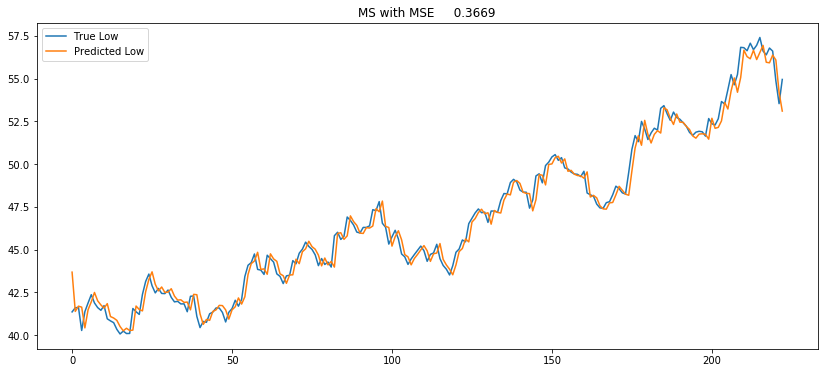

...

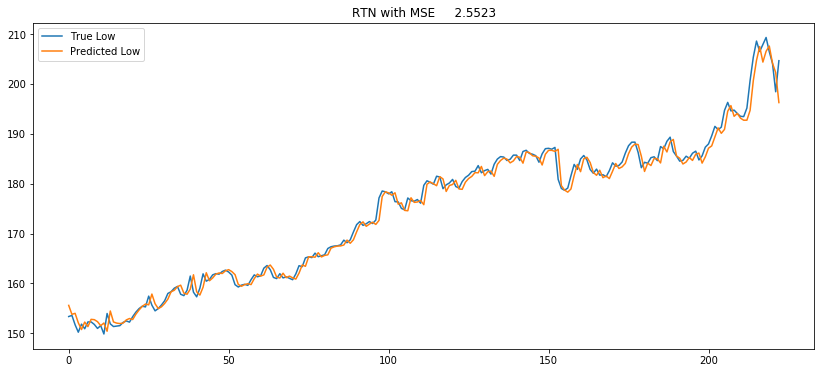

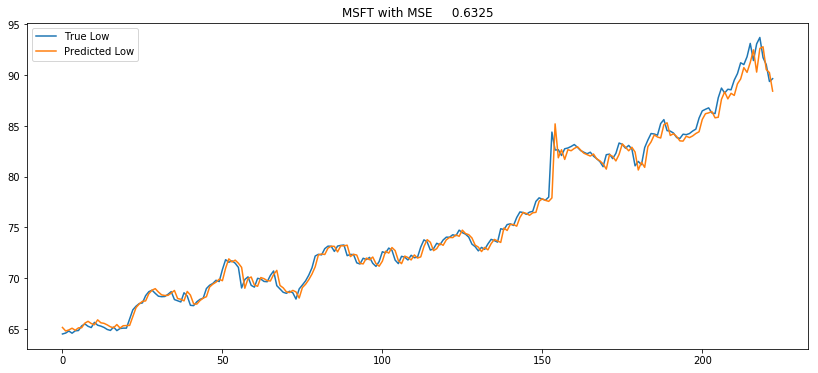

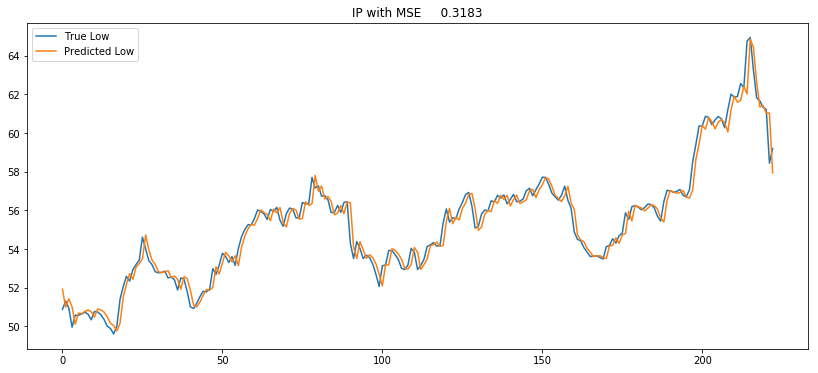

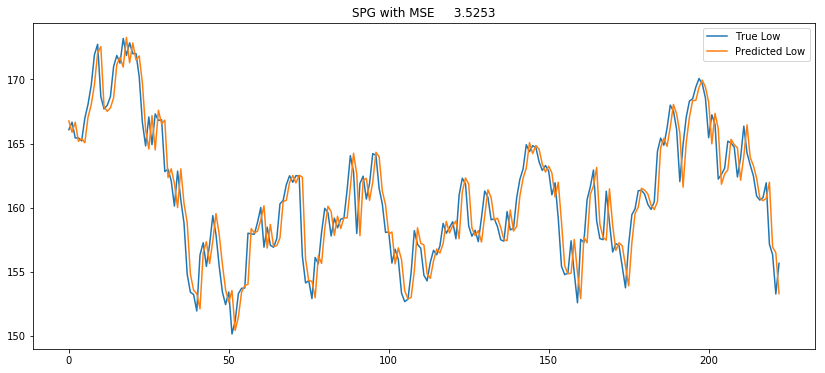

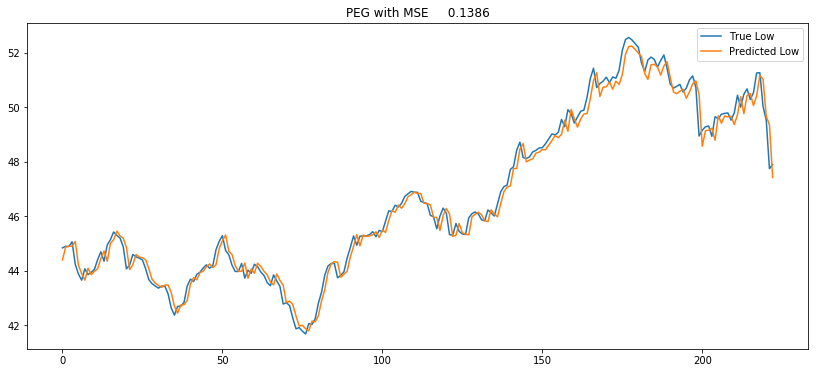

In [66]:
LSTM_MSE_low={}

for i in names:
    y_true = scaler_low[i].inverse_transform(pred_result_1low[i]["True Low"])
    y_pred = scaler_low[i].inverse_transform(pred_result_1low[i]['Pred Low'])
    MSE = mean_squared_error(y_true, y_pred)
    LSTM_MSE_high[i]=[]
    LSTM_MSE_high[i].append(truncate(MSE, 5))
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)
    plt.legend(["True Low",  'Predicted Low'])

# Time Series Analysis with Auto ARIMA

ARIMA is a popular technique for time series analysis. However, configuring out the suitable combination of (p,q,d) is usually time consuming. Auto arima will help us automatically select the best combination of (p,q,d) that provides the least error, offering the benefit of ARIMA but elimnating the burden of time.

In [67]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

C:\Users\feifa\Anaconda3\envs\AI2\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
C:\Users\feifa\Anaconda3\envs\AI2\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


Use auto-arima model to predict daily high.

Fit ARIMA: order=(1, 1, 1); AIC=2753.282, BIC=2772.937, Fit time=0.133 seconds
Fit ARIMA: order=(0, 1, 0); AIC=2766.152, BIC=2775.980, Fit time=0.002 seconds
Fit ARIMA: order=(1, 1, 0); AIC=2751.555, BIC=2766.296, Fit time=0.015 seconds
Fit ARIMA: order=(0, 1, 1); AIC=2751.292, BIC=2766.033, Fit time=0.016 seconds
Fit ARIMA: order=(0, 1, 2); AIC=2753.286, BIC=2772.941, Fit time=0.025 seconds
Fit ARIMA: order=(1, 1, 2); AIC=2754.995, BIC=2779.564, Fit time=0.174 seconds
Total fit time: 0.377 seconds
Fit ARIMA: order=(1, 0, 1); AIC=1360.145, BIC=1379.804, Fit time=0.119 seconds
Fit ARIMA: order=(0, 0, 0); AIC=5125.298, BIC=5135.128, Fit time=0.002 seconds
Fit ARIMA: order=(1, 0, 0); AIC=1375.870, BIC=1390.614, Fit time=0.027 seconds
Fit ARIMA: order=(0, 0, 1); AIC=3930.354, BIC=3945.099, Fit time=0.044 seconds
Fit ARIMA: order=(2, 0, 1); AIC=1362.141, BIC=1386.714, Fit time=0.160 seconds
Fit ARIMA: order=(1, 0, 2); AIC=1362.137, BIC=1386.711, Fit time=0.149 seconds
Fit ARIMA: order=(2, 0

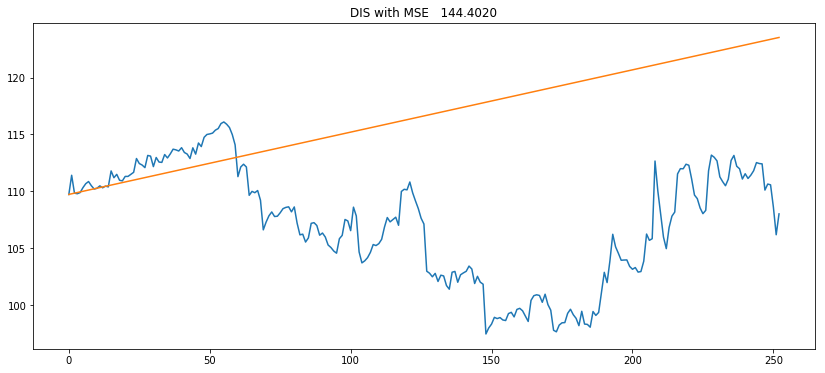

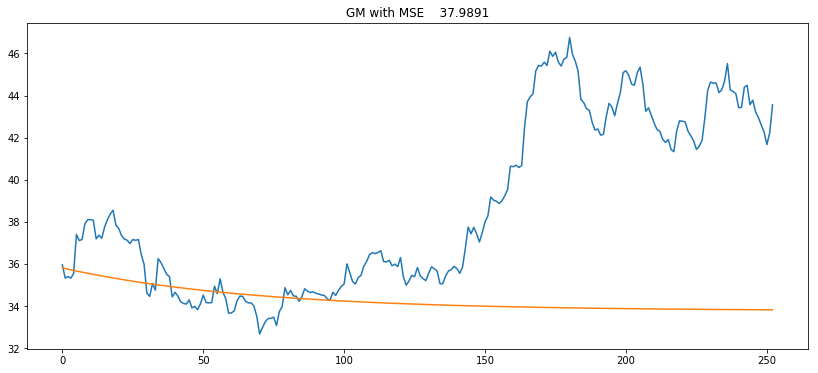

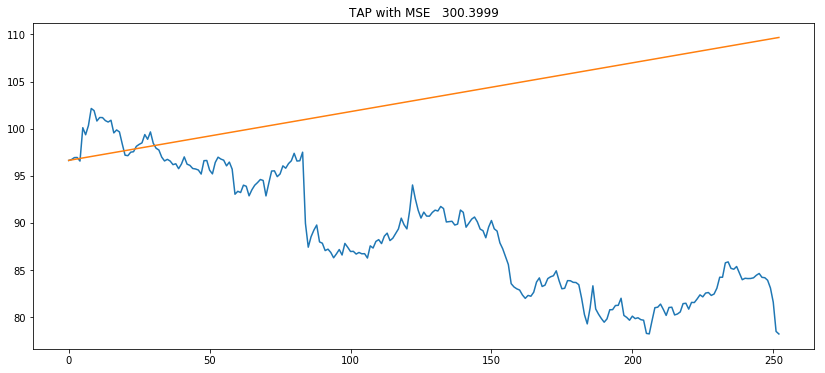

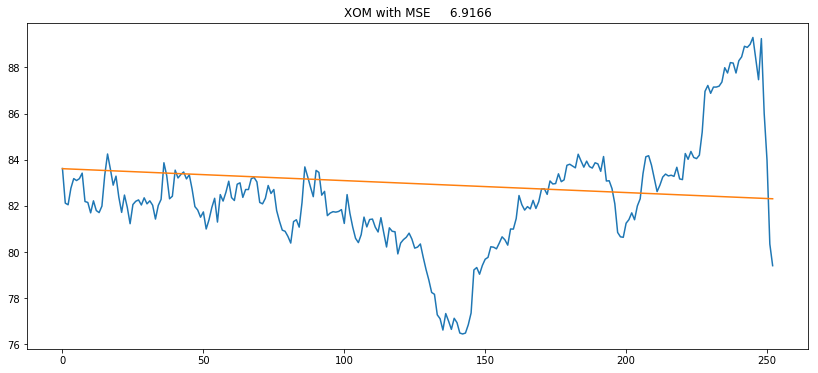

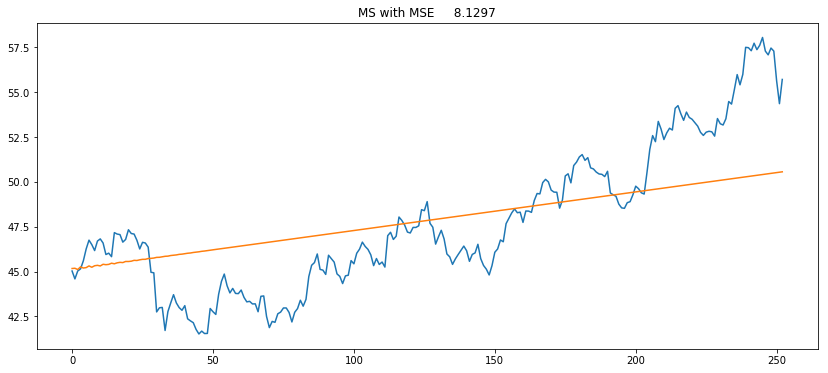

...

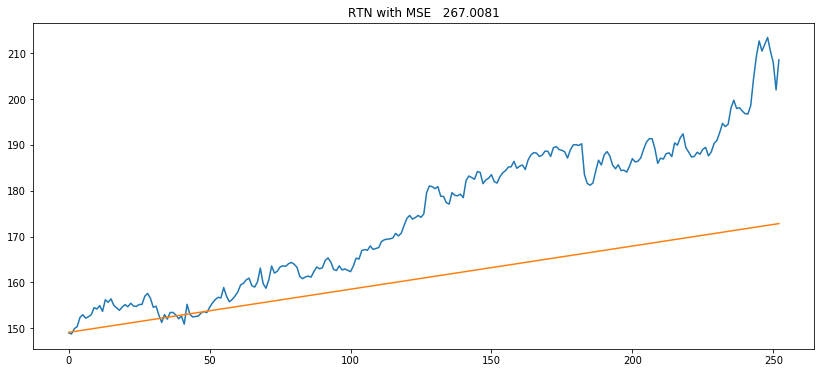

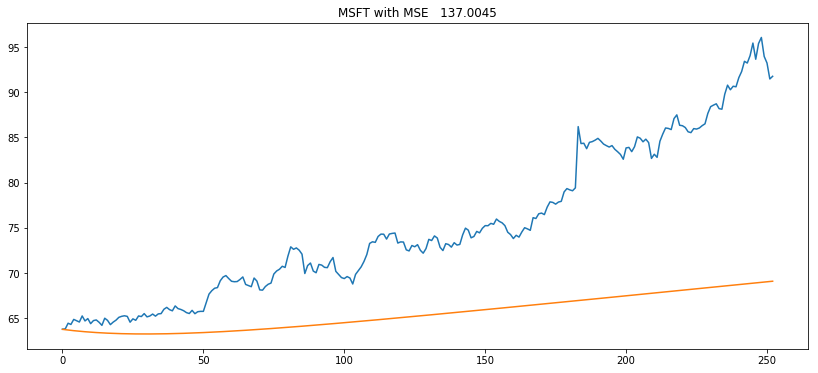

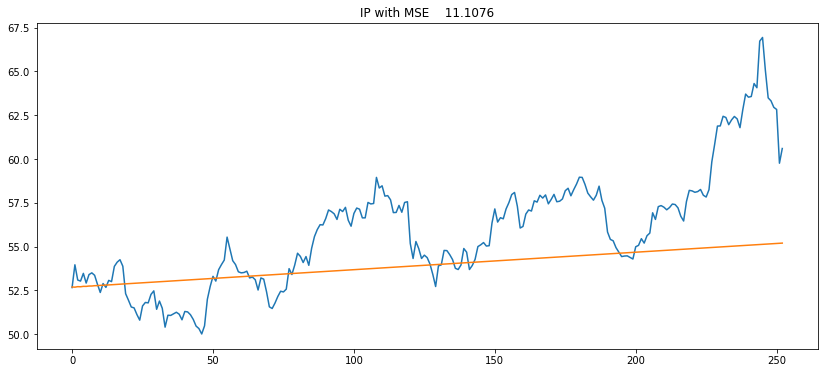

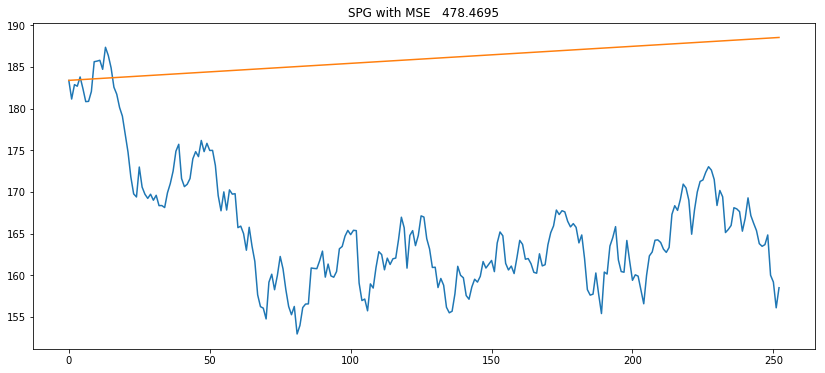

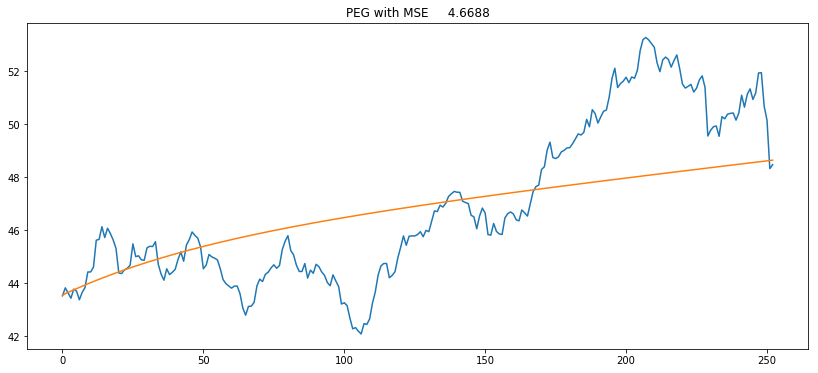

In [68]:
arima_mse_high={}
for i in names:
    model = pm.auto_arima(d_high[i]['Train'].values, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

    arima_mse_high[i]=[]
    y_true = d_high[i]['Test'].values
    y_pred = model.predict(n_periods=len(d_high[i]['Test']))
    MSE = mean_squared_error(y_true, y_pred)
    arima_mse_high[i].append(MSE)
   
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

Use auto arima model to predict daily low.

Fit ARIMA: order=(1, 1, 1); AIC=3077.390, BIC=3097.045, Fit time=0.127 seconds
Fit ARIMA: order=(0, 1, 0); AIC=3091.793, BIC=3101.621, Fit time=0.006 seconds
Fit ARIMA: order=(1, 1, 0); AIC=3078.324, BIC=3093.065, Fit time=0.019 seconds
Fit ARIMA: order=(0, 1, 1); AIC=3076.404, BIC=3091.145, Fit time=0.016 seconds
Fit ARIMA: order=(0, 1, 2); AIC=3076.616, BIC=3096.271, Fit time=0.024 seconds
Fit ARIMA: order=(1, 1, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.256 seconds
Fit ARIMA: order=(1, 0, 1); AIC=1539.545, BIC=1559.203, Fit time=0.112 seconds
Fit ARIMA: order=(0, 0, 0); AIC=5123.134, BIC=5132.963, Fit time=0.002 seconds
Fit ARIMA: order=(1, 0, 0); AIC=1542.434, BIC=1557.178, Fit time=0.025 seconds
Fit ARIMA: order=(0, 0, 1); AIC=3951.426, BIC=3966.170, Fit time=0.039 seconds
Fit ARIMA: order=(2, 0, 1); AIC=1541.537, BIC=1566.111, Fit time=0.137 seconds
Fit ARIMA: order=(1, 0, 2); AIC=1541.538, BIC=1566.112, Fit time=0.175 seconds
Fit ARIMA: order=(2, 0, 2); AIC=15

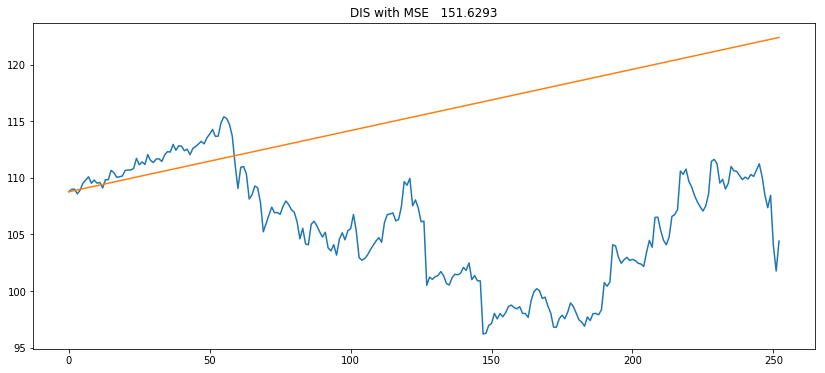

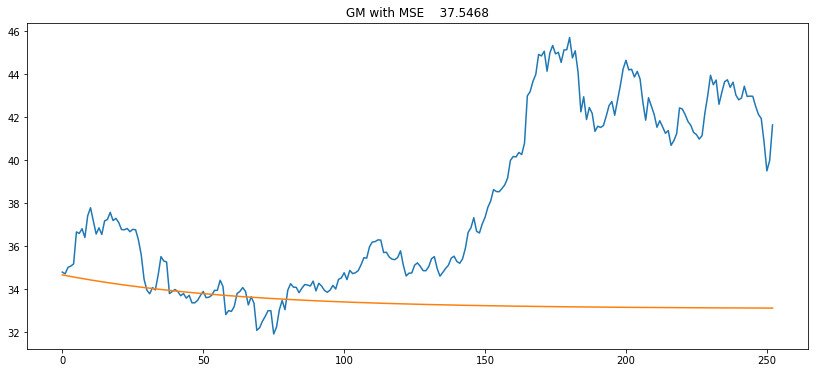

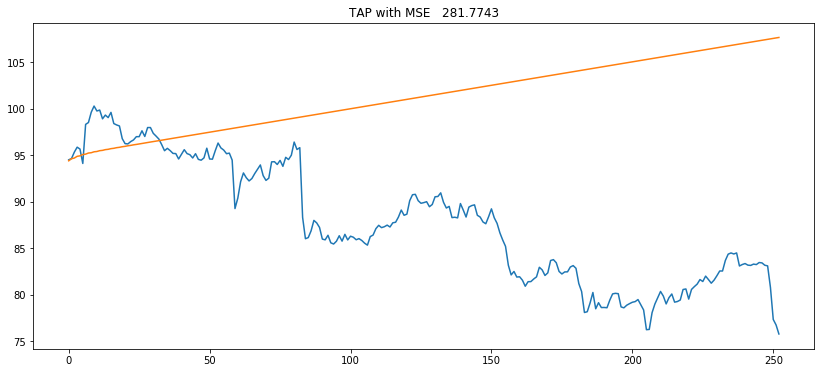

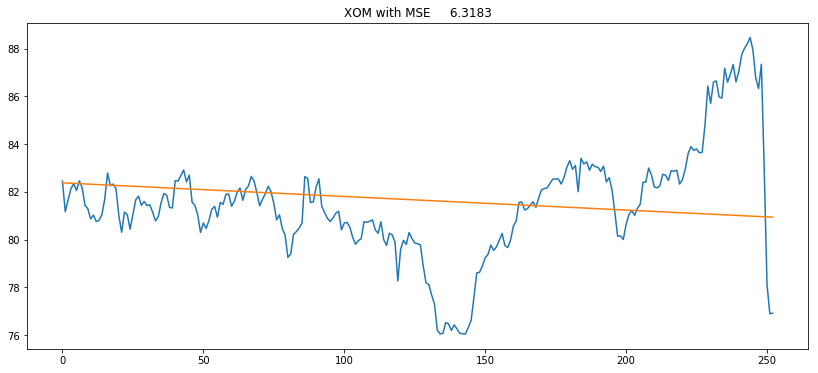

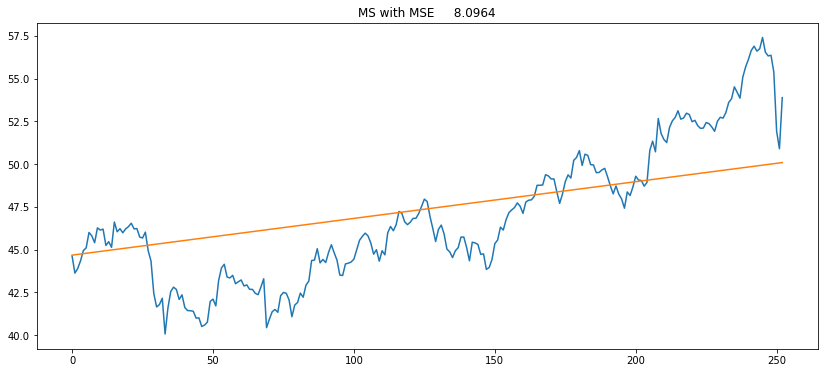

...

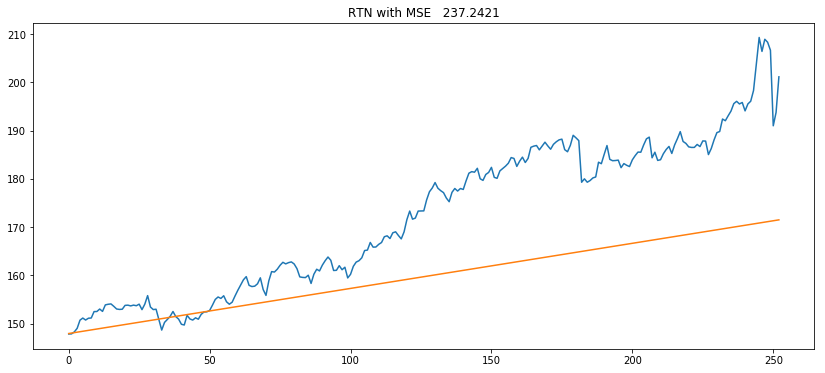

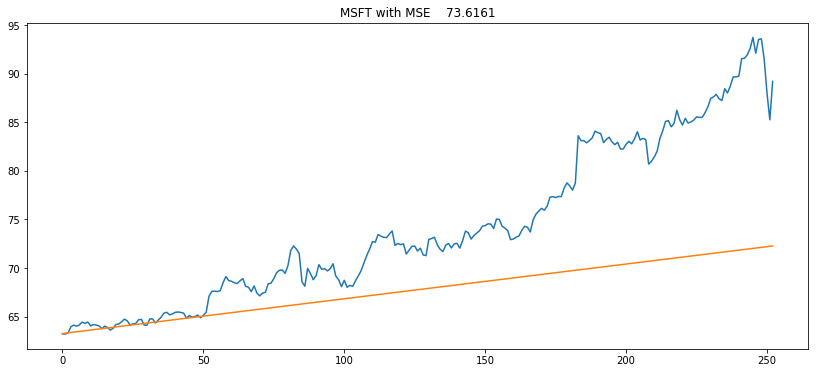

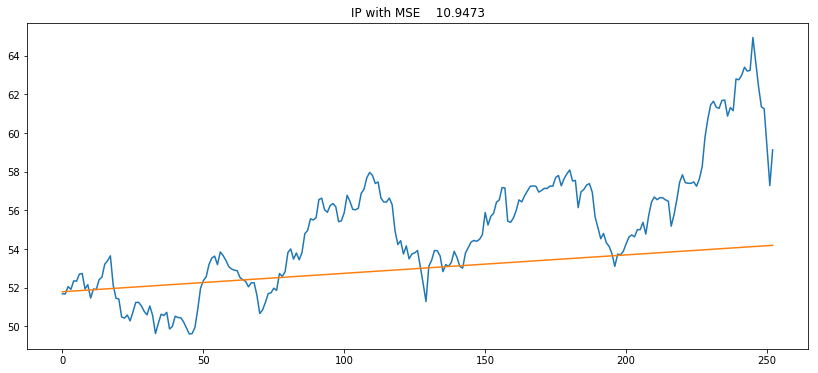

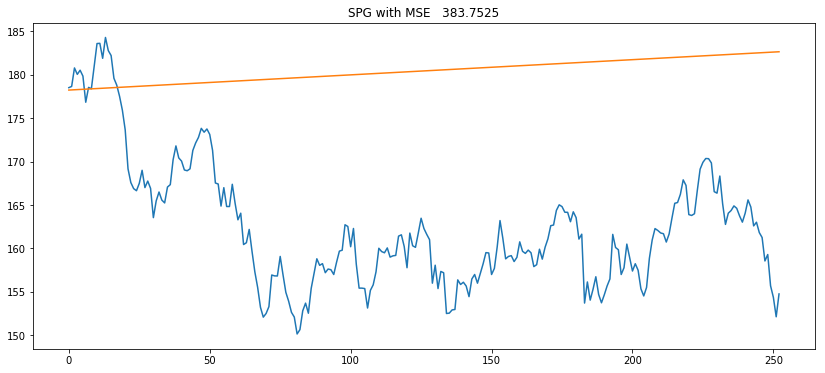

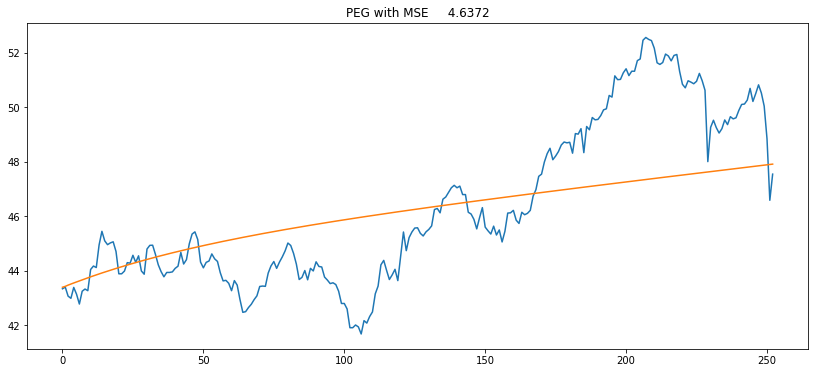

In [69]:
arima_mse_low={}
for i in names:
    model = pm.auto_arima(d_low[i]['Train'].values, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

    arima_mse_low[i]=[]
    y_true = d_low[i]['Test'].values
    y_pred = model.predict(n_periods=len(d_low[i]['Test']))
    MSE = mean_squared_error(y_true, y_pred)
    arima_mse_low[i].append(MSE)
   
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

In [70]:
print(arima_mse_high)

{'DIS': [144.4020482407937], 'GM': [37.989107083584415], 'TAP': [300.399859088868], 'XOM': [6.916584922661291], 'MS': [8.129672162614836], 'CVS': [23.906776437245487], 'RTN': [267.00814983102134], 'MSFT': [137.00447516908264], 'IP': [11.10756879184645], 'SPG': [478.4695037972371], 'PEG': [4.668788463815663]}


In [71]:
print(arima_mse_low)

{'DIS': [151.6293021111894], 'GM': [37.54680623525468], 'TAP': [281.7743363334034], 'XOM': [6.318253026077002], 'MS': [8.09640080257777], 'CVS': [26.336112880069155], 'RTN': [237.2421173674482], 'MSFT': [73.61611691519428], 'IP': [10.947315024417135], 'SPG': [383.7524802364179], 'PEG': [4.637229434003362]}


# Compare the LSTM model MSE with ARIMA mdoel MSE.

In [73]:
arima_high=[]
for i in names:
    arima_high.append(arima_mse_high[i])

arima_low=[]
for i in names:
    arima_low.append(arima_mse_low[i])


comparison=pd.DataFrame(OrderedDict([('Stock Name', names),
                        ('LSTM High', model1_high),
                        ('LSTM Low', model1_low),
                        ('ARIMA High', arima_high),
                        ('ARIMA Low', arima_low)]))
print(comparison)

   Stock Name  LSTM High   LSTM Low            ARIMA High  \
0         DIS  [0.00374]  [0.00366]   [144.4020482407937]   
1          GM  [0.00116]  [0.00122]  [37.989107083584415]   
2         TAP  [0.00169]  [0.00157]    [300.399859088868]   
3         XOM  [0.00259]  [0.00249]   [6.916584922661291]   
4          MS  [0.00118]  [0.00121]   [8.129672162614836]   
5         CVS  [0.00573]  [0.00522]  [23.906776437245487]   
6         RTN  [0.00061]  [0.00067]  [267.00814983102134]   
7        MSFT  [0.00061]  [0.00067]  [137.00447516908264]   
8          IP  [0.00139]  [0.00135]   [11.10756879184645]   
9         SPG  [0.00323]  [0.00302]   [478.4695037972371]   
10        PEG  [0.00116]  [0.00116]   [4.668788463815663]   

               ARIMA Low  
0    [151.6293021111894]  
1    [37.54680623525468]  
2    [281.7743363334034]  
3    [6.318253026077002]  
4     [8.09640080257777]  
5   [26.336112880069155]  
6    [237.2421173674482]  
7    [73.61611691519428]  
8   [10.947315024417135]